# Imports

In [1]:
from collections import Counter
from gensim.models import Word2Vec
from nltk import sent_tokenize
from nltk.corpus import stopwords, wordnet
from nltk.stem import PorterStemmer, SnowballStemmer, WordNetLemmatizer
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer #for word embedding
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score # bag of words
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
import collections
import csv
import gensim
import matplotlib.pyplot as plt
import nltk
import nltk.tokenize
import numpy as np #for text pre-processing
import operator
import pandas as pd
import pathlib
import pickle
import re, string
import seaborn
import string
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt')
nltk.download('wordnet')#for model-building
ps = PorterStemmer()

C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)
In C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_

# Functions

### _1) Reading in files and append them into corpus list_

In [2]:
tok = nltk.tokenize.TreebankWordTokenizer()

def make_corpus(filename):
    corpus = []
    with open(filename, 'r') as f:
        for line in f:
            corpus.extend(t for line in f for t in tok.tokenize(line))
    
    return corpus

### _2) Convert corpus into data frame_

a) voc: counts the total number of tokens in corpus

b) frq_ returns a dataframe with tokens and frequency of each token
    

In [3]:
def dataframe_corpus(corpus):
    voc = collections.Counter(corpus)
    frq = pandas.DataFrame(voc.most_common(), columns=['token', 'frequency'])

    return frq

### _3) Frequency normalized by corpus size and Cumulative normalized frequency inserted into dataframe_

In [4]:
def freq_cum(frq):
    # Index in the sorted list
    frq['idx'] = frq.index + 1

    # Frequency normalised by corpus size
    frq['norm_freq'] = frq.frequency / len(corpus)

    # Cumulative normalised frequency
    frq['cumul_frq'] = frq.norm_freq.cumsum()

    return frq


### _4) Plots for Culumative frequency and Log-log plot for Zipf's law_

In [5]:
seaborn.set(style='whitegrid')

# Plot: Cumulative frequency by index
def freq_cum_plot(frq):
    seaborn.relplot(x='idx', y='cumul_frq', data=frq)
    return plt.show()

# Plot: Cumulative frequency by index, top x tokens
def freq_cum_plot_top_x_tokens(frq, top_x):
    seaborn.relplot(x='idx', y='cumul_frq', data=frq[:int(top_x)], kind='line')
    return plt.show()

# Plot: Log-log plot for Zipf's law
def zipfs_law(frq):
    frq['log_frq'] = numpy.log(frq.frequency)
    frq['log_rank'] = numpy.log(frq.frequency.rank(ascending=True))
    seaborn.relplot(x='log_rank', y='log_frq', data=frq)
    return plt.show()

***

## a.1) Tokenization

In [6]:
def token_sentences(text):
    sentences = sent_tokenize(text)
    return sentences


def tokenization(words,text):
    tokens = word_tokenize(text[1:])
    words = [token.lower() for token in tokens if token.isalpha()]   
    return words

#### a.1.1) Comparing TweetTokenizer with NLTK Tokenizer (Task 1)

In [7]:
from nltk.tokenize import TweetTokenizer
from nltk.tokenize import  word_tokenize

def comparing_tokenizer(text):
    tt = TweetTokenizer()
    tweet_tokenizer = tt.tokenize(text)
    word_tweet_tok = word_tokenize(text)
    return tweet_tokenizer, word_tweet_tok

#output example:

# tweet_tokenizer       = ['#ibelieveblaseyford', 'is', 'liar', 'she', 'is']
# word_tweet_tok (NLTK) = ['#', 'ibelieveblaseyford', 'is', 'liar', 'she']

#### a.1.2) Spacy library

In [8]:
def split_in_sentences(text):
    doc = nlp(text)
    return [str(sent).strip() for sent in doc.sents]

## a.2) Vocabulary 

In [9]:
#converting a dataframe into a single list 
#text is split into words defined by their space inbetween
#words are inserted into list 
def words_list(text):
    #words are inserted into list 
    corpus=[]
    for row in text:
        tokens = row[0].split(" ")
        for token in tokens:
            corpus.append(token)
    
    
    def vocabulary_list(corpus):
        #initlialize the vocabulary
        vocab = list(set(" ".join(corpus)))
        vocab.remove(' ')
        return vocab
      
    
    def split_words_char(corpus):
        #split the word into characters
        corpus = [" ".join(token) for token in corpus]
        #appending </w>
        corpus=[token+' </w>' for token in corpus]
        return corpus
        
    x,y = split_words_char(corpus), vocabulary_list(corpus)
    return x,y


# Creating the Bag of Words model
def bag_of_words(text):
    word2count = {}
    for data in text:
        words = nltk.word_tokenize(data)
        for word in words:  
            if word not in word2count.keys():
                word2count[word] = 1
            else:
                word2count[word] += 1
    return word2count   



## b) Pre-processing and cleaning

In [10]:
# removing punctuations
# convert all words into lower cases
# remove stop words

def preprocess_text(words):
    #delete punctuations
    punctuation_table = str.maketrans('', '', string.punctuation)

    #convert all words into lower cases
    words = [word.translate(punctuation_table).lower() for word in words]
    
    #remove stopwords
    from nltk.corpus import stopwords
    stop_words = stopwords.words('english')
    words = [word for word in words if word not in stop_words]

    return words

# cleaning sentences within data frame
def  clean_text(df, text_field):
    df[text_field] = df[text_field].str.lower()
    df[text_field] = df[text_field].apply(lambda elem: re.sub(r"(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", " ", elem))  
    return df

def del_punctuations(words):
    punctuation_table = str.maketrans('', '', string.punctuation)
    words = [word.translate(punctuation_table).lower() for word in words]
    return words


def stop_words(words):
    stop_words = stopwords.words('english')
    words = [word for word in words if word not in stop_words]
    return words

def word_lemmatizer(text):
    lem_text = [WordNetLemmatizer().lemmatize(i) for i in text]
    return lem_text


## c) Basic statistics

In [11]:
# number of tokens, sentences, average tokens, total unique tokens, total number of tokens after cleaning

def basic_statistics(text,printer = False):
    sents = nltk.sent_tokenize(text)
    tokens = word_tokenize(text[1:])
    words = [token.lower() for token in tokens if token.isalpha()]
    average_tokens = round(len(words)/len(sents))
    unique_tokens = set(words)
    token_ratio = round(len(unique_tokens)/len(tokens),3)
    stop_words = set(stopwords.words('english'))
    final_tokens = []
    for each in words:
        if each not in stop_words:
            final_tokens.append(each)
    if printer == True:
        print(f'The number of characters: {len(text)}')
        print(f'The number of tokens is: {len(tokens)}')
        print(f'The number of sentences is: {len(sents)}')
        print(f'The average number of tokens per sentence is: {average_tokens}')
        print(f'The number of unique tokens are: {len(unique_tokens)}')
        print(f'The tokens ratio is: {token_ratio}')
        print(f'The number of total tokens after removing stopwords are: {len(final_tokens)}')
    return len(text), len(tokens), len(sents), average_tokens, len(unique_tokens), token_ratio, len(final_tokens)

def word_frequency(words):
    frequency_words = collections.Counter(words)
    
    #convert counter object to dictionary
    frequency_words_dict = dict(frequency_words)
    res = dict(sorted(frequency_words_dict.items(), key=lambda item: item[1]))
    return res

def top_20_most_common_words(freq_words):
    res = dict(Counter(freq_words).most_common(20))
    return res

def most_common_words(dictionary):
    # Output a dict of most common words
    return dict(sorted(dictionary.items(),key=lambda x: x[1], reverse=True))

def least_common_words(dictionary):
    return sorted(list(dictionary.items()),key=lambda x: x[1])


# Function for loglog plots
def llplot(list_var, labels, title):
    """Function that takes a list of datasets, list of labels and a title as string, and plots a loglogplot, example:
    llplot([offensive_freq_words_val, offensive_freq_words_train, offensive_freq_words_test], ["val", "train", "test"], "Offensive dataset, loglog plot")
    """
    # Size of the figure:
    plt.figure(figsize = (7,6))
    # Iterating through the datasets:
    for idx, i in enumerate(list_var):
        y = np.log(list(most_common_words(i).values()))
        x = np.log([i for i in range(1,len(y)+1)])
        plt.scatter(x, y, label = labels[idx])
    # Labeling title and axis:
    plt.title(title)
    plt.xlabel("Rank of word")
    plt.ylabel("Frequency of word")
    # Plotting:
    plt.legend()
    plt.show()
    return None


## Spacy - preprocessing/cleaning

In [12]:
def merging_labels_and_sentences(textfile, labelfile):

    # read textfile and labelfile into two separate dataframes
    df_text = pd.read_csv(textfile + '.txt', header=None, skiprows = 0,
        names=['tweet'], sep='\t', quoting=3)
    df_labels = pd.read_csv(labelfile + '.txt',header=None, skiprows = 0, names=['label'],
        sep='\t', quoting=3)

    index_text = [x for x in range(1, len(df_text.values)+1)]

    df_labels.insert(loc=0, column='id', value =index_text)
    df_text.insert(loc=0, column='id', value =index_text)
    final_df = df_text.merge(df_labels, on='id', how='left')

    return final_df

def class_distribution(dataframe,title,xlabel_title):
    x = dataframe['label'].value_counts()
    barplot = seaborn.barplot(x.index, x)
    barplot.set_title(title)
    barplot.set_xlabel(xlabel_title)
    barplot.set_ylabel("Count")
    return barplot

# WORD-COUNT
def word_count(dataframe_col):
    dataframe_col['word_count'] = dataframe_col['tweet'].apply(lambda x: len(str(x).split()))
    
    avg_off_tweets = round(dataframe_col[dataframe_col['label']==1]['word_count'].mean(),3)
    avg_non_off_tweets = round(dataframe_col[dataframe_col['label']==0]['word_count'].mean(),3) 

    return dataframe_col, avg_off_tweets, avg_non_off_tweets

# CHARACTER-COUNT
def char_count(dataframe_col):
    dataframe_col['char_count'] = dataframe_col['tweet'].apply(lambda x: len(str(x)))
    
    #the average characters in offensive tweets
    avg_char_off = round(dataframe_col[dataframe_col['label']==1]['char_count'].mean(),3) 

    #the average characters in non-offensive tweets
    avg_char_non_off = round(dataframe_col[dataframe_col['label']==0]['char_count'].mean(),3)

    return dataframe_col, avg_char_off, avg_char_non_off

def plot_word_count(dataframe):
    # PLOTTING WORD-COUNT
    fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,4))
    dataframe_words=dataframe[dataframe['label']==1]['word_count']
    ax1.hist(dataframe_words,color='red')
    ax1.set_title('offensive tweets')
    dataframe_words=dataframe[dataframe['label']==0]['word_count']
    ax2.hist(dataframe_words,color='green')
    ax2.set_title('non-offensive tweets')
    fig.suptitle('Words per tweet')
    ax2.set_xlabel("Length of tweet")
    ax2.set_ylabel("occurrences")
    ax1.set_xlabel("Length of tweet")
    ax1.set_ylabel("occurrences")
    plt.show()

def missing_values(dataframe):
    res = dataframe.isna().sum()
    return res

#convert to lowercase, strip and remove punctuations
def preprocess(text):
    text = text.lower() 
    text=text.strip()  
    text=re.compile('<.*?>').sub('', text) 
    text = re.compile('[%s]' % re.escape(string.punctuation)).sub(' ', text)  
    text = re.sub('\s+', ' ', text)  
    text = re.sub(r'\[[0-9]*\]',' ',text) 
    text=re.sub(r'[^\w\s]', '', str(text).lower().strip())
    text = re.sub(r'\d',' ',text) 
    text = re.sub(r'\s+',' ',text) 
    return text
 
# STOPWORD REMOVAL
def stopword(string):
    a= [i for i in string.split() if i not in stopwords.words('english')]
    return ' '.join(a)#LEMMATIZATION
# Initialize the lemmatizer
wl = WordNetLemmatizer()
 
# This is a helper function to map NTLK position tags
def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN# Tokenize the sentence
def lemmatizer(string):
    word_pos_tags = nltk.pos_tag(word_tokenize(string)) # Get position tags
    a=[wl.lemmatize(tag[0], get_wordnet_pos(tag[1])) for idx, tag in enumerate(word_pos_tags)] # Map the position tag and lemmatize the word/token
    return " ".join(a)
    
def finalpreprocess(string):
    return lemmatizer(stopword(preprocess(string)))



## D) Classification

In [13]:
#SPLITTING THE VALIDATION DATASET INTO TRAIN AND TEST


def split_dataset(dataframe):
    X_train, X_test, y_train, y_test = train_test_split(dataframe["tweet"],dataframe      
    ["label"],test_size=0.2,shuffle=True)
    return X_train, X_test, y_train, y_test
    
def tokenize_train_test(X_train, X_test):
    #Word2Vec
    # Word2Vec runs on tokenized sentences
    X_train_tok= [nltk.word_tokenize(i) for i in X_train]  
    X_test_tok= [nltk.word_tokenize(i) for i in X_test]

    return X_train_tok, X_test_tok


#building Word2Vec model
class MeanEmbeddingVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        # if a text is empty we should return a vector of zeros
        # with the same dimensionality as all the other vectors
        self.dim = len(next(iter(word2vec.values())))

    def fit(self, X, y):
        return self

    def transform(self, X):
        return np.array([np.mean([self.word2vec[w] 
        for w in words if w in self.word2vec] or [np.zeros(self.dim)], axis=0) 
        for words in X])

#building Word2Vec model
class MeanEmbeddingVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        # if a text is empty we should return a vector of zeros
        # with the same dimensionality as all the other vectors
        self.dim = len(next(iter(word2vec.values())))

    def fit(self, X, y):
        return self

    def transform(self, X):
        return np.array([np.mean([self.word2vec[w] 
        for w in words if w in self.word2vec] or [np.zeros(self.dim)], axis=0) 
        for words in X])

## Model prediction

#### Cleaned

In [14]:
def model_prediction_preprocessed_data(dataframe):
    #Pre-processing the new dataset
    dataframe['clean_text'] = dataframe['tweet'].apply(lambda x: finalpreprocess(x)) 
    
    #preprocess the data
    X_test=dataframe['clean_text'] 

    #converting words to numerical data using tf-idf
    X_vector=tfidf_vectorizer.transform(X_test)

    #use the best model to predict 'target' value for the new dataset 
    y_predict = lr_tfidf.predict(X_vector)      
    y_prob = lr_tfidf.predict_proba(X_vector)[:,1]
    dataframe['predict_prob']= y_prob
    dataframe['label']= y_predict
    final=dataframe[['clean_text','label']].reset_index(drop=True)
    return final 


#### Non cleaned

In [15]:
def model_prediction_nonprocessed_data(dataframe):
    X_test=dataframe['tweet'] 

    #converting words to numerical data using tf-idf
    X_vector=tfidf_vectorizer.transform(X_test)

    #use the best model to predict 'target' value for the new dataset 
    y_predict = lr_tfidf.predict(X_vector)      
    y_prob = lr_tfidf.predict_proba(X_vector)[:,1]
    dataframe['predict_prob']= y_prob
    dataframe['label']= y_predict
    final=dataframe[['tweet','label']].reset_index(drop=True)
    return final 


***
***

# TASK 1: PRE-PROCESSING AND TOKENIZATION
_ splitting text files into words _


## 1.1) Text file: Emoji
***

### Read in txt files: offensive/emoji.txt

In [16]:
file_path_val = pathlib.Path(r'datasets/emoji/val_text.txt')

with open(file_path_val, 'r',encoding="utf8") as f:
    emoji_text_val = f.read()       
    f.close()
    
emoji_words_val_txt = emoji_text_val[1:].split()

print(emoji_words_val_txt[:100])

['little', 'throwback', 'with', 'my', 'favourite', 'person', '@', 'Water', 'Wall', 'glam', 'on', '@user', 'yesterday', 'for', '#kcon', 'makeup', 'using', '@user', 'in', '#featherette,…', 'Democracy', 'Plaza', 'in', 'the', 'wake', 'of', 'a', 'stunning', 'outcome', '#Decision2016', '@', 'NBC', 'News', 'Then', '&amp;', 'Now.', 'VILO', '@', 'Walt', 'Disney', 'Magic', 'Kingdom', 'Who', 'never...', '@', 'A', 'Galaxy', 'Far', 'Far', 'Away', 'Dinner', 'in', 'FLA', 'tonight', '//', 'Pan-seared', 'salmon', 'over', 'couscous', 'veggie', 'salad', '#yum', '#dinner', '#florida', '#salmon…', "It's", 'my', 'fav', 'seniors', 'last', 'game', 'congrats', 'on', 'beating', 'west', '@', 'West', 'Salem…', 'I', 'got', 'to', 'to', 'go', 'formal', 'with', 'my', 'best', 'friend', '@', 'Phi', 'Mu', 'at', 'JSU', "'Cause", 'I', 'Miss', 'My', 'Little', 'Homies', '.#Throwback']


In [17]:
file_path_train = pathlib.Path(r'datasets/emoji/train_text.txt')


with open(file_path_train, 'r',encoding="utf8") as f:
    emoji_text_train = f.read()       
    f.close()
    
emoji_words_train_txt = emoji_text_train[1:].split()
print(emoji_words_train_txt[:100])

['unday', 'afternoon', 'walking', 'through', 'Venice', 'in', 'the', 'sun', 'with', '@user', '️', '️', '️', '@', 'Abbot', 'Kinney,', 'Venice', 'Time', 'for', 'some', 'BBQ', 'and', 'whiskey', 'libations.', 'Chomp,', 'belch,', 'chomp!', '(@', "Lucille's", 'Smokehouse', 'Bar-B-Que)', 'Love', 'love', 'love', 'all', 'these', 'people', '️', '️', '️', '#friends', '#bff', '#celebrate', '#blessed', '#sundayfunday', '@', 'San…', '️', '️', '️', '️', '@', 'Toys"R"Us', 'Man', 'these', 'are', 'the', 'funniest', 'kids', 'ever!!', 'That', 'face!', '#HappyBirthdayBubb', '@', 'FLIPnOUT', 'Xtreme', '#sandiego', '@', 'San', 'Diego,', 'California', 'My', 'little', '️', '️', '️', '️', '️', '#ObsessedWithMyDog', '@', 'Cafe', 'Solstice', 'Capitol', 'Hill', 'More', '#tinyepic', 'things', '#tinyepicwestern,', 'this', 'one', 'is', 'crazy', '@user', 'I', 'may', 'be', 'one', 'of', 'your…', 'Last']


In [18]:
file_path_test = pathlib.Path(r'datasets/emoji/test_text.txt')


with open(file_path_test, 'r',encoding="utf8") as f:
    emoji_text_test = f.read()       
    f.close()
    
emoji_words_test_txt = emoji_text_test[1:].split()
print(emoji_words_test_txt[:100])

['n', 'Pelham', 'Parkway', 'The', 'calm', 'before......', '|', 'w/', 'sofarsounds', '@user', '|', ':', 'B.', 'Hall.......#sofarsounds…', 'Just', 'witnessed', 'the', 'great', 'solar', 'eclipse', '@', 'Tampa,', 'Florida', 'This', 'little', 'lady', 'is', '26', 'weeks', 'pregnant', 'today!', 'Excited', 'for', 'baby', 'Cam', 'to', 'come!', '@', 'Springfield,…', 'Great', 'road', 'trip', 'views!', '@', 'Shartlesville,', 'Pennsylvania', 'CHRISTMAS', 'DEALS', 'BUY', 'ANY', '3', 'SMALL', 'POMADES', '1.5', 'OR', '1.7', 'OZ', 'RECEIVE', 'THE', 'F&amp;S', 'COLLECTOR', 'TIN', '&amp;', 'COMB…', 'the', '#sisterstunt', 'was', 'mad', 'real', 'last', 'night', '#MiaStaxxx', '#AndreaStaxxx', '#denverqueen', '#staxxxlife…', "I'm", 'starting', 'to', 'love', 'shooting', 'in', 'the', 'dark', '#brandonwolfel', '@', 'New', 'York,', 'New', 'York', 'Let', 'the', 'sun', 'shine', 'through', '️', '5x5', 'Feet', '#oilpainting', '#oiloncanvas', '#acrylicpainting']


### Remove punctuations from txt files
_ meaning signs, spacing and other disturbing features. Alle words are then turned into lower cases_

In [19]:


emoji_cleaned_val_words = del_punctuations(emoji_words_val_txt)
emoji_cleaned_train_words = del_punctuations(emoji_words_train_txt)
emoji_cleaned_test_words = del_punctuations(emoji_words_test_txt)

print('val_text.txt:\n',emoji_cleaned_val_words[:100],'\n')

print('\nval_train.txt:\n',emoji_cleaned_train_words[:100], '\n')

print('\nval_test.txt:\n',emoji_cleaned_test_words[:100],'\n')

val_text.txt:
 ['little', 'throwback', 'with', 'my', 'favourite', 'person', '', 'water', 'wall', 'glam', 'on', 'user', 'yesterday', 'for', 'kcon', 'makeup', 'using', 'user', 'in', 'featherette…', 'democracy', 'plaza', 'in', 'the', 'wake', 'of', 'a', 'stunning', 'outcome', 'decision2016', '', 'nbc', 'news', 'then', 'amp', 'now', 'vilo', '', 'walt', 'disney', 'magic', 'kingdom', 'who', 'never', '', 'a', 'galaxy', 'far', 'far', 'away', 'dinner', 'in', 'fla', 'tonight', '', 'panseared', 'salmon', 'over', 'couscous', 'veggie', 'salad', 'yum', 'dinner', 'florida', 'salmon…', 'its', 'my', 'fav', 'seniors', 'last', 'game', 'congrats', 'on', 'beating', 'west', '', 'west', 'salem…', 'i', 'got', 'to', 'to', 'go', 'formal', 'with', 'my', 'best', 'friend', '', 'phi', 'mu', 'at', 'jsu', 'cause', 'i', 'miss', 'my', 'little', 'homies', 'throwback'] 


val_train.txt:
 ['unday', 'afternoon', 'walking', 'through', 'venice', 'in', 'the', 'sun', 'with', 'user', '️', '️', '️', '', 'abbot', 'kinney', 'venice

In [20]:

#nltk.download('punkt')

emoji_sentences_val_txt = token_sentences(emoji_text_val)   
emoji_sentences_train_txt = token_sentences(emoji_text_train)
emoji_sentences_test_txt = token_sentences(emoji_text_test)   

print(emoji_sentences_val_txt[:5])
print(emoji_sentences_train_txt[:5])
print(emoji_sentences_test_txt[:5])

['A little throwback with my favourite person @ Water Wall\nglam on @user yesterday for #kcon makeup using @user in #featherette,…\nDemocracy Plaza in the wake of a stunning outcome #Decision2016 @ NBC News\nThen &amp; Now.', "VILO @ Walt Disney Magic Kingdom\nWho never... @ A Galaxy Far Far Away\nDinner in FLA tonight // Pan-seared salmon over couscous veggie salad #yum #dinner #florida #salmon…\nIt's my fav seniors last game congrats on beating west @ West Salem…\nI got to to go formal with my best friend @ Phi Mu at JSU\n'Cause I Miss My Little Homies .#Throwback #CousinLove @ Indiana University\nBirthday Kisses @ Madison, Wisconsin\nGreat time in Tuscaloosa with my girl!", '@ Bryant–Denny Stadium\nA seguir aprendiendo del mundo de las berries (@ John F. Kennedy International Airport (JFK) in Queens, NY, NY)\n#livinginparadise @ Ramada Plaza Beach Resort\n••In order for your life to be "GREAT" you must first learn to "APPRECIATE" it... •• #Ny…\nThese girls!', '#seniors2016 #memories

### Number of words in each tokenization variables

In [21]:

emoji_token_val = tokenization(emoji_cleaned_val_words, emoji_text_val)
emoji_token_train = tokenization(emoji_cleaned_train_words, emoji_text_train)
emoji_token_test = tokenization(emoji_cleaned_test_words, emoji_text_test)

print(f'Number of words in tokenization for val_text: {len(emoji_token_val)}')
print(f'Number of words in tokenization for val_train: {len(emoji_token_train)}')
print(f'Number of words in tokenization for val_test: {len(emoji_token_test)}')

Number of words in tokenization for val_text: 49661
Number of words in tokenization for val_train: 461690
Number of words in tokenization for val_test: 518019


### Removing stopwords like 'and, or, of, is, had.... etc' 

In [22]:
emoji_cleaned_val_words = stop_words(emoji_token_val)
emoji_cleaned_train_words = stop_words(emoji_token_train)
emoji_cleaned_test_words = stop_words(emoji_token_test)

print(f'Number of words after removing Stop Words: {len(emoji_cleaned_val_words)}')
print(f'Number of words after removing Stop Words: {len(emoji_cleaned_train_words)}')
print(f'Number of words after removing Stop Words: {len(emoji_cleaned_test_words)}')


Number of words after removing Stop Words: 33634
Number of words after removing Stop Words: 314706
Number of words after removing Stop Words: 345902


### Frequency of each word

In [23]:
import collections

#returns frequency of each word
emoji_freq_words_val = word_frequency(emoji_cleaned_val_words)
emoji_freq_words_train = word_frequency(emoji_cleaned_train_words)
emoji_freq_words_test = word_frequency(emoji_cleaned_test_words)


print('_'*112,'\n')
print('Frequency of words in val_text:\n',list(emoji_freq_words_val.items())[-40:-1], '\n')
print('_'*112,'\n')
print('Frequency of words in train_text:\n',list(emoji_freq_words_train.items())[-40:-1], '\n')
print('_'*112,'\n')
print('Frequency of words in test_text:\n',list(emoji_freq_words_test.items())[-40:-1], '\n')
print('_'*112,'\n')

________________________________________________________________________________________________________________ 

Frequency of words in val_text:
 [('friends', 76), ('high', 77), ('much', 78), ('fun', 78), ('first', 79), ('school', 81), ('life', 82), ('thank', 83), ('thanks', 86), ('center', 87), ('california', 87), ('see', 87), ('get', 89), ('city', 91), ('great', 96), ('back', 96), ('little', 99), ('ca', 99), ('university', 103), ('beautiful', 106), ('christmas', 116), ('like', 118), ('birthday', 119), ('last', 120), ('one', 125), ('today', 134), ('got', 137), ('best', 137), ('time', 137), ('good', 138), ('beach', 147), ('york', 148), ('night', 151), ('park', 152), ('day', 223), ('happy', 225), ('amp', 245), ('new', 292), ('love', 389)] 

________________________________________________________________________________________________________________ 

Frequency of words in train_text:
 [('city', 738), ('francisco', 746), ('great', 751), ('fun', 756), ('little', 778), ('see', 783), (

### Vocabulary list for offensive text files
_Looking through vocabulary lists can help you find problems
(especially tokens that only occur once or twice)._

In [24]:


emoji_corpus_val, emoji_vocab_val = words_list(emoji_text_val)
emoji_corpus_train, emoji_vocab_train = words_list(emoji_text_train)
emoji_corpus_test, emoji_vocab_test = words_list(emoji_text_test)

print('Vocabulary for text_val.txt:\n', emoji_vocab_val[:20],'\n')
print('Vocabulary for text_train.txt:\n', emoji_vocab_train[:20],'\n')
print('Vocabulary for text_test.txt:\n', emoji_vocab_test[:20],'\n')

Vocabulary for text_val.txt:
 ['q', '米', '朝', 'ｇ', '↠', 'O', '辺', 'd', 'リ', 'R', 'Z', 'z', 'イ', 'ϯ', '갓', 'Φ', '€', '♡', 'チ', 'K'] 

Vocabulary for text_train.txt:
 ['q', '八', 'っ', 'R', 'с', 'ô', 'Z', '๐', '華', 'ت', '피', '\U000fe4e6', 'h', '슬', 'G', '楽', 'ك', '새', 'ç', '롭'] 

Vocabulary for text_test.txt:
 ['q', 'ၚ', 'R', 'グ', 'с', 'ô', 'Z', 'د', '𝒶', '\U000fe4e6', 'h', 'G', '𝓉', '楽', 'ك', 'ç', 'Θ', 'ｎ', '้', '雪'] 



### Read in txt files: offensive/val_text.txt

In [25]:
#offensive_

In [26]:
file_path_val = pathlib.Path(r'datasets/offensive/val_text.txt')

with open(file_path_val, 'r',encoding="utf8") as f:
    offensive_text_val = f.read()       
    f.close()
    
offensive_words_val_txt = offensive_text_val[1:].split()

print(offensive_words_val_txt[:100])

['user', '@user', 'WiiU', 'is', 'not', 'even', 'a', 'real', 'console.', '@user', '@user', '@user', 'If', 'he', 'is', 'from', 'AZ', 'I', 'would', 'put', 'my', 'money', 'on', 'sex', 'with', 'underage', 'kids.', '@user', 'I', 'thought', 'Canada', 'had', 'strict', 'gun', 'control.', 'Help', 'me', 'understand', 'what', 'is', 'happening.', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Following', 'all', '#Maga', 'patriots', 'please', 'follow', 'back', '👍', '#LionsDen', '🦁', '#MAGA2KAG', '🇺🇸', '1', 'Minute', 'of', 'Truth:', 'Gun', 'Control', 'via', '@user', '@user', '@user', '@user', 'We', 'could', 'help', 'if', 'you', 'are', 'London', 'based', '😊', '@user', '@user', 'There', 'r', '65', 'million', 'that', 'can', 'sign', 'to', 'the']


In [27]:
file_path_train = pathlib.Path(r'datasets/offensive/train_text.txt')


with open(file_path_train, 'r',encoding="utf8") as f:
    offensive_text_train = f.read()       
    f.close()
    
offensive_words_train_txt = offensive_text_train[1:].split()
print(offensive_words_train_txt[:100])

['user', 'Bono...', 'who', 'cares.', 'Soon', 'people', 'will', 'understand', 'that', 'they', 'gain', 'nothing', 'from', 'following', 'a', 'phony', 'celebrity.', 'Become', 'a', 'Leader', 'of', 'your', 'people', 'instead', 'or', 'help', 'and', 'support', 'your', 'fellow', 'countrymen.', '@user', 'Eight', 'years', 'the', 'republicans', 'denied', 'obama’s', 'picks.', 'Breitbarters', 'outrage', 'is', 'as', 'phony', 'as', 'their', 'fake', 'president.', '@user', 'Get', 'him', 'some', 'line', 'help.', 'He', 'is', 'gonna', 'be', 'just', 'fine.', 'As', 'the', 'game', 'went', 'on', 'you', 'could', 'see', 'him', 'progressing', 'more', 'with', 'his', 'reads.', 'He', 'brought', 'what', 'has', 'been', 'missing.', 'The', 'deep', 'ball', 'presence.', 'Now', 'he', 'just', 'needs', 'a', 'little', 'more', 'time', '@user', '@user', 'She', 'is', 'great.', 'Hi', 'Fiona!', '@user']


In [28]:
file_path_test = pathlib.Path(r'datasets/offensive/test_text.txt')


with open(file_path_test, 'r',encoding="utf8") as f:
    offensive_text_test = f.read()       
    f.close()
    
offensive_words_test_txt = offensive_text_test[1:].split()
print(offensive_words_test_txt[:100])

['ibelieveblaseyford', 'is', 'liar', 'she', 'is', 'fat', 'ugly', 'libreal', '#snowflake', 'she', 'sold', 'her', 'herself', 'to', 'get', 'some', 'cash', '!!', 'From', 'dems', 'and', 'Iran', '!', 'Why', 'she', 'spoke', 'after', '#JohnKerryIranMeeting', '?', '@user', '@user', '@user', 'I', 'got', 'in', 'a', 'pretty', 'deep', 'debate', 'with', 'my', 'friend', 'and', 'she', 'told', 'me', 'that', 'latinos', 'for', 'Trump', 'and', 'blacks', 'for', 'Trump', 'were', 'paid', 'supporters', '😂', 'then', 'I', 'said', 'you', 'mean', 'antifa', 'are', 'paid', 'domestic', 'terrorist', 'and', 'she', 'said', 'No', 'they', 'are', 'anti-fascist', 'then', 'I', 'said', 'they', 'are', 'the', 'fascist', 'are', 'you', 'kidding', 'me?!', '...if', 'you', 'want', 'more', 'shootings', 'and', 'more', 'death,', 'then', 'listen', 'to', 'the', 'ACLU,', 'Black']


### Remove punctuations from txt files
_ meaning signs, spacing and other disturbing features. Alle words are then turned into lower cases_

In [29]:

offensive_cleaned_val_words = del_punctuations(offensive_words_val_txt)
offensive_cleaned_train_words = del_punctuations(offensive_words_train_txt)
offensive_cleaned_test_words = del_punctuations(offensive_words_test_txt)

print('val_text.txt:\n',offensive_cleaned_val_words[:100],'\n')

print('\nval_train.txt:\n',offensive_cleaned_train_words[:100], '\n')

print('\nval_test.txt:\n',offensive_cleaned_test_words[:100],'\n')

val_text.txt:
 ['user', 'user', 'wiiu', 'is', 'not', 'even', 'a', 'real', 'console', 'user', 'user', 'user', 'if', 'he', 'is', 'from', 'az', 'i', 'would', 'put', 'my', 'money', 'on', 'sex', 'with', 'underage', 'kids', 'user', 'i', 'thought', 'canada', 'had', 'strict', 'gun', 'control', 'help', 'me', 'understand', 'what', 'is', 'happening', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'following', 'all', 'maga', 'patriots', 'please', 'follow', 'back', '👍', 'lionsden', '🦁', 'maga2kag', '🇺🇸', '1', 'minute', 'of', 'truth', 'gun', 'control', 'via', 'user', 'user', 'user', 'user', 'we', 'could', 'help', 'if', 'you', 'are', 'london', 'based', '😊', 'user', 'user', 'there', 'r', '65', 'million', 'that', 'can', 'sign', 'to', 'the'] 


val_train.txt:
 ['user', 'bono', 'who', 'cares', 'soon', 'people', 'will', 'understand', 'that', 'they', 'gain', 'nothing', 'from', 'following', 'a', 'phony', 'celebrity', 'become', 

### Number of words in each tokenization variables

In [30]:
from nltk.tokenize import word_tokenize


offensive_token_val = tokenization(offensive_cleaned_val_words, offensive_text_val)
offensive_token_train = tokenization(offensive_cleaned_train_words, offensive_text_train)
offensive_token_test = tokenization(offensive_cleaned_test_words, offensive_text_test)

print(f'Number of words in tokenization for val_text: {len(offensive_token_val)}')
print(f'Number of words in tokenization for val_train: {len(offensive_token_train)}')
print(f'Number of words in tokenization for val_test: {len(offensive_token_test)}')

Number of words in tokenization for val_text: 30491
Number of words in tokenization for val_train: 258990
Number of words in tokenization for val_test: 19711


### Removing stopwords like 'and, or, of, is, had.... etc' 

In [31]:
from nltk.corpus import stopwords


offensive_cleaned_val_words = stop_words(offensive_token_val)
offensive_cleaned_train_words = stop_words(offensive_token_train)
offensive_cleaned_test_words = stop_words(offensive_token_test)

print(f'Number of words after removing Stop Words: {len(offensive_cleaned_val_words)}')
print(f'Number of words after removing Stop Words: {len(offensive_cleaned_train_words)}')
print(f'Number of words after removing Stop Words: {len(offensive_cleaned_test_words)}')


Number of words after removing Stop Words: 17203
Number of words after removing Stop Words: 147828
Number of words after removing Stop Words: 11143


### Frequency of each word

In [32]:
import collections

#returns frequency of each word
offensive_freq_words_val = word_frequency(offensive_cleaned_val_words)
offensive_freq_words_train = word_frequency(offensive_cleaned_train_words)
offensive_freq_words_test = word_frequency(offensive_cleaned_test_words)


print('_'*112,'\n')
print('Frequency of words in val_text:\n',list(offensive_freq_words_val.items())[-40:-1], '\n')
print('_'*112,'\n')
print('Frequency of words in train_text:\n',list(offensive_freq_words_train.items())[-40:-1], '\n')
print('_'*112,'\n')
print('Frequency of words in test_text:\n',list(offensive_freq_words_test.items())[-40:-1], '\n')
print('_'*112,'\n')

________________________________________________________________________________________________________________ 

Frequency of words in val_text:
 [('love', 31), ('great', 31), ('much', 32), ('democrats', 32), ('country', 32), ('could', 33), ('vote', 33), ('shit', 33), ('never', 35), ('believe', 35), ('way', 35), ('need', 36), ('say', 37), ('still', 38), ('time', 40), ('make', 40), ('go', 41), ('good', 42), ('even', 43), ('see', 44), ('right', 46), ('going', 47), ('us', 52), ('want', 55), ('would', 61), ('amp', 62), ('think', 68), ('trump', 70), ('one', 72), ('get', 74), ('know', 77), ('people', 89), ('maga', 98), ('conservatives', 107), ('like', 110), ('antifa', 119), ('control', 125), ('gun', 133), ('liberals', 139)] 

________________________________________________________________________________________________________________ 

Frequency of words in train_text:
 [('better', 237), ('vote', 239), ('well', 248), ('much', 249), ('left', 253), ('still', 263), ('make', 277), ('way', 2

# My approach to task 1

In [33]:
#This is the ideal tokenization from the library we were supposed to compare it with
from nltk.tokenize import TweetTokenizer
tknzr = TweetTokenizer()

sentence = 'Heroin is my passion.'

tknzr.tokenize(sentence)

['Heroin', 'is', 'my', 'passion', '.']

In [34]:
#Recreate
import re
import pathlib

file_path_train = pathlib.Path(r'datasets/offensive/train_text.txt')

token_pattern = re.compile(r'\w+')

with open(file_path_train, 'r',encoding="utf8") as f:
    line = f.readline()
    tokens = []
    while line:
        line = f.readline()
        print(line)
        print("OUR beta tokenizer",re.findall(token_pattern,line))
        print("DESIRED  tokenizer",tknzr.tokenize(line))
        print('\n')
    

@user Eight years the republicans denied obama’s picks. Breitbarters outrage is as phony as their fake president. 

OUR beta tokenizer ['user', 'Eight', 'years', 'the', 'republicans', 'denied', 'obama', 's', 'picks', 'Breitbarters', 'outrage', 'is', 'as', 'phony', 'as', 'their', 'fake', 'president']
DESIRED  tokenizer ['@user', 'Eight', 'years', 'the', 'republicans', 'denied', 'obama', '’', 's', 'picks', '.', 'Breitbarters', 'outrage', 'is', 'as', 'phony', 'as', 'their', 'fake', 'president', '.']


@user Get him some line help. He is gonna be just fine. As the game went on you could see him progressing more with his reads. He brought what has been missing. The deep ball presence. Now he just needs a little more time 

OUR beta tokenizer ['user', 'Get', 'him', 'some', 'line', 'help', 'He', 'is', 'gonna', 'be', 'just', 'fine', 'As', 'the', 'game', 'went', 'on', 'you', 'could', 'see', 'him', 'progressing', 'more', 'with', 'his', 'reads', 'He', 'brought', 'what', 'has', 'been', 'missing', 

DESIRED  tokenizer ['@user', 'Hope', 'they', 'continue', 'to', 'crash', '@user']


@user    You warned everyone about Josh Gordon the last 4 months on a daily basis.  I'm sure you are as shocked as I am of what transpired today. 

OUR beta tokenizer ['user', 'You', 'warned', 'everyone', 'about', 'Josh', 'Gordon', 'the', 'last', '4', 'months', 'on', 'a', 'daily', 'basis', 'I', 'm', 'sure', 'you', 'are', 'as', 'shocked', 'as', 'I', 'am', 'of', 'what', 'transpired', 'today']
DESIRED  tokenizer ['@user', 'You', 'warned', 'everyone', 'about', 'Josh', 'Gordon', 'the', 'last', '4', 'months', 'on', 'a', 'daily', 'basis', '.', "I'm", 'sure', 'you', 'are', 'as', 'shocked', 'as', 'I', 'am', 'of', 'what', 'transpired', 'today', '.']


@user @user Christine Ford is an admitted friend to Bernie Saunders and she is Known to Hobnob with other demo politicians! Most shocking word is Kavanaughs mom a Judge ruled against Fords parents in a forclosure case in mid 90s🤔 

OUR beta tokenizer ['user', 'user',

DESIRED  tokenizer ['@user', 'Never', 'would', 'I', 'trust', 'any', '@user', 'and', 'especially', '@user', 'they', 'sold', 'out', 'to', 'the', '@user', 'and', 'stuck', 'Two', 'fingers', 'up', 'to', 'the', 'People', 'of', 'the', 'UK', '!', '!', '#VoteLabour', '#GE2018NOW', '#WeAreCorbyn', '#UnitedWeStand']


@user Be careful.. you know the terrorist arm of the @user antifa is going to show up an try something.. 

OUR beta tokenizer ['user', 'Be', 'careful', 'you', 'know', 'the', 'terrorist', 'arm', 'of', 'the', 'user', 'antifa', 'is', 'going', 'to', 'show', 'up', 'an', 'try', 'something']
DESIRED  tokenizer ['@user', 'Be', 'careful', '..', 'you', 'know', 'the', 'terrorist', 'arm', 'of', 'the', '@user', 'antifa', 'is', 'going', 'to', 'show', 'up', 'an', 'try', 'something', '..']


@user Whenever ya'll reference the wire all I'm going to think is exit stage left 

OUR beta tokenizer ['user', 'Whenever', 'ya', 'll', 'reference', 'the', 'wire', 'all', 'I', 'm', 'going', 'to', 'think', 'is',

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Awesome', 'Q', 'meme', 'on', 'that', '!']


@user Fun fact: rural areas with extremely high gun ownership rates has nearly-zero homicide rates while urban areas with extreme gun control (low ownership rates) has astronomically high homicide rates. Why is the correlation exactly opposite? 

OUR beta tokenizer ['user', 'Fun', 'fact', 'rural', 'areas', 'with', 'extremely', 'high', 'gun', 'ownership', 'rates', 'has', 'nearly', 'zero', 'homicide', 'rates', 'while', 'urban', 'areas', 'with', 'extreme', 'gun', 'control', 'low', 'ownership', 'rates', 'has', 'astronomically', 


@user It’s more what she does than who she is 

OUR beta tokenizer ['user', 'It', 's', 'more', 'what', 'she', 'does', 'than', 'who', 'she', 'is']
DESIRED  tokenizer ['@user', 'It', '’', 's', 'more', 'what', 'she', 'does', 'than', 'who', 'she', 'is']


@user Hes sure as hell not one of is either... traitor liberals- all of them- 

OUR beta tokenizer ['user', 'Hes', 'sure', 'as', 'hell', 'not', 'one', 'of', 'is', 'either', 'traitor', 'liberals', 'all', 'of', 'them']
DESIRED  tokenizer ['@user', 'Hes', 'sure', 'as', 'hell', 'not', 'one', 'of', 'is', 'either', '...', 'traitor', 'liberals', '-', 'all', 'of', 'them', '-']


@user @user @user You are hilarious!  You keep defending that woman.  I have watched her for over 20 years and she is a liar and a hypocrite and an obstructionist.  I like my crumbs"".  She needs people like you to support her though."" 

OUR beta tokenizer ['user', 'user', 'user', 'You', 'are', 'hilarious', 'You', 'keep', 'defending', 'that', 'woman', 'I', 'have', 'watc

DESIRED  tokenizer ['@user', 'You', 'know', 'what', 'will', 'make', 'this', 'professor', 'even', 'woker', '"', '"', '?', 'If', "he's", 'a', 'gun', 'control', 'nut', '...', '"', '"']


@user @user tough to speak your mind at work if your a conservative..amazing that this occurred in work setting. Bizarre. 

OUR beta tokenizer ['user', 'user', 'tough', 'to', 'speak', 'your', 'mind', 'at', 'work', 'if', 'your', 'a', 'conservative', 'amazing', 'that', 'this', 'occurred', 'in', 'work', 'setting', 'Bizarre']
DESIRED  tokenizer ['@user', '@user', 'tough', 'to', 'speak', 'your', 'mind', 'at', 'work', 'if', 'your', 'a', 'conservative', '..', 'amazing', 'that', 'this', 'occurred', 'in', 'work', 'setting', '.', 'Bizarre', '.']


@user He is not allowed to do this he needs to be prosecuted 

OUR beta tokenizer ['user', 'He', 'is', 'not', 'allowed', 'to', 'do', 'this', 'he', 'needs', 'to', 'be', 'prosecuted']
DESIRED  tokenizer ['@user', 'He', 'is', 'not', 'allowed', 'to', 'do', 'this', 'he', 'need

DESIRED  tokenizer ['@user', '@user', '@user', 'Great', '.', 'Here', '’', 's', 'how', 'today', 'has', 'gone', ':', 'Floris', 'wanted', 'to', 'spank', 'me', '.', 'Leah', 'wanted', 'to', 'stab', 'me', '.', 'Curtis', 'won', '’', 't', 'back', 'me', 'up', '.', 'Adam', 'still', 'looks', 'great', 'at', '67', 'or', 'however', 'old', 'as', 'fuck', 'he', 'is', '...', 'KL', 'has', 'a', 'bigger', 'dick', 'than', 'me', 'but', 'she', '’', 's', 'a', 'she', '...', 'he', '🤔', '...', 'she', '?', '!', '?']


@user Hitler would be so proud of David Hogg 

OUR beta tokenizer ['user', 'Hitler', 'would', 'be', 'so', 'proud', 'of', 'David', 'Hogg']
DESIRED  tokenizer ['@user', 'Hitler', 'would', 'be', 'so', 'proud', 'of', 'David', 'Hogg']


@user But not long ago the same Ray went off on a follower (who quite possibly pays for his services) for pointing out a guy (don’t remember who) for getting injured again. You guys pay this assholes bills 

OUR beta tokenizer ['user', 'But', 'not', 'long', 'ago', 'the', '

DESIRED  tokenizer ['--->', 'The', 'American', 'Revolution', 'would', 'never', 'have', 'happened', 'with', 'gun', 'control', '.', '#USConstitution']


@user Its interesting to see the hypocrisy with these liberals when last year it was discovered that there was a “Hush Fund” for Congressional  Sexual Scandals while working for the government 

OUR beta tokenizer ['user', 'Its', 'interesting', 'to', 'see', 'the', 'hypocrisy', 'with', 'these', 'liberals', 'when', 'last', 'year', 'it', 'was', 'discovered', 'that', 'there', 'was', 'a', 'Hush', 'Fund', 'for', 'Congressional', 'Sexual', 'Scandals', 'while', 'working', 'for', 'the', 'government']
DESIRED  tokenizer ['@user', 'Its', 'interesting', 'to', 'see', 'the', 'hypocrisy', 'with', 'these', 'liberals', 'when', 'last', 'year', 'it', 'was', 'discovered', 'that', 'there', 'was', 'a', '“', 'Hush', 'Fund', '”', 'for', 'Congressional', 'Sexual', 'Scandals', 'while', 'working', 'for', 'the', 'government']


@user @user @user I am sure he is doi

DESIRED  tokenizer ['@user', '@user', 'The', 'last', 'thing', 'parents', 'need', 'to', 'learn', 'from', 'the', 'liberals', 'is', 'the', 'ethics', 'of', 'raising', 'their', 'own', 'child', '.']


@user Blocked 

OUR beta tokenizer ['user', 'Blocked']
DESIRED  tokenizer ['@user', 'Blocked']


@user She is unfit for office . Mentally deranged.. unstable.. 

OUR beta tokenizer ['user', 'She', 'is', 'unfit', 'for', 'office', 'Mentally', 'deranged', 'unstable']
DESIRED  tokenizer ['@user', 'She', 'is', 'unfit', 'for', 'office', '.', 'Mentally', 'deranged', '..', 'unstable', '..']


@user @user @user Not really I have several shares in Nike I’m a capitalist not a socialist. I believe in free markets. I can use liberals for my advantages. You on the other hand keep standing with your representatives they will lead you down the golden path of higher taxes and wealth sharing 

OUR beta tokenizer ['user', 'user', 'user', 'Not', 'really', 'I', 'have', 'several', 'shares', 'in', 'Nike', 'I', 'm', '

DESIRED  tokenizer ['@user', '@user', '@user', 'Because', 'the', 'non-citizens', 'are', 'looking', 'for', 'a', 'free', 'ride', 'on', 'the', 'backs', 'of', 'the', 'American', 'taxpayer', 'and', 'liberals', 'are', 'looking', 'for', 'votes', '.', "It's", 'like', 'a', 'pyramid', '.', 'They', 'need', 'to', 'bring', 'new', 'people', 'in', 'at', 'the', 'bottom', 'to', 'support', 'them', 'at', 'the', 'top', '.']


@user Can you elaborate why you think making tax cuts permanent is a bad idea? 

OUR beta tokenizer ['user', 'Can', 'you', 'elaborate', 'why', 'you', 'think', 'making', 'tax', 'cuts', 'permanent', 'is', 'a', 'bad', 'idea']
DESIRED  tokenizer ['@user', 'Can', 'you', 'elaborate', 'why', 'you', 'think', 'making', 'tax', 'cuts', 'permanent', 'is', 'a', 'bad', 'idea', '?']


@user you live in the big dick part cause your gay 

OUR beta tokenizer ['user', 'you', 'live', 'in', 'the', 'big', 'dick', 'part', 'cause', 'your', 'gay']
DESIRED  tokenizer ['@user', 'you', 'live', 'in', 'the', 'big

DESIRED  tokenizer ['@user', '@user', '@user', '@user', 'Ooh', 'but', 'coming', 'from', 'Mr.Rapist', 'We', 'are', 'all', 'the', 'same', 'alias', 'and', 'one', 'person', 'A', '55yr', 'old', 'Antifa', 'Granny', 'Go', 'Figure', 'Sept', '.', '30th', "couldn't", 'come', 'anytime', 'sooner', "isn't", 'that', 'right', 'Brother', '(', 'Grok', ')', 'Old', 'toothless', 'will', 'be', 'getting', 'a', 'rude', 'awakening', 'along', 'with', 'his', 'Housewives']


@user Now that's what I call an Antifa Supersoldier 

OUR beta tokenizer ['user', 'Now', 'that', 's', 'what', 'I', 'call', 'an', 'Antifa', 'Supersoldier']
DESIRED  tokenizer ['@user', 'Now', "that's", 'what', 'I', 'call', 'an', 'Antifa', 'Supersoldier']


@user Yes, watching an elitist prima donna toss a tantrum on the court when she is called out &amp; penalized for ('cheating') getting coaching is pretty entertaining! HER COACH EVEN ADMITTED, I WAS COACHING HER."" Now, back to our regularly scheduled sanity, rule of law &amp; accountabilit

DESIRED  tokenizer ['@user', '@user', '@user', 'Are', 'you', 'suggesting', 'that', 'I', 'fall', 'for', 'that', '?', 'I', 'certainly', 'do', 'not', 'support', 'the', 'liberals', 'vis-à-ve', 'Democrats', 'agenda', '.', 'Read', 'my', 'Tweets', '.', 'I', '’', 'm', 'on', 'the', 'right', 'so', 'VOTE', 'GOP', '🇺', '🇸', '.']


@user @user @user The only ones building on hate and division right now are the Dems and their enforcers Antifa and Naxine Watters. 

OUR beta tokenizer ['user', 'user', 'user', 'The', 'only', 'ones', 'building', 'on', 'hate', 'and', 'division', 'right', 'now', 'are', 'the', 'Dems', 'and', 'their', 'enforcers', 'Antifa', 'and', 'Naxine', 'Watters']
DESIRED  tokenizer ['@user', '@user', '@user', 'The', 'only', 'ones', 'building', 'on', 'hate', 'and', 'division', 'right', 'now', 'are', 'the', 'Dems', 'and', 'their', 'enforcers', 'Antifa', 'and', 'Naxine', 'Watters', '.']


@user I am jealous.  I would love to work in the White House with these fine people.  Hell I would du

DESIRED  tokenizer ['@user', 'AARON', 'RODGERS', 'WILL', 'NEVER', 'WIN', 'A', 'RING', 'THE', 'REST', 'OF', 'HIS', 'SAD', 'ASS', 'CAREER', '!', 'I', 'HOPE', 'YOU', 'HIS', 'REGULAR', 'SEASON', 'HEROICS', 'CAUSE', 'THATS', 'ALL', 'HE', 'IS', 'GOOD', 'FOR', '!', 'HAVE', 'A', 'NICE', 'DAY', '!']


@user OH MY GOSH!! I LOVE HER!!!! a beautiful loaf &lt;3 you are an angel for taking care of her! 

OUR beta tokenizer ['user', 'OH', 'MY', 'GOSH', 'I', 'LOVE', 'HER', 'a', 'beautiful', 'loaf', 'lt', '3', 'you', 'are', 'an', 'angel', 'for', 'taking', 'care', 'of', 'her']
DESIRED  tokenizer ['@user', 'OH', 'MY', 'GOSH', '!', '!', 'I', 'LOVE', 'HER', '!', '!', '!', 'a', 'beautiful', 'loaf', '<3', 'you', 'are', 'an', 'angel', 'for', 'taking', 'care', 'of', 'her', '!']


@user @user He is both evil and delusional. He eats those high quality paint chips. 

OUR beta tokenizer ['user', 'user', 'He', 'is', 'both', 'evil', 'and', 'delusional', 'He', 'eats', 'those', 'high', 'quality', 'paint', 'chips']
DES

DESIRED  tokenizer ['@user', '@user', 'These', 'liberals', 'have', 'no', 'problem', 'lying', '.']


@user You're welcome and I do mean it. You are super cute 

OUR beta tokenizer ['user', 'You', 're', 'welcome', 'and', 'I', 'do', 'mean', 'it', 'You', 'are', 'super', 'cute']
DESIRED  tokenizer ['@user', "You're", 'welcome', 'and', 'I', 'do', 'mean', 'it', '.', 'You', 'are', 'super', 'cute']


(9) Well all sides except us conservatives. We are still striving 2 be reasonable with completely unreasonable opposition. How do U get out of gravity of a black hole with the moon lander rocket? You can't. What you need is a star destroyer warp drive. So why act like we can? 

OUR beta tokenizer ['9', 'Well', 'all', 'sides', 'except', 'us', 'conservatives', 'We', 'are', 'still', 'striving', '2', 'be', 'reasonable', 'with', 'completely', 'unreasonable', 'opposition', 'How', 'do', 'U', 'get', 'out', 'of', 'gravity', 'of', 'a', 'black', 'hole', 'with', 'the', 'moon', 'lander', 'rocket', 'You', 'can',

DESIRED  tokenizer ['Maybe', 'in', '2020', '(', 'if', 'Trump', 'is', 'still', 'around', ')', 'the', 'Democratic', 'challenger', 'will', 'invite', 'all', 'the', 'women', 'Trump', 'has', 'threatened', 'or', 'raped', 'to', 'the', 'debates', '.', '#Fear', '#BobWoodward', '#TheResistance', '#MAGAts', '#MAGA']


@user Or the ones we lose when the NRA challenges reasonable gun control measures as unconstitutional as they did the new laws that the #Parkland kids helped get passed in FL. 

OUR beta tokenizer ['user', 'Or', 'the', 'ones', 'we', 'lose', 'when', 'the', 'NRA', 'challenges', 'reasonable', 'gun', 'control', 'measures', 'as', 'unconstitutional', 'as', 'they', 'did', 'the', 'new', 'laws', 'that', 'the', 'Parkland', 'kids', 'helped', 'get', 'passed', 'in', 'FL']
DESIRED  tokenizer ['@user', 'Or', 'the', 'ones', 'we', 'lose', 'when', 'the', 'NRA', 'challenges', 'reasonable', 'gun', 'control', 'measures', 'as', 'unconstitutional', 'as', 'they', 'did', 'the', 'new', 'laws', 'that', 'the', 

DESIRED  tokenizer ['@user', 'Bring', 'back', 'Alex', '...', 'Jack', '...', 'or', 'Ban', 'NYT', 'too', '...']


@user Yes he is ! But he still won't be fired ... 

OUR beta tokenizer ['user', 'Yes', 'he', 'is', 'But', 'he', 'still', 'won', 't', 'be', 'fired']
DESIRED  tokenizer ['@user', 'Yes', 'he', 'is', '!', 'But', 'he', 'still', "won't", 'be', 'fired', '...']


@user @user @user Hi! Welcome to Twitter! lol you must have missed the entire week of tweets talking about how Reggie was doomed and we had MAGA running our football operations! Lol 

OUR beta tokenizer ['user', 'user', 'user', 'Hi', 'Welcome', 'to', 'Twitter', 'lol', 'you', 'must', 'have', 'missed', 'the', 'entire', 'week', 'of', 'tweets', 'talking', 'about', 'how', 'Reggie', 'was', 'doomed', 'and', 'we', 'had', 'MAGA', 'running', 'our', 'football', 'operations', 'Lol']
DESIRED  tokenizer ['@user', '@user', '@user', 'Hi', '!', 'Welcome', 'to', 'Twitter', '!', 'lol', 'you', 'must', 'have', 'missed', 'the', 'entire', 'week', 

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', 'Perhaps', 'asking', 'Miss', 'Rao', 'directly', 'would', 'be', 'a', 'start', '?', 'Manners', 'Isaac', '.']


@user All Trump's fault I guess 

OUR beta tokenizer ['user', 'All', 'Trump', 's', 'fault', 'I', 'guess']
DESIRED  tokenizer ['@user', 'All', "Trump's", 'fault', 'I', 'guess']


@user @user Retweet this 42 times. 

OUR beta tokenizer ['user', 'user', 'Retweet', 'this', '42', 'times']
DESIRED  tokenizer ['@user', '@user', 'Retweet', 'this', '42', 'times', '.']


I am all in. #MAGA #WWG1WGA 

OUR beta tokenizer ['I', 'am', 'all', 'in', 'MAGA', 'WWG1WGA']
DESIRED  tokenizer ['I', 'am', 'all', 'in', '.', '#MAGA', '#WWG1WGA']


@user He knows you’ll deny him a fair exchange - Based on recent and past interactions with Conservatives - Speaks to your poor ratings. 

OUR beta tokenizer ['user', 'He', 'knows', 'you', 'll', 'deny', 'him', 'a', 'fair', 'exchange', 'Based', 'on', 'recent', 'and', 'past', 'interactions

DESIRED  tokenizer ['Low', 'T', 'and', 'the', 'Poontang', 'Clan', 'aka', 'Fucking', 'Donald', 'Trump', '#trump', '#maga', '#art', '#comicart']


@user @user He is a godless heathen @user 

OUR beta tokenizer ['user', 'user', 'He', 'is', 'a', 'godless', 'heathen', 'user']
DESIRED  tokenizer ['@user', '@user', 'He', 'is', 'a', 'godless', 'heathen', '@user']


@user He will get what he deserves😈 

OUR beta tokenizer ['user', 'He', 'will', 'get', 'what', 'he', 'deserves']
DESIRED  tokenizer ['@user', 'He', 'will', 'get', 'what', 'he', 'deserves', '😈']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user Do you know what ANTIFA stands for? 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'use

DESIRED  tokenizer ['@user', 'I', 'was', 'on', 'some', 'shit', 'last', 'night']


@user a perfect description of ANTiFA. Fascist shit bags. 

OUR beta tokenizer ['user', 'a', 'perfect', 'description', 'of', 'ANTiFA', 'Fascist', 'shit', 'bags']
DESIRED  tokenizer ['@user', 'a', 'perfect', 'description', 'of', 'ANTiFA', '.', 'Fascist', 'shit', 'bags', '.']


@user Either way we have your back. Don't be thinking that you are dealing alone out here. 

OUR beta tokenizer ['user', 'Either', 'way', 'we', 'have', 'your', 'back', 'Don', 't', 'be', 'thinking', 'that', 'you', 'are', 'dealing', 'alone', 'out', 'here']
DESIRED  tokenizer ['@user', 'Either', 'way', 'we', 'have', 'your', 'back', '.', "Don't", 'be', 'thinking', 'that', 'you', 'are', 'dealing', 'alone', 'out', 'here', '.']


@user @user The dems have done this since they were the KKK. Except back then they accused black men of raping white women then lynched them. Same play from the old playbook. Everyone of these liberals crying outra

DESIRED  tokenizer ['@user', '@user', 'Mine', 'go', 'drafts', 'too', '.', '@user', 'stop', 'this', 'crap', "I'm", 'gathering', 'proof', 'your', 'censoring', 'conservatives']


@user So we seek answers from the leadership of our country @user @user @user @user @user that is this our new South Africa. Mr President if you are the leader of S.A you will surely make an example of them. We are tired. 

OUR beta tokenizer ['user', 'So', 'we', 'seek', 'answers', 'from', 'the', 'leadership', 'of', 'our', 'country', 'user', 'user', 'user', 'user', 'user', 'that', 'is', 'this', 'our', 'new', 'South', 'Africa', 'Mr', 'President', 'if', 'you', 'are', 'the', 'leader', 'of', 'S', 'A', 'you', 'will', 'surely', 'make', 'an', 'example', 'of', 'them', 'We', 'are', 'tired']
DESIRED  tokenizer ['@user', 'So', 'we', 'seek', 'answers', 'from', 'the', 'leadership', 'of', 'our', 'country', '@user', '@user', '@user', '@user', '@user', 'that', 'is', 'this', 'our', 'new', 'South', 'Africa', '.', 'Mr', 'President'

DESIRED  tokenizer ['@user', 'it', '’', 's', 'like', 'saying', 'you', '’', 're', 'pale', '!', 'you', 'live', 'in', 'the', 'north', 'pole', '!', 'bitchass', 'dipfuck']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user Followed and retweeted. I follow all Trump supporters. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'Followed', 'and', 'retweeted', 'I', 'follow', 'all', 'Trump', 'supporters']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Followed', 'and', 'retweeted', '.', 'I', 'follow', 'all', 'Trump', 'supporters', '.']


#science #ecology #health #nature The Problem of the One and the Many in Gun Control 

OUR beta tokenizer ['science', 'ecology', 'health', 'nature', 'The'

DESIRED  tokenizer ['@user', 'You', 'have', 'done', 'the', 'needful', 'and', 'sincerely', 'you', 'are', 'going', 'higher', 'as', 'you', 'can', 'be', 'trusted', '.', 'You', '’', 've', 'proven', 'that', 'integrity', 'is', 'foremost', '.', 'All', 'the', 'best', 'pretty', 'Kemi', '.']


@user Definitely not as a democracy because its a Constitutional Republic!! 

OUR beta tokenizer ['user', 'Definitely', 'not', 'as', 'a', 'democracy', 'because', 'its', 'a', 'Constitutional', 'Republic']
DESIRED  tokenizer ['@user', 'Definitely', 'not', 'as', 'a', 'democracy', 'because', 'its', 'a', 'Constitutional', 'Republic', '!', '!']


@user But where is Antifa going to shop now? 

OUR beta tokenizer ['user', 'But', 'where', 'is', 'Antifa', 'going', 'to', 'shop', 'now']
DESIRED  tokenizer ['@user', 'But', 'where', 'is', 'Antifa', 'going', 'to', 'shop', 'now', '?']


@user YES I am so tired of relying on mfs to answer the phone for some shit that’s not even worth it! I’m about to be the new plug 😂😂😂 

O

DESIRED  tokenizer ['@user', '@user', '@user', 'this', 'crossing', 'proves', 'very', 'little', '.', 'It', 'only', 'goes', 'to', 'show', 'many', 'are', 'disgruntled', 'with', 'the', 'lack', 'of', 'leadership', 'of', '@user', '..', 'But', 'understand', 'Mr', '.', 'Scheer', 'there', 'are', 'many', 'conservatives', 'disgruntled', 'with', 'your', 'lack', 'of', 'vision', 'and', 'leadership', '.', 'Hence', '@user', '#cdnpoli']


@user They just need to go away. No one wants to see them in the media advocating for gun control. It's unseemly. 

OUR beta tokenizer ['user', 'They', 'just', 'need', 'to', 'go', 'away', 'No', 'one', 'wants', 'to', 'see', 'them', 'in', 'the', 'media', 'advocating', 'for', 'gun', 'control', 'It', 's', 'unseemly']
DESIRED  tokenizer ['@user', 'They', 'just', 'need', 'to', 'go', 'away', '.', 'No', 'one', 'wants', 'to', 'see', 'them', 'in', 'the', 'media', 'advocating', 'for', 'gun', 'control', '.', "It's", 'unseemly', '.']


@user 😂😂😂😂😂 Her rights of threatening to dest

DESIRED  tokenizer ['@user', 'I', 'mean', 'if', 'he', 'is', 'willing', 'to', 'move', 'up', 'for', 'Canelo', '.', 'Then', 'i', 'want', 'to', 'see', 'him', 'vs', 'a', 'Charlo', 'or', 'Hurd', 'then']


@user @user @user withdraw. Trump has a whole list of conservatives to pick from. 

OUR beta tokenizer ['user', 'user', 'user', 'withdraw', 'Trump', 'has', 'a', 'whole', 'list', 'of', 'conservatives', 'to', 'pick', 'from']
DESIRED  tokenizer ['@user', '@user', '@user', 'withdraw', '.', 'Trump', 'has', 'a', 'whole', 'list', 'of', 'conservatives', 'to', 'pick', 'from', '.']


@user Things are definitely fucked up when you need to state the obvious like this. Conservatives are needed just like liberals are needed. One without the other is faulty. 

OUR beta tokenizer ['user', 'Things', 'are', 'definitely', 'fucked', 'up', 'when', 'you', 'need', 'to', 'state', 'the', 'obvious', 'like', 'this', 'Conservatives', 'are', 'needed', 'just', 'like', 'liberals', 'are', 'needed', 'One', 'without', 'the'

DESIRED  tokenizer ['@user', 'The', 'Liberals', 'are', 'mentally', 'unstable', '!', '!']


@user @user Cuz I've never been insulted by Conservatives... ahahaha 

OUR beta tokenizer ['user', 'user', 'Cuz', 'I', 've', 'never', 'been', 'insulted', 'by', 'Conservatives', 'ahahaha']
DESIRED  tokenizer ['@user', '@user', 'Cuz', "I've", 'never', 'been', 'insulted', 'by', 'Conservatives', '...', 'ahahaha']


@user And they say Russia is the hackers.. Hmmm... 

OUR beta tokenizer ['user', 'And', 'they', 'say', 'Russia', 'is', 'the', 'hackers', 'Hmmm']
DESIRED  tokenizer ['@user', 'And', 'they', 'say', 'Russia', 'is', 'the', 'hackers', '..', 'Hmmm', '...']


@user @user Looks like a perfect illustration of gun control.  #LetsGoShooting 

OUR beta tokenizer ['user', 'user', 'Looks', 'like', 'a', 'perfect', 'illustration', 'of', 'gun', 'control', 'LetsGoShooting']
DESIRED  tokenizer ['@user', '@user', 'Looks', 'like', 'a', 'perfect', 'illustration', 'of', 'gun', 'control', '.', '#LetsGoShooting']


DESIRED  tokenizer ['@user', '😂', '😂', '😂', 'that', 'he', 'is']


@user @user 😂😂😂😂 thanks for the history lesson. Excuses and talking about past games make today even better. You are only as good as your last game... 

OUR beta tokenizer ['user', 'user', 'thanks', 'for', 'the', 'history', 'lesson', 'Excuses', 'and', 'talking', 'about', 'past', 'games', 'make', 'today', 'even', 'better', 'You', 'are', 'only', 'as', 'good', 'as', 'your', 'last', 'game']
DESIRED  tokenizer ['@user', '@user', '😂', '😂', '😂', 'thanks', 'for', 'the', 'history', 'lesson', '.', 'Excuses', 'and', 'talking', 'about', 'past', 'games', 'make', 'today', 'even', 'better', '.', 'You', 'are', 'only', 'as', 'good', 'as', 'your', 'last', 'game', '...']


@user Natural selection at its finest. 

OUR beta tokenizer ['user', 'Natural', 'selection', 'at', 'its', 'finest']
DESIRED  tokenizer ['@user', 'Natural', 'selection', 'at', 'its', 'finest', '.']


@user @user interesting. Now do you and your state of Illinois. 🤡 

OUR 



@user Can anyone say “washed up actor trying to stay relevant?”! 

OUR beta tokenizer ['user', 'Can', 'anyone', 'say', 'washed', 'up', 'actor', 'trying', 'to', 'stay', 'relevant']
DESIRED  tokenizer ['@user', 'Can', 'anyone', 'say', '“', 'washed', 'up', 'actor', 'trying', 'to', 'stay', 'relevant', '?', '”', '!']


@user @user @user WTF Orrin Hatch: ‘Even if Kavanaugh committed rape 'it would be hard for senators not to consider who he is today' 

OUR beta tokenizer ['user', 'user', 'user', 'WTF', 'Orrin', 'Hatch', 'Even', 'if', 'Kavanaugh', 'committed', 'rape', 'it', 'would', 'be', 'hard', 'for', 'senators', 'not', 'to', 'consider', 'who', 'he', 'is', 'today']
DESIRED  tokenizer ['@user', '@user', '@user', 'WTF', 'Orrin', 'Hatch', ':', '‘', 'Even', 'if', 'Kavanaugh', 'committed', 'rape', "'", 'it', 'would', 'be', 'hard', 'for', 'senators', 'not', 'to', 'consider', 'who', 'he', 'is', 'today', "'"]


@user @user You are a disgrace 

OUR beta tokenizer ['user', 'user', 'You', 'are', 'a'


@user Liberals still support this joker?  Everyone smart is obviously a conservative. 

OUR beta tokenizer ['user', 'Liberals', 'still', 'support', 'this', 'joker', 'Everyone', 'smart', 'is', 'obviously', 'a', 'conservative']
DESIRED  tokenizer ['@user', 'Liberals', 'still', 'support', 'this', 'joker', '?', 'Everyone', 'smart', 'is', 'obviously', 'a', 'conservative', '.']


@user never trusted his ass 

OUR beta tokenizer ['user', 'never', 'trusted', 'his', 'ass']
DESIRED  tokenizer ['@user', 'never', 'trusted', 'his', 'ass']


@user Dude...what happened to you? #messedup 

OUR beta tokenizer ['user', 'Dude', 'what', 'happened', 'to', 'you', 'messedup']
DESIRED  tokenizer ['@user', 'Dude', '...', 'what', 'happened', 'to', 'you', '?', '#messedup']


@user You are so hot that every man in the Twitter universe and beyond makes this not so thinly veiled attempts at flirting with you. You have almost 1700 followers in 6 months. You are extremely popular.  What's that like? 

OUR beta token

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', 'The', 'vast', 'majority', 'of', 'counterprotestors', 'were', 'normal', 'Cville', 'residents', '.', 'There', 'were', 'a', 'few', 'antifa', 'and', 'a', 'few', 'BLM', 'people', '.', 'All', 'violence', 'was', 'instigated', 'initially', 'by', 'the', 'white', 'supremacists', '.', 'Antifa', 'protected', 'clergy', 'members', 'and', 'black', 'residents', '.']


@user @user @user I like carol she is funny 😂😂 

OUR beta tokenizer ['user', 'user', 'user', 'I', 'like', 'carol', 'she', 'is', 'funny']
DESIRED  tokenizer ['@user', '@user', '@user', 'I', 'like', 'carol', 'she', 'is', 'funny', '😂', '😂']


Are WE anywhere in this? Am I REALLY just asking @user @user (I see #SlimShady EVERYWHERE in this lol) #TheGreatAwakening #Qanon #MAGA - Time to ALL wake up to OURSELVES! #TheStorm #WWG1WGA #JesusIsBack #GodIsGreat @user 

OUR beta tokenizer ['Are', 'WE', 'anywhere', 'in', 'this', 'Am', 'I', 'REALLY', 'just', 'asking', 

DESIRED  tokenizer ['@user', '@user', 'Yall', 'need', 'to', 'chill', 'he', 'is', 'having', 'a', 'really', 'abysmal', '2nd', 'half', '.', 'Rizzo', 'had', 'an', 'abysmal', '1st', 'half', '.', 'Its', 'baseball', 'it', 'happens', '.', 'Does', 'he', 'have', 'things', 'he', 'still', 'needs', 'to', 'work', 'on', 'yes', '.', 'Has', 'the', 'power', 'numbers', 'dropped', 'yes', '...', 'but', 'he', 'could', 'bounce', 'back', 'at', 'anytime', '.']


                               My loyal #MAGA followers need to read this!!! 

OUR beta tokenizer ['My', 'loyal', 'MAGA', 'followers', 'need', 'to', 'read', 'this']
DESIRED  tokenizer ['My', 'loyal', '#MAGA', 'followers', 'need', 'to', 'read', 'this', '!', '!', '!']


@user I have said it before this was  Political decision by the Ball gov. that in the end will not only Finnish the destruction of our wild salmon fishery but will eventually show that it will end up being a gold mine for people like Mr Antle &amp; all those liberals with a vested interes

DESIRED  tokenizer ['@user', 'woman', 'accusing', 'Supreme', 'Court', 'nominee', '#Kavanaugh', 'of', 'physical', 'and', 'sexual', 'assault', 'should', 'not', 'be', 'ignored', 'or', 'insulted', ',', 'WhiteHouse', 'senior', 'counselor', '@user', 'says', ':', 'BECAUSE', 'A', 'RAPIST', '&', 'ATEMPTED', 'MURDERER', 'Can', '’', 't', 'GO', 'FREE', 'Because', 'He', 'Was', '17yrs', ',', 'DRUNK', '&', 'WANTED', 'IT', '❗', '️', '#tcot', '#pjnet', '#maga']


@user @user Further proves antifa members are larping...you clowns not John Wick and this not Imagination Land. 

OUR beta tokenizer ['user', 'user', 'Further', 'proves', 'antifa', 'members', 'are', 'larping', 'you', 'clowns', 'not', 'John', 'Wick', 'and', 'this', 'not', 'Imagination', 'Land']
DESIRED  tokenizer ['@user', '@user', 'Further', 'proves', 'antifa', 'members', 'are', 'larping', '...', 'you', 'clowns', 'not', 'John', 'Wick', 'and', 'this', 'not', 'Imagination', 'Land', '.']


@user 🙄She’s NOT claiming rape! And FBI does NOT have jur

DESIRED  tokenizer ['@user', '@user', 'Tell', 'B', 'Coach', 'Fulk', 'says', 'hi', '!', 'Miss', 'that', 'kid', '!', 'He', 'is', 'a', 'shot', 'blocker', '!']


South Korean Official: “Leaders will discuss specific denuke measures in Pyongyang”""  #TCOT #MAGA #RedNationRising"" 

OUR beta tokenizer ['South', 'Korean', 'Official', 'Leaders', 'will', 'discuss', 'specific', 'denuke', 'measures', 'in', 'Pyongyang', 'TCOT', 'MAGA', 'RedNationRising']
DESIRED  tokenizer ['South', 'Korean', 'Official', ':', '“', 'Leaders', 'will', 'discuss', 'specific', 'denuke', 'measures', 'in', 'Pyongyang', '”', '"', '"', '#TCOT', '#MAGA', '#RedNationRising', '"', '"']


@user henry 

OUR beta tokenizer ['user', 'henry']
DESIRED  tokenizer ['@user', 'henry']


@user @user Thank you! 

OUR beta tokenizer ['user', 'user', 'Thank', 'you']
DESIRED  tokenizer ['@user', '@user', 'Thank', 'you', '!']


@user Fast and furious criminal should be behind bars. 

OUR beta tokenizer ['user', 'Fast', 'and', 'furious', 'cri

DESIRED  tokenizer ['@user', '@user', 'I', 'much', 'prefer', 'the', 'latter', 'option', '.']


@user @user well said sorry Geoff you are wrong absolutely no comparison 

OUR beta tokenizer ['user', 'user', 'well', 'said', 'sorry', 'Geoff', 'you', 'are', 'wrong', 'absolutely', 'no', 'comparison']
DESIRED  tokenizer ['@user', '@user', 'well', 'said', 'sorry', 'Geoff', 'you', 'are', 'wrong', 'absolutely', 'no', 'comparison']


@user Liberals and conservatives judge eachother on the actions of their worst characters. Liberals have in large quantities showcased a blatant hypocrisy today that will allow more people to write their ideas off because of the hypocrisy. 

OUR beta tokenizer ['user', 'Liberals', 'and', 'conservatives', 'judge', 'eachother', 'on', 'the', 'actions', 'of', 'their', 'worst', 'characters', 'Liberals', 'have', 'in', 'large', 'quantities', 'showcased', 'a', 'blatant', 'hypocrisy', 'today', 'that', 'will', 'allow', 'more', 'people', 'to', 'write', 'their', 'ideas', 'off',

DESIRED  tokenizer ['@user', 'He', 'is', 'nothing', 'but', 'a', 'fruit', 'cake', 'I', "can't", 'believe', 'I', 'like', 'him', 'at', 'one', 'time']


@user Lmao I have it too. Shitty quality but I don’t mind it either. The lowlands one sounds better 👍🏻 

OUR beta tokenizer ['user', 'Lmao', 'I', 'have', 'it', 'too', 'Shitty', 'quality', 'but', 'I', 'don', 't', 'mind', 'it', 'either', 'The', 'lowlands', 'one', 'sounds', 'better']
DESIRED  tokenizer ['@user', 'Lmao', 'I', 'have', 'it', 'too', '.', 'Shitty', 'quality', 'but', 'I', 'don', '’', 't', 'mind', 'it', 'either', '.', 'The', 'lowlands', 'one', 'sounds', 'better', '👍', '🏻']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user Jaws V: When Jaws Jaws Back - Starring Kurt Chiselchest and Lorna Buxom  Whud I win?  It better not be one of them laser swords...Jess will b jealous. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user',

DESIRED  tokenizer ['@user', 'I', '’', 'm', 'black', 'and', 'what', 'you', 'are', 'telling', 'me', 'is', 'that', 'I', 'can', 'be', 'in', 'my', 'own', 'dwelling', 'and', 'you', 'can', 'just', 'walk', 'in', 'and', 'kill', 'me', '.', 'NO', 'THAT', '’', 'S', 'NOT', 'IT', '.', 'LET', '’', 'S', 'RUN', 'A', 'SMEAR', 'CAMPAIGN', 'EVEN', 'THOUGH', 'I', '’', 'M', 'THE', 'VICTIM', '.', 'This', 'RAGE', 'I', 'feel', 'has', 'to', 'be', 'settled', 'down', 'with', 'LOVE', 'but', 'I', 'will', 'be', 'at', 'the', 'next', 'rally', '.', 'I', 'PROMISE', '.']


@user And it’s always during active play! Sit your butt down people! 

OUR beta tokenizer ['user', 'And', 'it', 's', 'always', 'during', 'active', 'play', 'Sit', 'your', 'butt', 'down', 'people']
DESIRED  tokenizer ['@user', 'And', 'it', '’', 's', 'always', 'during', 'active', 'play', '!', 'Sit', 'your', 'butt', 'down', 'people', '!']


@user @user soldier""   ??    More like antifa scum bag"" 

OUR beta tokenizer ['user', 'user', 'soldier', 'More', '

DESIRED  tokenizer ['@user', 'Does', 'anyone', 'care', 'what', 'that', 'dirtbag', 'says', '?', '?', '?']


@user @user He is past his sell-by date. 

OUR beta tokenizer ['user', 'user', 'He', 'is', 'past', 'his', 'sell', 'by', 'date']
DESIRED  tokenizer ['@user', '@user', 'He', 'is', 'past', 'his', 'sell-by', 'date', '.']


@user Those pesky Antifa Supersoldiers are at it again.... 😧 

OUR beta tokenizer ['user', 'Those', 'pesky', 'Antifa', 'Supersoldiers', 'are', 'at', 'it', 'again']
DESIRED  tokenizer ['@user', 'Those', 'pesky', 'Antifa', 'Supersoldiers', 'are', 'at', 'it', 'again', '...', '😧']


@user @user Chequers delivers Brexit (changes the relationship with the EU). It does not deliver leave the European Union"" (referendum question.) I think we should stop using the word Brexit to mean leave, and actually say ""leave the EU"". ""Brexit"" meaning willfully mutated by remainers."" 

OUR beta tokenizer ['user', 'user', 'Chequers', 'delivers', 'Brexit', 'changes', 'the', 'relation

@user And I’ll argue all fucking day long because IM  💯  % RIGHT!!!! 

OUR beta tokenizer ['user', 'And', 'I', 'll', 'argue', 'all', 'fucking', 'day', 'long', 'because', 'IM', 'RIGHT']
DESIRED  tokenizer ['@user', 'And', 'I', '’', 'll', 'argue', 'all', 'fucking', 'day', 'long', 'because', 'IM', '💯', '%', 'RIGHT', '!', '!', '!']


@user @user OMG MY Heath bleeds for your daughter and your family. Hold her tight and keep telling her how safe she is and that your will always be there for her. 🙏🙏🙏🙏🙏❤️❤️❤️ 

OUR beta tokenizer ['user', 'user', 'OMG', 'MY', 'Heath', 'bleeds', 'for', 'your', 'daughter', 'and', 'your', 'family', 'Hold', 'her', 'tight', 'and', 'keep', 'telling', 'her', 'how', 'safe', 'she', 'is', 'and', 'that', 'your', 'will', 'always', 'be', 'there', 'for', 'her']
DESIRED  tokenizer ['@user', '@user', 'OMG', 'MY', 'Heath', 'bleeds', 'for', 'your', 'daughter', 'and', 'your', 'family', '.', 'Hold', 'her', 'tight', 'and', 'keep', 'telling', 'her', 'how', 'safe', 'she', 'is', 'and

DESIRED  tokenizer ['@user', 'One', 'could', 'say', 'that', 'she', 'is', 'the', 'one', 'coward', '.', 'She', 'could', 'probably', 'end', 'this', 'charade', 'but', 'continues', 'to', 'sabotage', 'our', 'country', 'with', 'her', 'silence', '.', 'Plus', 'she', '’', 's', 'a', 'sad', 'over', 'facelifted', 'former', 'soft', 'porn', 'model', '.']


@user @user I’ve proven that gun control leads to lower gun deaths. You’ve chosen to ignore it and accuse the study of being falsified without any proof. Do you have any proof they used 5 states as you mentioned? Or are you going to continue to ignore me asking for clarification? 

OUR beta tokenizer ['user', 'user', 'I', 've', 'proven', 'that', 'gun', 'control', 'leads', 'to', 'lower', 'gun', 'deaths', 'You', 've', 'chosen', 'to', 'ignore', 'it', 'and', 'accuse', 'the', 'study', 'of', 'being', 'falsified', 'without', 'any', 'proof', 'Do', 'you', 'have', 'any', 'proof', 'they', 'used', '5', 'states', 'as', 'you', 'mentioned', 'Or', 'are', 'you', 'g

@user @user Liberals cannot imagine a circumstance where they are forced to defend themselves or their family from violence.  They imagine such an eventuality to be beyond the realm of possibility and they foolishly believe that the police will arrive quickly enough to save them. 

OUR beta tokenizer ['user', 'user', 'Liberals', 'cannot', 'imagine', 'a', 'circumstance', 'where', 'they', 'are', 'forced', 'to', 'defend', 'themselves', 'or', 'their', 'family', 'from', 'violence', 'They', 'imagine', 'such', 'an', 'eventuality', 'to', 'be', 'beyond', 'the', 'realm', 'of', 'possibility', 'and', 'they', 'foolishly', 'believe', 'that', 'the', 'police', 'will', 'arrive', 'quickly', 'enough', 'to', 'save', 'them']
DESIRED  tokenizer ['@user', '@user', 'Liberals', 'cannot', 'imagine', 'a', 'circumstance', 'where', 'they', 'are', 'forced', 'to', 'defend', 'themselves', 'or', 'their', 'family', 'from', 'violence', '.', 'They', 'imagine', 'such', 'an', 'eventuality', 'to', 'be', 'beyond', 'the', 're

DESIRED  tokenizer ['@user', 'Fake', 'Queen', '!']


@user Awh shit. 

OUR beta tokenizer ['user', 'Awh', 'shit']
DESIRED  tokenizer ['@user', 'Awh', 'shit', '.']


17 years ago he lied &amp; claimed to have seen people celebrate.  17 years ago he boasted how his building is now the tallest.  17 years ago he said he had many friends that died in the WTC and yet NOT ONE FUNERAL ATTENDED!!  17 years ago he was the same POS he is today. 

OUR beta tokenizer ['17', 'years', 'ago', 'he', 'lied', 'amp', 'claimed', 'to', 'have', 'seen', 'people', 'celebrate', '17', 'years', 'ago', 'he', 'boasted', 'how', 'his', 'building', 'is', 'now', 'the', 'tallest', '17', 'years', 'ago', 'he', 'said', 'he', 'had', 'many', 'friends', 'that', 'died', 'in', 'the', 'WTC', 'and', 'yet', 'NOT', 'ONE', 'FUNERAL', 'ATTENDED', '17', 'years', 'ago', 'he', 'was', 'the', 'same', 'POS', 'he', 'is', 'today']
DESIRED  tokenizer ['17', 'years', 'ago', 'he', 'lied', '&', 'claimed', 'to', 'have', 'seen', 'people', 'celebra

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Louis', 'Farrakahn', 'called', '.', 'He', 'said', 'you', 'are', 'doing', 'a', 'great', 'job', 'of', 'parroting', 'his', 'ideas', '.', '(', 'Means', 'you', 'do', 'not', 'have', 'an', 'original', 'thought', 'and', 'that', 'you', 'are', 'actually', 'the', 'puppet', 'here', ')', '.']


@user @user @user @user @user This is the violent liberal ANTIFA party! NOW they try to convince us they they have a heart?  And some woman is knocking our men.  There's go around with KKK hoods beating up strangers &amp; wrecking our towns. Most violent corrupt party ever. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'This', 'is', 'the', 'violent', 'liberal', 'ANTIFA', 'party', 'NOW', 'they', 'try', 'to', 'convince', 'us', 'they', 'they', 'have', 'a', 'heart', 'And', 'some', 'woman', 'is', 'knocking', 'our', 'men', 'There', 's', 'go', 'around', 'with', 'KKK', 'hoods', 'beating', 'up', 'strangers', 'amp', 'wr

DESIRED  tokenizer ['@user', 'Unfortunately', ',', 'both', 'Liberals', 'and', 'Conservative', 'parties', ',', 'leaders', 'and', 'fringe', 'parties', 'no', 'longer', 'know', 'what', 'Canadians', 'really', 'think', '!', 'They', 'said', 'they', 'know', '"', '"', ',', 'but', 'that', 'is', 'House', 'ping', 'pong', 'rhetoric', '!', 'Even', 'the', 'polls', "aren't", 'reliable', '.', 'CANADIANS', 'STARVED', 'FOR', 'A', 'CLEAR', 'STRONG', 'VISION', '🍁', 'MISSION', '!']


@user @user It's Bull Shit. We all know. 

OUR beta tokenizer ['user', 'user', 'It', 's', 'Bull', 'Shit', 'We', 'all', 'know']
DESIRED  tokenizer ['@user', '@user', "It's", 'Bull', 'Shit', '.', 'We', 'all', 'know', '.']


@user The guy is not even a white Romanian he is a gypsy! 

OUR beta tokenizer ['user', 'The', 'guy', 'is', 'not', 'even', 'a', 'white', 'Romanian', 'he', 'is', 'a', 'gypsy']
DESIRED  tokenizer ['@user', 'The', 'guy', 'is', 'not', 'even', 'a', 'white', 'Romanian', 'he', 'is', 'a', 'gypsy', '!']


1) This argum

DESIRED  tokenizer ['Trump', '’', 's', 'border', 'wall', 'will', 'never', 'happen', '.', '#MAGA', '#BlueWave2018']


The party of Bill Clinton and Ted Kennedy are accusing Brett Kavanaugh of sexual misconduct while he was in high school.  Think about that Irony for a moment. #MAGA 

OUR beta tokenizer ['The', 'party', 'of', 'Bill', 'Clinton', 'and', 'Ted', 'Kennedy', 'are', 'accusing', 'Brett', 'Kavanaugh', 'of', 'sexual', 'misconduct', 'while', 'he', 'was', 'in', 'high', 'school', 'Think', 'about', 'that', 'Irony', 'for', 'a', 'moment', 'MAGA']
DESIRED  tokenizer ['The', 'party', 'of', 'Bill', 'Clinton', 'and', 'Ted', 'Kennedy', 'are', 'accusing', 'Brett', 'Kavanaugh', 'of', 'sexual', 'misconduct', 'while', 'he', 'was', 'in', 'high', 'school', '.', 'Think', 'about', 'that', 'Irony', 'for', 'a', 'moment', '.', '#MAGA']


@user He looks just like Fred with a moustache. HA HA 

OUR beta tokenizer ['user', 'He', 'looks', 'just', 'like', 'Fred', 'with', 'a', 'moustache', 'HA', 'HA']
DESIRE

DESIRED  tokenizer ['@user', 'You', 'are', 'wise', '.']


@user I'm by no means an expert in how to pitch a gun control law to your congress. 

OUR beta tokenizer ['user', 'I', 'm', 'by', 'no', 'means', 'an', 'expert', 'in', 'how', 'to', 'pitch', 'a', 'gun', 'control', 'law', 'to', 'your', 'congress']
DESIRED  tokenizer ['@user', "I'm", 'by', 'no', 'means', 'an', 'expert', 'in', 'how', 'to', 'pitch', 'a', 'gun', 'control', 'law', 'to', 'your', 'congress', '.']


@user @user IT WAS OFF THE PLATFORM HOW IS THIS OK!?!?? 

OUR beta tokenizer ['user', 'user', 'IT', 'WAS', 'OFF', 'THE', 'PLATFORM', 'HOW', 'IS', 'THIS', 'OK']
DESIRED  tokenizer ['@user', '@user', 'IT', 'WAS', 'OFF', 'THE', 'PLATFORM', 'HOW', 'IS', 'THIS', 'OK', '!', '?', '!', '?', '?']


@user @user @user @user @user What so democraps can do this to someone else? It's nothing but a smear campaign. Liberals just aren't honest enough to admit it. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'What', 'so', 'democ

DESIRED  tokenizer ['@user', 'She', 'is', 'very', 'cute', 'so', 'she', 'can', 'get', 'away', 'with', 'this']


@user @user ⛏️ hmm.. closest emoji to a shovel go figure... 

OUR beta tokenizer ['user', 'user', 'hmm', 'closest', 'emoji', 'to', 'a', 'shovel', 'go', 'figure']
DESIRED  tokenizer ['@user', '@user', '⛏', '️', 'hmm', '..', 'closest', 'emoji', 'to', 'a', 'shovel', 'go', 'figure', '...']


@user @user @user It wouldn't surprise me a bit. Just like they falsely call conservatives, Fascists"" and justify physically attacking them. ""Trump's a Nazi, kill him!"". It's just a matter of time before they suggest it."" 

OUR beta tokenizer ['user', 'user', 'user', 'It', 'wouldn', 't', 'surprise', 'me', 'a', 'bit', 'Just', 'like', 'they', 'falsely', 'call', 'conservatives', 'Fascists', 'and', 'justify', 'physically', 'attacking', 'them', 'Trump', 's', 'a', 'Nazi', 'kill', 'him', 'It', 's', 'just', 'a', 'matter', 'of', 'time', 'before', 'they', 'suggest', 'it']
DESIRED  tokenizer ['@user'

DESIRED  tokenizer ['.', '♥', '️', 'Levi', 'Strauss', '&', 'Co', '.', 'is', 'donating', 'more', 'than', '$', '1', 'million', 'over', 'the', 'next', '4', 'years', 'to', 'nonprofits', '&', 'youth', 'activists', 'working', 'to', 'end', 'gun', 'violence', 'by', 'establishing', 'the', '“', 'Safer', 'Tomorrow', 'Fund', '”', '&', 'partnering', 'with', 'gun', 'control', 'group', 'Everytown', 'for', 'Gun', 'Safety', '.', '#Levis', '#NeverAgain', '#GunSenseNow']


@user The hate really takes a toll on these people physically. Most of these unhinged liberals do not look well. 24/7 fake news Armageddon coverage is sucking the life out of these people. I feel bad for them.... 

OUR beta tokenizer ['user', 'The', 'hate', 'really', 'takes', 'a', 'toll', 'on', 'these', 'people', 'physically', 'Most', 'of', 'these', 'unhinged', 'liberals', 'do', 'not', 'look', 'well', '24', '7', 'fake', 'news', 'Armageddon', 'coverage', 'is', 'sucking', 'the', 'life', 'out', 'of', 'these', 'people', 'I', 'feel', 'bad',

DESIRED  tokenizer ['@user', '@user', '@user', 'Of', 'course', 'not', 'she', 'is', 'young', 'and', 'dumb', '.', 'If', 'she', 'really', 'had', 'a', 'brain', 'she', "wouldn't", 'believe', 'in', 'socialism']


@user You are low class asshole. You wear your suits and talk about the 1% or call us deplorable all while you sit behind your antifa and hate filled lying son of a bitch party and call yourself honorable. At least my pappy would be proud of me for being a man and standing true. 

OUR beta tokenizer ['user', 'You', 'are', 'low', 'class', 'asshole', 'You', 'wear', 'your', 'suits', 'and', 'talk', 'about', 'the', '1', 'or', 'call', 'us', 'deplorable', 'all', 'while', 'you', 'sit', 'behind', 'your', 'antifa', 'and', 'hate', 'filled', 'lying', 'son', 'of', 'a', 'bitch', 'party', 'and', 'call', 'yourself', 'honorable', 'At', 'least', 'my', 'pappy', 'would', 'be', 'proud', 'of', 'me', 'for', 'being', 'a', 'man', 'and', 'standing', 'true']
DESIRED  tokenizer ['@user', 'You', 'are', 'low', '

DESIRED  tokenizer ['@user', '@user', '@user', '@user', 'Don', '’', 't', 'let', 'the', 'MSM', 'keep', 'calling', 'it', 'a', 'second', 'referendum', '.', 'As', 'there', 'will', 'be', 'a', 'Remain', 'in', 'EU', 'option', 'it', 'is', 'really', 'a', 'People', '’', 's', 'Vote', '.', 'One', 'problem', 'with', '3', 'options', 'could', 'be', 'just', 'over', '1/3', 'is', 'bigger', 'than', 'just', 'under', '2/3', '.', 'Perhaps', '2', 'stages', 'would', 'be', 'better', '.']


@user @user She now THINKS she is a political activist the same way she THINKS she can act 

OUR beta tokenizer ['user', 'user', 'She', 'now', 'THINKS', 'she', 'is', 'a', 'political', 'activist', 'the', 'same', 'way', 'she', 'THINKS', 'she', 'can', 'act']
DESIRED  tokenizer ['@user', '@user', 'She', 'now', 'THINKS', 'she', 'is', 'a', 'political', 'activist', 'the', 'same', 'way', 'she', 'THINKS', 'she', 'can', 'act']


@user @user is gross 

OUR beta tokenizer ['user', 'user', 'is', 'gross']
DESIRED  tokenizer ['@user', '@us

DESIRED  tokenizer ['@user', '*', '🎵', 'da', 'na', 'na', 'na', '🎵', '*', 'you', 'found', "josh's", 'sex', 'life', '.']


@user @user @user Every day her IQ gets lower and lower more wanna be nazi Barbie is going to be a pile of maga goo on the bottom of the set soon enough . 

OUR beta tokenizer ['user', 'user', 'user', 'Every', 'day', 'her', 'IQ', 'gets', 'lower', 'and', 'lower', 'more', 'wanna', 'be', 'nazi', 'Barbie', 'is', 'going', 'to', 'be', 'a', 'pile', 'of', 'maga', 'goo', 'on', 'the', 'bottom', 'of', 'the', 'set', 'soon', 'enough']
DESIRED  tokenizer ['@user', '@user', '@user', 'Every', 'day', 'her', 'IQ', 'gets', 'lower', 'and', 'lower', 'more', 'wanna', 'be', 'nazi', 'Barbie', 'is', 'going', 'to', 'be', 'a', 'pile', 'of', 'maga', 'goo', 'on', 'the', 'bottom', 'of', 'the', 'set', 'soon', 'enough', '.']


@user Greatest POTUS EVER!!!!! #MAGA #TRUMP2020 

OUR beta tokenizer ['user', 'Greatest', 'POTUS', 'EVER', 'MAGA', 'TRUMP2020']
DESIRED  tokenizer ['@user', 'Greatest', 'POTU

DESIRED  tokenizer ['@user', 'Brian', 'so', 'sorry', 'for', 'your', 'loss', 'But', 'she', 'is', 'probably', 'with', 'Grandpa', 'looking', 'down', 'on', 'all', 'of', 'you', 'with', 'a', 'huge', 'smile', 'So', 'sorry', 'but', 'God', 'wanted', 'her', 'to']


@user @user is anything but an independent thinker. She is a loyal party aparachnik through and through. 

OUR beta tokenizer ['user', 'user', 'is', 'anything', 'but', 'an', 'independent', 'thinker', 'She', 'is', 'a', 'loyal', 'party', 'aparachnik', 'through', 'and', 'through']
DESIRED  tokenizer ['@user', '@user', 'is', 'anything', 'but', 'an', 'independent', 'thinker', '.', 'She', 'is', 'a', 'loyal', 'party', 'aparachnik', 'through', 'and', 'through', '.']


@user A recycled tweet to stir the passions of men who watch porn and strangely insult the women who make it.  Well done BB. 

OUR beta tokenizer ['user', 'A', 'recycled', 'tweet', 'to', 'stir', 'the', 'passions', 'of', 'men', 'who', 'watch', 'porn', 'and', 'strangely', 'insult'

DESIRED  tokenizer ['‘', 'WHOA-BAMA', '!', '’', 'Dismayed', 'Michelle', 'Obama', 'fans', 'suffer', 'sticker', 'shock', 'over', 'price', 'of', 'book', 'tour', 'tickets', '#sitroom', '#TheLead', '#outfront', '#AC360', '#NPR', '#PBSnews', '#PBSnewshour', '#tcot', '#tlot', '#maga', '#nyc', '#boston', '#baltimore', '#cleveland', '#chicago', '#milwaukee', '#denver', '#philadelphia', '#la']


@user @user @user @user @user Lol!  Don’t hold your breath while you are waiting - because it’s going to be about 6 more years of President Trump. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'Lol', 'Don', 't', 'hold', 'your', 'breath', 'while', 'you', 'are', 'waiting', 'because', 'it', 's', 'going', 'to', 'be', 'about', '6', 'more', 'years', 'of', 'President', 'Trump']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', 'Lol', '!', 'Don', '’', 't', 'hold', 'your', 'breath', 'while', 'you', 'are', 'waiting', '-', 'because', 'it', '’', 's', 'going', 'to', 'be', 'about', '6', 

DESIRED  tokenizer ['@user', 'It', 'was', 'enough', 'to', 'slow', 'her', 'to', 'a', 'stop', ',', 'she', 'yelped', 'loudly', '.  ...', '?', '!', '"', '"', 'There', 'is', 'fear', 'in', 'her', 'eyes', ',', 'and', 'thirium', 'leaking', 'from', 'the', 'gunshot', 'wounds', ',', 'but', 'she', 'is', 'going', 'nowhere', '.', '"', '"', 'I', 'have', '..', 'no', 'desire', 'to', 'die', '.', '"', '"', '"']


@user YOU ARE LITERALLY VERY SKINNY STOP PLAYIN WITH ME 

OUR beta tokenizer ['user', 'YOU', 'ARE', 'LITERALLY', 'VERY', 'SKINNY', 'STOP', 'PLAYIN', 'WITH', 'ME']
DESIRED  tokenizer ['@user', 'YOU', 'ARE', 'LITERALLY', 'VERY', 'SKINNY', 'STOP', 'PLAYIN', 'WITH', 'ME']


@user The next Call of Duty game should also take the opportunity to tackle the gun control issue. 🙄 

OUR beta tokenizer ['user', 'The', 'next', 'Call', 'of', 'Duty', 'game', 'should', 'also', 'take', 'the', 'opportunity', 'to', 'tackle', 'the', 'gun', 'control', 'issue']
DESIRED  tokenizer ['@user', 'The', 'next', 'Call', 'of',

DESIRED  tokenizer ['@user', 'Poor', 'Baby', '.', 'This', 'is', 'why', 'you', 'and', 'your', 'entire', 'network', 'CAN', 'NOT', 'be', 'trusted', '.', 'The', 'only', 'people', 'still', 'watching', 'CNN', 'are', 'brainwashed', 'liberals', 'and', 'demonrats', '.']


@user I don't think he needs a qualification.  But good  on you. I am impressed.  You are an inspiration to you younger peers. 

OUR beta tokenizer ['user', 'I', 'don', 't', 'think', 'he', 'needs', 'a', 'qualification', 'But', 'good', 'on', 'you', 'I', 'am', 'impressed', 'You', 'are', 'an', 'inspiration', 'to', 'you', 'younger', 'peers']
DESIRED  tokenizer ['@user', 'I', "don't", 'think', 'he', 'needs', 'a', 'qualification', '.', 'But', 'good', 'on', 'you', '.', 'I', 'am', 'impressed', '.', 'You', 'are', 'an', 'inspiration', 'to', 'you', 'younger', 'peers', '.']


@user @user @user @user @user @user Funny how often you see criticism of federal polices and some writes  both the conservatives and the liberals"""" 

OUR beta toke

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', 'The', 'OG', 'dream', 'i', 'believe', 'is', 'what', 'you', 'are', 'looking', 'for', 'haha', '.', 'If', 'you', 'watched', 'all', 'games', 'in', 'this', 'tournament', 'vs', 'leetpro', 'you', 'would', 'notice', 'a', 'pattern', '.', 'Never', 'the', 'less', 'insane', 'game', 'and', 'im', 'glad', 'I', 'witnessed', 'it', 'live', '.']


@user Please show me your post where you said the same thing about conservatives targeted by Antifa and other leftist friends of yours 🙄 #Hypocrite 

OUR beta tokenizer ['user', 'Please', 'show', 'me', 'your', 'post', 'where', 'you', 'said', 'the', 'same', 'thing', 'about', 'conservatives', 'targeted', 'by', 'Antifa', 'and', 'other', 'leftist', 'friends', 'of', 'yours', 'Hypocrite']
DESIRED  tokenizer ['@user', 'Please', 'show', 'me', 'your', 'post', 'where', 'you', 'said', 'the', 'same', 'thing', 'about', 'conservatives', 'targeted', 'by', 'Antifa', 'and', 'other', 'leftist', 'friends', 'of', 'yo

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '5', '.', 'Creating', 'racial', 'tension', '"', '"', '.', 'USA', 'racial', 'issues', 'start', 'before', '1776', '.', 'These', 'latest', 'ones', 'are', 'fueled', 'by', ',', 'among', 'others', ',', 'NRA', '&', 'Congress', 'refusing', 'to', 'fully', 'resource', 'education', '&', 'police', 'training', '.']


@user @user @user Hopefully conservatives will be welcomed in too. 

OUR beta tokenizer ['user', 'user', 'user', 'Hopefully', 'conservatives', 'will', 'be', 'welcomed', 'in', 'too']
DESIRED  tokenizer ['@user', '@user', '@user', 'Hopefully', 'conservatives', 'will', 'be', 'welcomed', 'in', 'too', '.']


@user 😂yep truly she is a paragon of beauty. 

OUR beta tokenizer ['user', 'yep', 'truly', 'she', 'is', 'a', 'paragon', 'of', 'beauty']
DESIRED  tokenizer ['@user', '😂', 'yep', 'truly', 'she', 'is', 'a', 'paragon', 'of', 'beauty', '.']


@user Ha! Compared to whom? Kerry? Obama? Clinton? Booker? Harris? REALLY? 

OUR beta 

DESIRED  tokenizer ['@user', '@user', 'She', "can't", 'tell', 'her', 'story', 'while', 'I', 'was', 'my', 'car', 'in', 'the', 'rain', '.', 'Yes', '.', 'She', 'is', 'a', 'whore', 'her', 'life', 'is', 'just', 'that', '.', 'Fuck', 'People', 'for', 'money', '.', 'This', 'is', 'no', 'exceptions']


@user His mouth goes to one side all smirky and shit and I don’t like it. 

OUR beta tokenizer ['user', 'His', 'mouth', 'goes', 'to', 'one', 'side', 'all', 'smirky', 'and', 'shit', 'and', 'I', 'don', 't', 'like', 'it']
DESIRED  tokenizer ['@user', 'His', 'mouth', 'goes', 'to', 'one', 'side', 'all', 'smirky', 'and', 'shit', 'and', 'I', 'don', '’', 't', 'like', 'it', '.']


@user @user Yes she is not normal. She needs a good mental check. 

OUR beta tokenizer ['user', 'user', 'Yes', 'she', 'is', 'not', 'normal', 'She', 'needs', 'a', 'good', 'mental', 'check']
DESIRED  tokenizer ['@user', '@user', 'Yes', 'she', 'is', 'not', 'normal', '.', 'She', 'needs', 'a', 'good', 'mental', 'check', '.']


@user W

DESIRED  tokenizer ['@user', 'He', 'is', 'very', 'skilled', '😂', '😂']


@user You mean exactly like conservatives are attacking this current victim?? 

OUR beta tokenizer ['user', 'You', 'mean', 'exactly', 'like', 'conservatives', 'are', 'attacking', 'this', 'current', 'victim']
DESIRED  tokenizer ['@user', 'You', 'mean', 'exactly', 'like', 'conservatives', 'are', 'attacking', 'this', 'current', 'victim', '?', '?']


@user @user Those fucking calves man 🤤 

OUR beta tokenizer ['user', 'user', 'Those', 'fucking', 'calves', 'man']
DESIRED  tokenizer ['@user', '@user', 'Those', 'fucking', 'calves', 'man', '🤤']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user Because of Antifa. 🤷‍♀️ 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user

@user @user TRUMP IS A FUCKING ASSHOLE AND IF YOU THINK OTHERWISE THEN YOUR AN IDIOT. MY FRIENDS IN PR WERE HURT. YOU ARE THE ONE THAT NEEDS TO GET EDUCATED. I EDUCATE MYSELF EVERYDAY I TALK TO THEM EVERYDAY. SO STFU 

OUR beta tokenizer ['user', 'user', 'TRUMP', 'IS', 'A', 'FUCKING', 'ASSHOLE', 'AND', 'IF', 'YOU', 'THINK', 'OTHERWISE', 'THEN', 'YOUR', 'AN', 'IDIOT', 'MY', 'FRIENDS', 'IN', 'PR', 'WERE', 'HURT', 'YOU', 'ARE', 'THE', 'ONE', 'THAT', 'NEEDS', 'TO', 'GET', 'EDUCATED', 'I', 'EDUCATE', 'MYSELF', 'EVERYDAY', 'I', 'TALK', 'TO', 'THEM', 'EVERYDAY', 'SO', 'STFU']
DESIRED  tokenizer ['@user', '@user', 'TRUMP', 'IS', 'A', 'FUCKING', 'ASSHOLE', 'AND', 'IF', 'YOU', 'THINK', 'OTHERWISE', 'THEN', 'YOUR', 'AN', 'IDIOT', '.', 'MY', 'FRIENDS', 'IN', 'PR', 'WERE', 'HURT', '.', 'YOU', 'ARE', 'THE', 'ONE', 'THAT', 'NEEDS', 'TO', 'GET', 'EDUCATED', '.', 'I', 'EDUCATE', 'MYSELF', 'EVERYDAY', 'I', 'TALK', 'TO', 'THEM', 'EVERYDAY', '.', 'SO', 'STFU']


- Man of Steel: Ok - Batman v Superman: Ok 

DESIRED  tokenizer ['@user', '@user', '@user', 'Oh', 'yeah', 'do', 'you', '?', 'Trust', 'me', 'give', 'it', '3', 'weeks', 'and', 'you', 'will', 'be', 'begging', 'for', 'Jameis', '.', 'Fitzmagic', 'turns', 'fitztragic', 'QUICK', '.', 'I', '’', 'm', 'a', 'jets', 'fan', 'take', 'my', 'word', 'and', 'thebills', 'word', 'he', 'is', 'fools', 'gold']


@user @user #metoo #resistance #blm #antifa #Kaepernick all nothing but false outrage. 

OUR beta tokenizer ['user', 'user', 'metoo', 'resistance', 'blm', 'antifa', 'Kaepernick', 'all', 'nothing', 'but', 'false', 'outrage']
DESIRED  tokenizer ['@user', '@user', '#metoo', '#resistance', '#blm', '#antifa', '#Kaepernick', 'all', 'nothing', 'but', 'false', 'outrage', '.']


@user @user Loool 🤣🤣🤣😂🤣🤣🤣😂😂😂😂   💜 @user you are playing waaaay too rough here. 💀   I can’t stop 🛑 laughing 😂 #thankyou 

OUR beta tokenizer ['user', 'user', 'Loool', 'user', 'you', 'are', 'playing', 'waaaay', 'too', 'rough', 'here', 'I', 'can', 't', 'stop', 'laughing', 'thankyou

DESIRED  tokenizer ['@user', '@user', 'But', 'that', '’', 's', 'not', 'convenient', 'for', 'Democrats', 'who', 'must', 'destroy', 'a', 'man', 'in', 'front', 'of', 'his', 'wife', 'and', 'children', 'for', 'the', 'sake', 'of', 'power', '-', 'Power', 'that', 'allows', 'them', 'to', 'weaponize', 'the', 'FBI', '-', 'CIA', '-', 'NSA', '-', 'IRS', '-', 'all', 'used', 'against', 'conservatives', '!', '!']


@user It’s fine. The liberals made sure that we use as much carbon as possible to make electricity. 

OUR beta tokenizer ['user', 'It', 's', 'fine', 'The', 'liberals', 'made', 'sure', 'that', 'we', 'use', 'as', 'much', 'carbon', 'as', 'possible', 'to', 'make', 'electricity']
DESIRED  tokenizer ['@user', 'It', '’', 's', 'fine', '.', 'The', 'liberals', 'made', 'sure', 'that', 'we', 'use', 'as', 'much', 'carbon', 'as', 'possible', 'to', 'make', 'electricity', '.']


@user The enemy within seems greater at this point than compromising sources and methods. It’s the sources and methods we Conserv

DESIRED  tokenizer ['@user', 'Because', 'she', 'is', 'in', 'Labour', 'Friends', 'of', 'Israel', '?']


-- @user in the sitting room making herself a drink. Her shoulders are raised indicating how tense she is. I walk over to her and start to make myself a drink as well. ] You know you made things more -- 

OUR beta tokenizer ['user', 'in', 'the', 'sitting', 'room', 'making', 'herself', 'a', 'drink', 'Her', 'shoulders', 'are', 'raised', 'indicating', 'how', 'tense', 'she', 'is', 'I', 'walk', 'over', 'to', 'her', 'and', 'start', 'to', 'make', 'myself', 'a', 'drink', 'as', 'well', 'You', 'know', 'you', 'made', 'things', 'more']
DESIRED  tokenizer ['-', '-', '@user', 'in', 'the', 'sitting', 'room', 'making', 'herself', 'a', 'drink', '.', 'Her', 'shoulders', 'are', 'raised', 'indicating', 'how', 'tense', 'she', 'is', '.', 'I', 'walk', 'over', 'to', 'her', 'and', 'start', 'to', 'make', 'myself', 'a', 'drink', 'as', 'well', '.', ']', 'You', 'know', 'you', 'made', 'things', 'more', '-', '-']



DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Can', 'you', 'tell', 'I', "haven't", 'eaten', 'yet', '...', 'Hangry']


@user Anyone else think that Franken resigned over way more than what we actually witnessed and heard? 

OUR beta tokenizer ['user', 'Anyone', 'else', 'think', 'that', 'Franken', 'resigned', 'over', 'way', 'more', 'than', 'what', 'we', 'actually', 'witnessed', 'and', 'heard']
DESIRED  tokenizer ['@user', 'Anyone', 'else', 'think', 'that', 'Franken', 'resigned', 'over', 'way', 'more', 'than', 'what', 'we', 'actually', 'witnessed', 'and', 'heard', '?']


@user Eve

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', 'Private', 'companies', "don't", 'give', 'a', 'toss', 'about', 'anything', 'but', 'profit', '.', "It's", 'in', 'their', 'terms', '.', 'They', 'have', 'no', 'choice', '.', "It's", 'what', 'bizzniss', 'is', '.', 'The', 'trouble', 'comes', 'when', 'Randian', 'deludes', 'out', 'for', 'a', 'directorship', 'decide', 'to', 'ignore', 'everyone', 'else', 'in', 'the', 'country', 'and', 'create', 'an', 'artificial', 'market', 'for', 'health', '.']


@user @user Serena was outplayed &amp; acted like a spoiled brat. She is not above the rules 

OUR beta tokenizer ['user', 'user', 'Serena', 'was', 'outplayed', 'amp', 'acted', 'like', 'a', 'spoiled', 'brat', 'She', 'is', 'not', 'above', 'the', 'rules']
DESIRED  tokenizer ['@user', '@user', 'Serena', 'was', 'outplayed', '&', 'acted', 'like', 'a', 'spoiled', 'brat', '.', 'She', 'is', 'not', 'above', 'the', 'rules']


@user @user Tip. He is no franchise QB. 

OUR beta tokenizer ['user', 'u

DESIRED  tokenizer ['@user', '@user', '“', 'BuzzFeed', 'News', 'contacted', 'the', 'woman', 'believed', 'to', 'be', 'the', 'subject', 'of', 'the', 'letter', 'at', 'her', 'home', 'last', 'week', '.', 'She', 'declined', 'to', 'comment', '.', 'BuzzFeed', 'News', 'has', 'not', 'been', 'able', 'to', 'confirm', 'the', 'contents', 'of', 'the', 'letter', '.', '”', 'Now', 'hearing', 'she', 'is', 'a', 'high', 'school', 'classmate', '.']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user So true! Poor basement dweller!! 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'u

DESIRED  tokenizer ['@user', '@user', '@user', '@user', 'Love', 'this', '.']


@user If you’re not an ancom then you should be on my side 

OUR beta tokenizer ['user', 'If', 'you', 're', 'not', 'an', 'ancom', 'then', 'you', 'should', 'be', 'on', 'my', 'side']
DESIRED  tokenizer ['@user', 'If', 'you', '’', 're', 'not', 'an', 'ancom', 'then', 'you', 'should', 'be', 'on', 'my', 'side']


@user you are a lying corrupt traitor!!! Nobody wants to hear anymore of your lies!!! #DeepStateCorruption 

OUR beta tokenizer ['user', 'you', 'are', 'a', 'lying', 'corrupt', 'traitor', 'Nobody', 'wants', 'to', 'hear', 'anymore', 'of', 'your', 'lies', 'DeepStateCorruption']
DESIRED  tokenizer ['@user', 'you', 'are', 'a', 'lying', 'corrupt', 'traitor', '!', '!', '!', 'Nobody', 'wants', 'to', 'hear', 'anymore', 'of', 'your', 'lies', '!', '!', '!', '#DeepStateCorruption']


@user And the fact he called you a nigger after you respectfully told him your preference damn near proves that theory 🤦🏽‍♀️ 

OUR beta

DESIRED  tokenizer ['@user', '@user', '@user', '@user', 'I', 'never', 'said', 'no', 'one', 'died', 'in', 'Sa', 'Juan', '..', 'I', 'said', 'she', 'is', 'only', 'in', 'charge', 'of', 'one', 'town', 'out', 'of', '78', '...', 'don', '’', 't', 'get', 'me', 'wrong', 'many', 'people', 'to', 'blame', '...', 'in', 'the', 'case', 'of', 'Ricardo', 'Rosello', 'he', 'is', 'terrified', 'of', 'Trump', 'and', 'wants', 'to', 'please', 'him', 'at', 'all', 'cause', '.', 'Im', 'sure', 'Roselló', 'and', 'trump', 'knew', 'the', 'count', 'was', 'higher']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user Why are we engaging a brit antifa again? I lost track. 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', '

DESIRED  tokenizer ['@user', '@user', '@user', 'My', 'auto', 'correct', 'Gggrrr', 'she', 'is', 'a', '*', 'crazy', 'witch', '*']


@user I believe you are correct Chico the wise chihuahua!!❤️❤️❤️ 

OUR beta tokenizer ['user', 'I', 'believe', 'you', 'are', 'correct', 'Chico', 'the', 'wise', 'chihuahua']
DESIRED  tokenizer ['@user', 'I', 'believe', 'you', 'are', 'correct', 'Chico', 'the', 'wise', 'chihuahua', '!', '!', '❤', '️', '❤', '️', '❤', '️']


@user @user @user Republicans platform   -take away healthcare -harm the environment  -take away children -take away women’s rights -do not believe in rule of law -voter suppression  -gerrymandering  -take away social security  -no limits to gun control -explodes the budget  #VoteBlue2018 

OUR beta tokenizer ['user', 'user', 'user', 'Republicans', 'platform', 'take', 'away', 'healthcare', 'harm', 'the', 'environment', 'take', 'away', 'children', 'take', 'away', 'women', 's', 'rights', 'do', 'not', 'believe', 'in', 'rule', 'of', 'law', 'voter

DESIRED  tokenizer ['@user', 'Empty', 'headed', 'bushie', 'whore']


@user Still coverup.  And bet the anonymous writer of op-ed in NY times on sept 5th was the ny times itself!!!!  No sr adminstrator of #Potus. But cud say it was since refused to name writer ...ALL TO STIR UP CRAP WITHIN #TRUMP Camp!!! And #Maga 

OUR beta tokenizer ['user', 'Still', 'coverup', 'And', 'bet', 'the', 'anonymous', 'writer', 'of', 'op', 'ed', 'in', 'NY', 'times', 'on', 'sept', '5th', 'was', 'the', 'ny', 'times', 'itself', 'No', 'sr', 'adminstrator', 'of', 'Potus', 'But', 'cud', 'say', 'it', 'was', 'since', 'refused', 'to', 'name', 'writer', 'ALL', 'TO', 'STIR', 'UP', 'CRAP', 'WITHIN', 'TRUMP', 'Camp', 'And', 'Maga']
DESIRED  tokenizer ['@user', 'Still', 'coverup', '.', 'And', 'bet', 'the', 'anonymous', 'writer', 'of', 'op-ed', 'in', 'NY', 'times', 'on', 'sept', '5th', 'was', 'the', 'ny', 'times', 'itself', '!', '!', '!', 'No', 'sr', 'adminstrator', 'of', '#Potus', '.', 'But', 'cud', 'say', 'it', 'was', 's

DESIRED  tokenizer ['@user', 'Another', 'falsehood', '.', 'I', 'don', '’', 't', 'think', 'anyone', 'wants', 'to', 'abolish', 'the', '2nd', 'Amendment', '.', 'A', 'growing', 'majority', 'want', 'sensible', 'gun', 'control', 'in', 'the', 'form', 'of', 'better', 'background', 'checks', 'and', 'the', 'banning', 'of', 'assault', 'rifles', '.', 'Trump', 'will', 'say', 'and', 'do', 'anything', 'to', 'rile', 'his', 'base', '.', 'More', 'snake', 'oil', '.']


@user Doesn't matter to us. We gave up on the NFL over a year ago. 

OUR beta tokenizer ['user', 'Doesn', 't', 'matter', 'to', 'us', 'We', 'gave', 'up', 'on', 'the', 'NFL', 'over', 'a', 'year', 'ago']
DESIRED  tokenizer ['@user', "Doesn't", 'matter', 'to', 'us', '.', 'We', 'gave', 'up', 'on', 'the', 'NFL', 'over', 'a', 'year', 'ago', '.']


@user jimin-ssi i hope you know you are an angel. i love you so much. you are always amazing 

OUR beta tokenizer ['user', 'jimin', 'ssi', 'i', 'hope', 'you', 'know', 'you', 'are', 'an', 'angel', 'i', '

DESIRED  tokenizer ['@user', 'Democ', 'Rats', 'are', 'pulling', 'the', 'Anita', 'Hill', 'trick', 'to', 'derail', 'the', 'Judge', 'Kavanaugh', 'confirmation', '.', 'It', 'will', 'not', 'work', '!', 'Get', 'over', '@user', 'triumph', '.', 'You', 'communists', 'will', 'not', 'destroy', 'the', 'USA', '#MAGA']


@user @user @user I have to thank the creator for finding me a bigger list of people to follow.  Perhaps now this person can do a search on ANTIFA and other Communists infecting youth. 

OUR beta tokenizer ['user', 'user', 'user', 'I', 'have', 'to', 'thank', 'the', 'creator', 'for', 'finding', 'me', 'a', 'bigger', 'list', 'of', 'people', 'to', 'follow', 'Perhaps', 'now', 'this', 'person', 'can', 'do', 'a', 'search', 'on', 'ANTIFA', 'and', 'other', 'Communists', 'infecting', 'youth']
DESIRED  tokenizer ['@user', '@user', '@user', 'I', 'have', 'to', 'thank', 'the', 'creator', 'for', 'finding', 'me', 'a', 'bigger', 'list', 'of', 'people', 'to', 'follow', '.', 'Perhaps', 'now', 'this', 

DESIRED  tokenizer ['@user', 'She', 'is', 'a', 'murderer', 'and', 'your', 'whole', 'department', 'should', 'be', 'ashamed', 'of', 'this', 'cover', 'up', '.', 'SHAME', 'ON', 'THE', 'DALLAS', 'PD', '!', 'THERE', 'IS', 'NOTHING', 'NOBLE', 'OR', 'RESPECTABLE', 'ABOUT', 'HOW', 'YOUR', 'DEPARTMENT', 'IS', 'HANDLING', 'THIS', 'SITUATION', '.', 'YOU', 'ARE', 'AIDING', 'A', 'CRIMINAL', 'AND', 'SHOWING', 'YOU', 'DONT', 'CARE', 'ABOUT', 'THE', 'CITIZENS', 'OF', 'DALLAS']


@user @user Forget Michael he is a coward. 

OUR beta tokenizer ['user', 'user', 'Forget', 'Michael', 'he', 'is', 'a', 'coward']
DESIRED  tokenizer ['@user', '@user', 'Forget', 'Michael', 'he', 'is', 'a', 'coward', '.']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user She is a pa

DESIRED  tokenizer ['@user', 'As', 'if', 'a', 'liberal', 'beta', 'male', 'could', 'engage', 'in', 'sex', 'with', 'a', 'straight', 'female', '.']


@user But Sis Paul McCartney loves Venezuela's dictator, Iran's leader, Syrian president,"" Putin and other leaders who rule with terror.  He only has bad things to say about our beloved President Donald J. Trump!  Go figure? @user @user @user 

OUR beta tokenizer ['user', 'But', 'Sis', 'Paul', 'McCartney', 'loves', 'Venezuela', 's', 'dictator', 'Iran', 's', 'leader', 'Syrian', 'president', 'Putin', 'and', 'other', 'leaders', 'who', 'rule', 'with', 'terror', 'He', 'only', 'has', 'bad', 'things', 'to', 'say', 'about', 'our', 'beloved', 'President', 'Donald', 'J', 'Trump', 'Go', 'figure', 'user', 'user', 'user']
DESIRED  tokenizer ['@user', 'But', 'Sis', 'Paul', 'McCartney', 'loves', "Venezuela's", 'dictator', ',', "Iran's", 'leader', ',', 'Syrian', 'president', ',', '"', '"', 'Putin', 'and', 'other', 'leaders', 'who', 'rule', 'with', 'terror'

DESIRED  tokenizer ['@user', '@user', '@user', 'Race', 'has', 'nothing', 'to', 'do', 'with', 'it', '.', 'Either', 'you', 'are', 'fake', 'MAGA', 'or', 'ignorant', 'either', 'way', 'you', 'are', 'now', 'blocked', '.']


@user Communist Elite Roger Goodell is teaching a lowlife ethics class to his daughters. Shameful Shameless left wing nut ruining the sport of football instead to teamwork and values to the flag 

OUR beta tokenizer ['user', 'Communist', 'Elite', 'Roger', 'Goodell', 'is', 'teaching', 'a', 'lowlife', 'ethics', 'class', 'to', 'his', 'daughters', 'Shameful', 'Shameless', 'left', 'wing', 'nut', 'ruining', 'the', 'sport', 'of', 'football', 'instead', 'to', 'teamwork', 'and', 'values', 'to', 'the', 'flag']
DESIRED  tokenizer ['@user', 'Communist', 'Elite', 'Roger', 'Goodell', 'is', 'teaching', 'a', 'lowlife', 'ethics', 'class', 'to', 'his', 'daughters', '.', 'Shameful', 'Shameless', 'left', 'wing', 'nut', 'ruining', 'the', 'sport', 'of', 'football', 'instead', 'to', 'teamwork',

DESIRED  tokenizer ['@user', 'can', 'you', 'even', 'imagine', 'being', 'a', 'loser', ',', '"', '"', 'said', 'Lil', "'", 'Antifa', '.', '"', '"']


@user I'm with ya I played the beta last night I'm a fan since bad company 2 mind u and that shit was fucking awful other than the gunplay which I was fine with the graphics themself are spooky as hell it's too bright for me makes me nauseous 

OUR beta tokenizer ['user', 'I', 'm', 'with', 'ya', 'I', 'played', 'the', 'beta', 'last', 'night', 'I', 'm', 'a', 'fan', 'since', 'bad', 'company', '2', 'mind', 'u', 'and', 'that', 'shit', 'was', 'fucking', 'awful', 'other', 'than', 'the', 'gunplay', 'which', 'I', 'was', 'fine', 'with', 'the', 'graphics', 'themself', 'are', 'spooky', 'as', 'hell', 'it', 's', 'too', 'bright', 'for', 'me', 'makes', 'me', 'nauseous']
DESIRED  tokenizer ['@user', "I'm", 'with', 'ya', 'I', 'played', 'the', 'beta', 'last', 'night', "I'm", 'a', 'fan', 'since', 'bad', 'company', '2', 'mind', 'u', 'and', 'that', 'shit', 'was',

DESIRED  tokenizer ['@user', '@user', "There's", 'nothing', 'more', 'joyous', 'than', 'watching', 'a', 'snowflake', 'cry', 'especially', 'when', "it's", 'a', 'google', 'order', 'follower', '.']


@user PPL need to remove the name trump"" &amp; put his shadow unelected administration are doing X Y &amp; Z. As anonymous said they are running the WH. Not taking away from spawns own complicity however if you think he is making decisions alone you are fooling yourself."" 

OUR beta tokenizer ['user', 'PPL', 'need', 'to', 'remove', 'the', 'name', 'trump', 'amp', 'put', 'his', 'shadow', 'unelected', 'administration', 'are', 'doing', 'X', 'Y', 'amp', 'Z', 'As', 'anonymous', 'said', 'they', 'are', 'running', 'the', 'WH', 'Not', 'taking', 'away', 'from', 'spawns', 'own', 'complicity', 'however', 'if', 'you', 'think', 'he', 'is', 'making', 'decisions', 'alone', 'you', 'are', 'fooling', 'yourself']
DESIRED  tokenizer ['@user', 'PPL', 'need', 'to', 'remove', 'the', 'name', 'trump', '"', '"', '&', '

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Proud', 'to', 'follow', 'all', '.', 'Thanks', 'for', 'the', 'follow-back', '!']


@user Nike lost $3.75 billion after kaepernick was named face of “just do it” bullshit. 

OUR beta tokenizer ['user', 'Nike', 'lost', '3', '75', 'billion', 'after', 'kaepernick', 'was', 'named', 'face', 'of', 'just', 'do', 'it', 'bullshit']
DESIRED  tokenizer ['@user', 'Nike', 'lost', '$', '3.75', 'billion', 'after', 'kaepernick', 'was', 'named', 'face', 'of', '“', 'just', 'do', 'it', '”', 'bullshit', '.']


@user @user @user I think staff is top 5-6 too. Ben is just getting old and run down now but to say he is trash is crazy talk. He’s had a good career. Partially because the Steelers have always been a good org but he’s done his share to help also 

OUR beta tokenizer ['user', 'user', 'u

DESIRED  tokenizer ['@user', 'He', 'is', 'all', 'grown', 'up', '😭', '😭', '😭']


@user @user @user She is a terrible person. 

OUR beta tokenizer ['user', 'user', 'user', 'She', 'is', 'a', 'terrible', 'person']
DESIRED  tokenizer ['@user', '@user', '@user', 'She', 'is', 'a', 'terrible', 'person', '.']


@user @user I have. Its horse dung. She can't remember when and where. It comes out at the last second. Her parents lost a foreclosure case where his Mom was the judge  she is a hardcore anti Trump liberal  the #MeToo is turning into BLM ANTIFA and there is 0 due process 

OUR beta tokenizer ['user', 'user', 'I', 'have', 'Its', 'horse', 'dung', 'She', 'can', 't', 'remember', 'when', 'and', 'where', 'It', 'comes', 'out', 'at', 'the', 'last', 'second', 'Her', 'parents', 'lost', 'a', 'foreclosure', 'case', 'where', 'his', 'Mom', 'was', 'the', 'judge', 'she', 'is', 'a', 'hardcore', 'anti', 'Trump', 'liberal', 'the', 'MeToo', 'is', 'turning', 'into', 'BLM', 'ANTIFA', 'and', 'there', 'is', '0'

DESIRED  tokenizer ['@user', 'She', 'is', 'very', 'beautiful', 'also', 'her', 'hair', '.']


@user @user You can’t tell us #Conservatives that @user didn’t connive with @user to keep all of this under wrap till time for final POTUS vote..#DirtyPolitics 

OUR beta tokenizer ['user', 'user', 'You', 'can', 't', 'tell', 'us', 'Conservatives', 'that', 'user', 'didn', 't', 'connive', 'with', 'user', 'to', 'keep', 'all', 'of', 'this', 'under', 'wrap', 'till', 'time', 'for', 'final', 'POTUS', 'vote', 'DirtyPolitics']
DESIRED  tokenizer ['@user', '@user', 'You', 'can', '’', 't', 'tell', 'us', '#Conservatives', 'that', '@user', 'didn', '’', 't', 'connive', 'with', '@user', 'to', 'keep', 'all', 'of', 'this', 'under', 'wrap', 'till', 'time', 'for', 'final', 'POTUS', 'vote', '..', '#DirtyPolitics']


@user Another illegal 

OUR beta tokenizer ['user', 'Another', 'illegal']
DESIRED  tokenizer ['@user', 'Another', 'illegal']


@user So you are advocating for a 35-person debate or what? 

OUR beta tok

OUR beta tokenizer ['user', 'Sam', 'was', 'singing', 'and', 'they', 'DiDNT', 'tell', 'her', 'to', 'stop', 'singing', 'and', 'she', 'thanked', 'them', 'Unbelievable', 'Who', 'the', 'hell', 'is', 'she', 'talking', 'to', 'It', 's', 'bad', 'enough', 'when', 'she', 'is', 'talking', 'to', 'one', 'of', 'the', 'houseguest', 'But', 'to', 'keep', 'talking', 'to', 'herself', 'Wonder', 'what', 'her', 'family', 'think', 'about', 'her', 'going', 'nuts']
DESIRED  tokenizer ['@user', 'Sam', 'was', 'singing', 'and', 'they', 'DiDNT', 'tell', 'her', 'to', 'stop', 'singing', 'and', 'she', 'thanked', 'them', '!', '!', 'Unbelievable', '!', '!', '!', 'Who', 'the', 'hell', 'is', 'she', 'talking', 'to', '?', '!', "It's", 'bad', 'enough', 'when', 'she', 'is', 'talking', 'to', 'one', 'of', 'the', 'houseguest', '!', '!', 'But', 'to', 'keep', 'talking', 'to', 'herself', '!', 'Wonder', 'what', 'her', 'family', 'think', 'about', 'her', 'going', 'nuts', '!']


@user @user We loved hearing Laura speak in Duluth! She i

DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'I', 'dont', 'think', 'so', '..', 'it', 'would', 'mean', 'he', 'is', 'in', 'trouble', '.', 'Dont', 'wish', 'that', 'on', 'anyone', '.', "Isn't", 'that', 'where', 'the', 'Cumm', 'Inn', 'is', 'at', '?']


@user @user @user Pearl bhaiya you are amazing 

OUR beta tokenizer ['user', 'user', 'user', 'Pearl', 'bhaiya', 'you', 'are', 'amazing']
DESIRED  tokenizer ['@user', '@user', '@user', 'Pearl', 'bhaiya', 'you', 'are', 'amazing']


@user @user @user I will never forget what levels you racist liberals went to and what you did to Clarence Thomas. Liberals are  the worst people ever. 

OUR beta tokenizer ['user', 'user', 'user', 'I', 'will', 'never', 'forget', 'what', 'levels', 'you', 'racist', 'liberals', 'went', 'to', 'and', 'what', 'you', 'did', 'to', 'Clarence', 'Thomas', 'Liberals', 'are', 'the', 'worst', 'people', 'ever']
DESIRED  tokenizer ['@user', '@user', '@user', 'I', 'wil

DESIRED  tokenizer ['@user', 'I', 'hate', 'him', 'im', 'so', 'fucking', 'sorry']


@user @user any she is stunning 

OUR beta tokenizer ['user', 'user', 'any', 'she', 'is', 'stunning']
DESIRED  tokenizer ['@user', '@user', 'any', 'she', 'is', 'stunning']


#NickFerrari seems to be intentionally misleading his viewers?!  Suggesting paedophiles among whites are the same percentage as #Muslims and that we are only angry at one? No Mr Ferrari .. I think not!  #LBC #LBCRadio #MAGA #MCGA #MEGA #MBGA #Conservatives #Patriots 

OUR beta tokenizer ['NickFerrari', 'seems', 'to', 'be', 'intentionally', 'misleading', 'his', 'viewers', 'Suggesting', 'paedophiles', 'among', 'whites', 'are', 'the', 'same', 'percentage', 'as', 'Muslims', 'and', 'that', 'we', 'are', 'only', 'angry', 'at', 'one', 'No', 'Mr', 'Ferrari', 'I', 'think', 'not', 'LBC', 'LBCRadio', 'MAGA', 'MCGA', 'MEGA', 'MBGA', 'Conservatives', 'Patriots']
DESIRED  tokenizer ['#NickFerrari', 'seems', 'to', 'be', 'intentionally', 'misleading'

DESIRED  tokenizer ['@user', '@user', 'Definitely', 'not', 'as', 'strange', 'as', 'her', '.', 'Thats', 'for', 'sure', '.', 'Shes', 'a', 'professor', 'at', 'a', 'alt-left', 'university', '.', 'All', 'those', 'folks', 'are', 'kooky', '.', '#trump', '#maga']


2 hours at midnight and she said she is not a call girl?  -Awkward! 

OUR beta tokenizer ['2', 'hours', 'at', 'midnight', 'and', 'she', 'said', 'she', 'is', 'not', 'a', 'call', 'girl', 'Awkward']
DESIRED  tokenizer ['2', 'hours', 'at', 'midnight', 'and', 'she', 'said', 'she', 'is', 'not', 'a', 'call', 'girl', '?', '-', 'Awkward', '!']


@user @user @user You are absolutely correct! But your question would be better directed at the LIBERALS in Congress, the ones that make conflict Big Business"" it's all about money &amp; power!"" 

OUR beta tokenizer ['user', 'user', 'user', 'You', 'are', 'absolutely', 'correct', 'But', 'your', 'question', 'would', 'be', 'better', 'directed', 'at', 'the', 'LIBERALS', 'in', 'Congress', 'the', 'ones',

DESIRED  tokenizer ['.', '@USER', 'have', 'a', 'MAJORITY', '!', '.', '@USER', 'used', 'OUR', 'money', 'to', 'buy', 'it', '.', 'Why', 'they', 'obsessed', 'w', '/', 'what', '@user', 'would', 'do', 'regarding', 'Brexit', '?', 'They', 'are', 'not', 'in', 'power', '&', 'they', 'are', 'not', 'negotiating', '.   .', '@USER', 'should', 'reply', 'to', '@user', 'with', ':', 'call', 'a', 'GE', '&', 'you', '’', 'll', 'get', 'your', 'answer', '.']


@user He needed his brains on the sidewalk 

OUR beta tokenizer ['user', 'He', 'needed', 'his', 'brains', 'on', 'the', 'sidewalk']
DESIRED  tokenizer ['@user', 'He', 'needed', 'his', 'brains', 'on', 'the', 'sidewalk']


@user @user @user @user @user Wrong. Nye has degree in Mechanical Engineering. He is indeed a REAL scientist"", as well as an entertainer. He studied mechanical engineering at Cornell University and graduated with a Bachelor of Science in 1977. He worked for Boeing. I'd believe him as opposed to you."" 

OUR beta tokenizer ['user', 'user

DESIRED  tokenizer ['@user', '@user', 'The', 'sort', 'of', 'thing', '#Antifa', 'and', 'the', 'socialists', 'of', '@user', 'would', 'cheer', '.']


@user Again another b******* story no one is watching football because of this a****** 

OUR beta tokenizer ['user', 'Again', 'another', 'b', 'story', 'no', 'one', 'is', 'watching', 'football', 'because', 'of', 'this', 'a']
DESIRED  tokenizer ['@user', 'Again', 'another', 'b', '*', '*', '*', 'story', 'no', 'one', 'is', 'watching', 'football', 'because', 'of', 'this', 'a', '*', '*', '*']


@user bE CARRFUL HE IS SMOL 

OUR beta tokenizer ['user', 'bE', 'CARRFUL', 'HE', 'IS', 'SMOL']
DESIRED  tokenizer ['@user', 'bE', 'CARRFUL', 'HE', 'IS', 'SMOL']


@user @user Funny how liberals change their tune about women accusers based SOLEY on their political persuasion!   Isn’t there a term for that?   Oh yeah!   #HYPOCRITICAL! 

OUR beta tokenizer ['user', 'user', 'Funny', 'how', 'liberals', 'change', 'their', 'tune', 'about', 'women', 'accusers', 'ba

DESIRED  tokenizer ['@user', 'Hatred', 'of', 'the', 'man', 'makes', 'people', 'like', 'this', 'fool', 'say', 'things', 'like', 'this', '.', 'Not', 'reality', '.']


@user @user @user She is an alt-left crazy and was discredited by numerous women. All you dems have left is lies. Her name is DR. LIAR. 

OUR beta tokenizer ['user', 'user', 'user', 'She', 'is', 'an', 'alt', 'left', 'crazy', 'and', 'was', 'discredited', 'by', 'numerous', 'women', 'All', 'you', 'dems', 'have', 'left', 'is', 'lies', 'Her', 'name', 'is', 'DR', 'LIAR']
DESIRED  tokenizer ['@user', '@user', '@user', 'She', 'is', 'an', 'alt-left', 'crazy', 'and', 'was', 'discredited', 'by', 'numerous', 'women', '.', 'All', 'you', 'dems', 'have', 'left', 'is', 'lies', '.', 'Her', 'name', 'is', 'DR', '.', 'LIAR', '.']


@user @user @user If so why do Democrats continue to say he is a rapist? Why do you Democrats say Republicans allow a rapist to be president?  He isnt unscathed. 

OUR beta tokenizer ['user', 'user', 'user', 'If', '

DESIRED  tokenizer ['@user', 'Apparently', ',', 'you', "don't", '.', 'Stare', 'Decisis', '"', '"', '(', 'and', 'case', 'law', ')', 'play', 'a', 'significant', 'role', 'in', 'court', 'rulings', '&', 'decisions', '.', 'This', 'is', 'the', 'reason', 'staunch', "'", 'conservatives', "'", 'got', 'upset', 'about', 'his', 'stance', '-', 'and', 'were', 'hoping', 'for', 'an', 'Amy', 'Barret', 'nomination', '.', '"', '"']


@user @user @user I think it is a safe bet that Donald is clueless on everything because he is ignorant &amp; lies so much. Ivanka knows everything &amp; will flip on all of them to save her treasonous ass. 

OUR beta tokenizer ['user', 'user', 'user', 'I', 'think', 'it', 'is', 'a', 'safe', 'bet', 'that', 'Donald', 'is', 'clueless', 'on', 'everything', 'because', 'he', 'is', 'ignorant', 'amp', 'lies', 'so', 'much', 'Ivanka', 'knows', 'everything', 'amp', 'will', 'flip', 'on', 'all', 'of', 'them', 'to', 'save', 'her', 'treasonous', 'ass']
DESIRED  tokenizer ['@user', '@user', 

DESIRED  tokenizer ['@user', '@user', "That's", 'ok', 'antifa', 'terrorists', "don't", 'have', 'intelligent', 'conversations', 'any', 'way', '.', 'Keep', 'your', 'head', 'in', 'that', 'safe', 'space', '.']


@user you are a hypocritical hack. 

OUR beta tokenizer ['user', 'you', 'are', 'a', 'hypocritical', 'hack']
DESIRED  tokenizer ['@user', 'you', 'are', 'a', 'hypocritical', 'hack', '.']


@user @user @user @user @user Thank you. If you think something is not strict enough regarding our current gun control laws then due tell. But I have a feeling you have no clue what our current gun laws are and you just hoped on to the ban trolly 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'Thank', 'you', 'If', 'you', 'think', 'something', 'is', 'not', 'strict', 'enough', 'regarding', 'our', 'current', 'gun', 'control', 'laws', 'then', 'due', 'tell', 'But', 'I', 'have', 'a', 'feeling', 'you', 'have', 'no', 'clue', 'what', 'our', 'current', 'gun', 'laws', 'are', 'and', 'you', 'just

DESIRED  tokenizer ['@user', 'is', 'the', 'only', 'one', 'worth', 'slapping', 'your', 'cock', 'on', '#cocktribute', 'and', 'cumming', 'all', 'over', '#cumtribute', 'she', 'is', 'my', 'CumSlave', 'after', 'all', '😎']


@user @user A horrendous act of course. Conservatives lie like they breath and are just generally awful human beings. I don’t doubt the victims story even a tiny bit 

OUR beta tokenizer ['user', 'user', 'A', 'horrendous', 'act', 'of', 'course', 'Conservatives', 'lie', 'like', 'they', 'breath', 'and', 'are', 'just', 'generally', 'awful', 'human', 'beings', 'I', 'don', 't', 'doubt', 'the', 'victims', 'story', 'even', 'a', 'tiny', 'bit']
DESIRED  tokenizer ['@user', '@user', 'A', 'horrendous', 'act', 'of', 'course', '.', 'Conservatives', 'lie', 'like', 'they', 'breath', 'and', 'are', 'just', 'generally', 'awful', 'human', 'beings', '.', 'I', 'don', '’', 't', 'doubt', 'the', 'victims', 'story', 'even', 'a', 'tiny', 'bit']


@user Poorly worded but he's not talking about the 

DESIRED  tokenizer ['@user', '@user', '@user', 'I', 'should', 'wash', 'your', 'mouth', 'out', 'with', 'soap', 'for', 'saying', 'that', '!', 'I', 'have', 'the', 'utmost', 'respect', 'and', 'admiration', 'for', 'our', 'cops', '.', 'I', 'don', '’', 't', 'have', 'that', 'for', 'dirt', 'bags', 'who', 'would', 'break', 'into', 'my', 'home', '.', 'Gun', 'control', 'means', 'a', 'steady', 'hand', 'not', 'an', 'empty', 'one', '.', 'Go', 'talk', 'to', 'Antifa', 'buddies', 'about', 'being', 'a', 'drain']


@user Holder was held in contempt of congress. Why isn't in prison for Fast and Furious? How about for murder? 

OUR beta tokenizer ['user', 'Holder', 'was', 'held', 'in', 'contempt', 'of', 'congress', 'Why', 'isn', 't', 'in', 'prison', 'for', 'Fast', 'and', 'Furious', 'How', 'about', 'for', 'murder']
DESIRED  tokenizer ['@user', 'Holder', 'was', 'held', 'in', 'contempt', 'of', 'congress', '.', 'Why', "isn't", 'in', 'prison', 'for', 'Fast', 'and', 'Furious', '?', 'How', 'about', 'for', 'murder'

DESIRED  tokenizer ['@user', 'Gitmo', 'could', 'resolve', 'Holders', 'issues', 'along', 'with', 'all', 'of', 'Obama', '’', 's', 'Clowns']


@user  I don't agree with you. But if you want to see a real damsel in distress play the fucking marry Jane missions. They are soooo boring . she's so stupid. 

OUR beta tokenizer ['user', 'I', 'don', 't', 'agree', 'with', 'you', 'But', 'if', 'you', 'want', 'to', 'see', 'a', 'real', 'damsel', 'in', 'distress', 'play', 'the', 'fucking', 'marry', 'Jane', 'missions', 'They', 'are', 'soooo', 'boring', 'she', 's', 'so', 'stupid']
DESIRED  tokenizer ['@user', 'I', "don't", 'agree', 'with', 'you', '.', 'But', 'if', 'you', 'want', 'to', 'see', 'a', 'real', 'damsel', 'in', 'distress', 'play', 'the', 'fucking', 'marry', 'Jane', 'missions', '.', 'They', 'are', 'soooo', 'boring', '.', "she's", 'so', 'stupid', '.']


@user @user Just another tool in my toolbox. It's an inanimate object unless I animate it. It's not gun control we need it's mental health control

DESIRED  tokenizer ['@user', 'I', 'hope', 'he', 'is', 'found', '#', '!', 'Best', 'wishes', 'to', 'you', 'and', 'your', 'family', '!']


@user @user @user You conservatives think you know everything 

OUR beta tokenizer ['user', 'user', 'user', 'You', 'conservatives', 'think', 'you', 'know', 'everything']
DESIRED  tokenizer ['@user', '@user', '@user', 'You', 'conservatives', 'think', 'you', 'know', 'everything']


@user Did he complain about gun control afterward? 

OUR beta tokenizer ['user', 'Did', 'he', 'complain', 'about', 'gun', 'control', 'afterward']
DESIRED  tokenizer ['@user', 'Did', 'he', 'complain', 'about', 'gun', 'control', 'afterward', '?']


@user But they’re still the number one Fake News Network. 

OUR beta tokenizer ['user', 'But', 'they', 're', 'still', 'the', 'number', 'one', 'Fake', 'News', 'Network']
DESIRED  tokenizer ['@user', 'But', 'they', '’', 're', 'still', 'the', 'number', 'one', 'Fake', 'News', 'Network', '.']


#UKIP (@USER #Scotland MEP David #Coburn MEP 

DESIRED  tokenizer ['@user', 'It', 'just', 'hit', 'me', 'the', 'fact', 'that', 'Bey', 'is', 'always', 'on', 'her', 'private', 'yacht', 'whenever', 'she', 'is', 'on', 'vacay', '.', 'Sis', 'will', 'stay', 'on', 'the', 'water', 'where', 'non', 'of', 'y', '’', 'all', 'can', 'bother', 'her', '🤣', '😂']


@user @user Anyone can say or write anything about themselves. Suppose tomorrow she says that she is a prophet and human race needs to follow her.  What does that tell about her ?  Once I see someone as useless moron I stop giving them any attention. You do the same brother. She is nobody. 

OUR beta tokenizer ['user', 'user', 'Anyone', 'can', 'say', 'or', 'write', 'anything', 'about', 'themselves', 'Suppose', 'tomorrow', 'she', 'says', 'that', 'she', 'is', 'a', 'prophet', 'and', 'human', 'race', 'needs', 'to', 'follow', 'her', 'What', 'does', 'that', 'tell', 'about', 'her', 'Once', 'I', 'see', 'someone', 'as', 'useless', 'moron', 'I', 'stop', 'giving', 'them', 'any', 'attention', 'You', 'do

DESIRED  tokenizer ['@user', '@user', '@user', "You're", 'a', 'fucking', 'idiot']


@user @user Fantastic match! 

OUR beta tokenizer ['user', 'user', 'Fantastic', 'match']
DESIRED  tokenizer ['@user', '@user', 'Fantastic', 'match', '!']


@user @user Democrats always give people reasons to vote. What other party cares more about minorities or women &amp; children? What party is fighting for healthcare? Which party is reasonable on gun control or immigration? 

OUR beta tokenizer ['user', 'user', 'Democrats', 'always', 'give', 'people', 'reasons', 'to', 'vote', 'What', 'other', 'party', 'cares', 'more', 'about', 'minorities', 'or', 'women', 'amp', 'children', 'What', 'party', 'is', 'fighting', 'for', 'healthcare', 'Which', 'party', 'is', 'reasonable', 'on', 'gun', 'control', 'or', 'immigration']
DESIRED  tokenizer ['@user', '@user', 'Democrats', 'always', 'give', 'people', 'reasons', 'to', 'vote', '.', 'What', 'other', 'party', 'cares', 'more', 'about', 'minorities', 'or', 'women', '&'

DESIRED  tokenizer ['@user', 'Bono', 'is', 'a', 'Nono', 'in', 'my', 'house', '.']


@user Democrats = Thugs 

OUR beta tokenizer ['user', 'Democrats', 'Thugs']
DESIRED  tokenizer ['@user', 'Democrats', '=', 'Thugs']


@user Grew up listening to K.I.D.S shit breaks my heart RIP 

OUR beta tokenizer ['user', 'Grew', 'up', 'listening', 'to', 'K', 'I', 'D', 'S', 'shit', 'breaks', 'my', 'heart', 'RIP']
DESIRED  tokenizer ['@user', 'Grew', 'up', 'listening', 'to', 'K', '.', 'I', '.', 'D', '.', 'S', 'shit', 'breaks', 'my', 'heart', 'RIP']


@user @user @user Good for you.. he is bit miss guided for me to follow as the guy to me seems more like an idiot &amp; a crock but if you think that he is perfect even though there is multiple investigations against him whom am I to disagree. I'm still looking for a better role model for America cya 

OUR beta tokenizer ['user', 'user', 'user', 'Good', 'for', 'you', 'he', 'is', 'bit', 'miss', 'guided', 'for', 'me', 'to', 'follow', 'as', 'the', 'guy', 'to'

DESIRED  tokenizer ['@user', 'The', 'cunt', 'who', '’', 's', '1st', 'EU', 'is', 'doing', 'it']


@user @user @user @user @user @user @user @user @user @user Says the person who refused the idea of having differant views on things? You really are a product of the US system. US antifa-lite. Is your world really that small? 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'Says', 'the', 'person', 'who', 'refused', 'the', 'idea', 'of', 'having', 'differant', 'views', 'on', 'things', 'You', 'really', 'are', 'a', 'product', 'of', 'the', 'US', 'system', 'US', 'antifa', 'lite', 'Is', 'your', 'world', 'really', 'that', 'small']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', '@user', 'Says', 'the', 'person', 'who', 'refused', 'the', 'idea', 'of', 'having', 'differant', 'views', 'on', 'things', '?', 'You', 'really', 'are', 'a', 'product', 'of', 'the', 'US', 'system', '.', 'US', 'antifa-lite'

DESIRED  tokenizer ['@user', '@user', 'So', '...', 'what', 'did', 'The', 'Big', 'O', 'accomplish', 'on', 'gun', 'control', 'in', 'his', '8', 'year', 'disaster', '?', '?']


@user my mom left me a whole big squash. Any recipes you recommend I can do with a squash ??😅 

OUR beta tokenizer ['user', 'my', 'mom', 'left', 'me', 'a', 'whole', 'big', 'squash', 'Any', 'recipes', 'you', 'recommend', 'I', 'can', 'do', 'with', 'a', 'squash']
DESIRED  tokenizer ['@user', 'my', 'mom', 'left', 'me', 'a', 'whole', 'big', 'squash', '.', 'Any', 'recipes', 'you', 'recommend', 'I', 'can', 'do', 'with', 'a', 'squash', '?', '?', '😅']


@user @user OH FUCK- 

OUR beta tokenizer ['user', 'user', 'OH', 'FUCK']
DESIRED  tokenizer ['@user', '@user', 'OH', 'FUCK', '-']


@user I mean if Allsup was a communist or some Antifa shithead people would be coming to her defense despite what a shit she is.   This political team sports is dumb. Allsup is a Dickweed. 

OUR beta tokenizer ['user', 'I', 'mean', 'if', 'Allsup'

DESIRED  tokenizer ['<treph>', 'I', 'have', 'my', 'computer', '<treph>', 'and', '<treph>', 'no', 'job', '.', '<treph>', '>', 'i', '<treph>', 'You', 'are', 'carrying', ':', '<treph>', 'a', 'computer', '<treph>', 'no', 'job']


@user I've already listened to it like 5 times it's so fucking well made 

OUR beta tokenizer ['user', 'I', 've', 'already', 'listened', 'to', 'it', 'like', '5', 'times', 'it', 's', 'so', 'fucking', 'well', 'made']
DESIRED  tokenizer ['@user', "I've", 'already', 'listened', 'to', 'it', 'like', '5', 'times', "it's", 'so', 'fucking', 'well', 'made']


@user @user He is sick. Very disturbed. And that comment proves it! 

OUR beta tokenizer ['user', 'user', 'He', 'is', 'sick', 'Very', 'disturbed', 'And', 'that', 'comment', 'proves', 'it']
DESIRED  tokenizer ['@user', '@user', 'He', 'is', 'sick', '.', 'Very', 'disturbed', '.', 'And', 'that', 'comment', 'proves', 'it', '!']


@user yes he is the man 18N18 

OUR beta tokenizer ['user', 'yes', 'he', 'is', 'the', 'man', '1

DESIRED  tokenizer ['@user', '@user', 'You', 'are', 'part', 'of', 'the', 'problem', '.', 'You', 'are', 'the', 'racist', '.', 'Wanna', 'address', 'this', '?', '@user', '@user']


@user @user They forget about Antifa and all threats to conservatives when it’s convenient! 

OUR beta tokenizer ['user', 'user', 'They', 'forget', 'about', 'Antifa', 'and', 'all', 'threats', 'to', 'conservatives', 'when', 'it', 's', 'convenient']
DESIRED  tokenizer ['@user', '@user', 'They', 'forget', 'about', 'Antifa', 'and', 'all', 'threats', 'to', 'conservatives', 'when', 'it', '’', 's', 'convenient', '!']


@user @user @user Or maybe they want to appear unbias so they can continue to give cover to their antifa buddies when they cover them. 

OUR beta tokenizer ['user', 'user', 'user', 'Or', 'maybe', 'they', 'want', 'to', 'appear', 'unbias', 'so', 'they', 'can', 'continue', 'to', 'give', 'cover', 'to', 'their', 'antifa', 'buddies', 'when', 'they', 'cover', 'them']
DESIRED  tokenizer ['@user', '@user', '@use

DESIRED  tokenizer ['@user', 'She', 'is', 'a', 'beautiful', 'person', 'to', 'teach', 'values', 'to', 'her', 'kids', '.', 'Teaching', 'them', 'they', 'are', 'royalty', 'but', 'keep', 'to', 'keep', 'it', 'from', 'going', 'to', 'their', 'heads', '.', 'Stay', 'real', '❤', '️']


- Gold Coins: she’s cute. “diamond blue palm trees” the visionary she is. probably fave production so far. a fave. gold coins everywheh. 

OUR beta tokenizer ['Gold', 'Coins', 'she', 's', 'cute', 'diamond', 'blue', 'palm', 'trees', 'the', 'visionary', 'she', 'is', 'probably', 'fave', 'production', 'so', 'far', 'a', 'fave', 'gold', 'coins', 'everywheh']
DESIRED  tokenizer ['-', 'Gold', 'Coins', ':', 'she', '’', 's', 'cute', '.', '“', 'diamond', 'blue', 'palm', 'trees', '”', 'the', 'visionary', 'she', 'is', '.', 'probably', 'fave', 'production', 'so', 'far', '.', 'a', 'fave', '.', 'gold', 'coins', 'everywheh', '.']


@user @user @user @user Everyone has a life story - that is no excuse for being aggressive. If anyone

DESIRED  tokenizer ['@user', 'He', '’', 's', 'talking', 'as', 'though', 'Pres', '.', 'Trump', 'if', 'failing', 'at', 'every', 'turn', '.', 'Actuality', 'is', 'totally', 'opposite', '.', 'Get', 'a', 'grip', 'you', 'fool', '!']


@user but i dont think all of us are depressed. i think on social media it’s all perfect and shit but social nedia only portrays one part of a persons life. as far as help i think it’s the same as it’s always been 

OUR beta tokenizer ['user', 'but', 'i', 'dont', 'think', 'all', 'of', 'us', 'are', 'depressed', 'i', 'think', 'on', 'social', 'media', 'it', 's', 'all', 'perfect', 'and', 'shit', 'but', 'social', 'nedia', 'only', 'portrays', 'one', 'part', 'of', 'a', 'persons', 'life', 'as', 'far', 'as', 'help', 'i', 'think', 'it', 's', 'the', 'same', 'as', 'it', 's', 'always', 'been']
DESIRED  tokenizer ['@user', 'but', 'i', 'dont', 'think', 'all', 'of', 'us', 'are', 'depressed', '.', 'i', 'think', 'on', 'social', 'media', 'it', '’', 's', 'all', 'perfect', 'and', 's

DESIRED  tokenizer ['@user', 'Here', 'is', 'the', 'problem', 'with', 'the', 'left', '...', 'they', 'can', '’', 't', 'have', 'an', 'intelligent', 'debate', 'on', 'an', 'issue', '.', 'Want', 'to', 'prove', 'a', 'point', '?', 'Have', 'Norm', 'on', 'and', 'question', 'him', 'about', 'his', 'comments', 'and', 'have', 'points', 'to', 'counter', 'his', 'comments', '.', 'Instead', 'the', 'left', 'just', 'silenced', 'him', '.', 'Shows', 'their', 'lack', 'of', 'intellegence', '.']


@user She is no doubt the greatest female athlete but a sore loser imo 

OUR beta tokenizer ['user', 'She', 'is', 'no', 'doubt', 'the', 'greatest', 'female', 'athlete', 'but', 'a', 'sore', 'loser', 'imo']
DESIRED  tokenizer ['@user', 'She', 'is', 'no', 'doubt', 'the', 'greatest', 'female', 'athlete', 'but', 'a', 'sore', 'loser', 'imo']


@user @user “Hmm well she is right to hun... blake was supposed to be watching her.” 

OUR beta tokenizer ['user', 'user', 'Hmm', 'well', 'she', 'is', 'right', 'to', 'hun', 'blake', 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'She', 'is', 'just', 'feeling', 'his', 'touch', 'first', 'time']
DESIRED  tokenizer ['@user', '@user', '@user', '@user', 'She', 'is', 'just', 'feeling', 'his', 'touch', 'first', 'time', '😍', '😍', '😍']


@user @user OMG... it's like the OWS crowd in their later years!  They still can't think/speak for themselves.  They're only allowed to parrot. 

OUR beta tokenizer ['user', 'user', 'OMG', 'it', 's', 'like', 'the', 'OWS', 'crowd', 'in', 'their', 'later', 'years', 'They', 'still', 'can', 't', 'think', 'speak', 'for', 'themselves', 'They', 're', 'only', 'allowed', 'to', 'parrot']
DESIRED  tokenizer ['@user', '@user', 'OMG', '...', "it's", 'like', 'the', 'OWS', 'crowd', 'in', 'their', 'later', 'years', '!', 'They', 'still', "can't", 'think', '/', 'speak', 'for', 'themselves', '.', "They're", 'only', 'allowed', 'to', 'parrot', '.']


@user Intruder alarm went off in my house this morning but I have a powerful weapon that this guy wants to 

DESIRED  tokenizer ['@user', '@user', 'Who', 'appointed', 'you', 'the', 'spokesman', 'for', 'the', 'people', 'at', 'Lake', 'Norman', '.', 'I', 'Guess', 'you', 'interviewed', 'every', 'person', 'at', 'the', 'lake', 'and', 'it', 'a', 'unanimous', 'poll', 'against', 'President', 'Trump', '.', 'NOT', 'LIKELY', '.', 'You', 'are', 'like', 'most', 'liberals', 'who', 'try', 'to', 'speak', 'for', 'everybody']


Just vote for god sake and move on.  It be a non issue in 3 months. Do not allow libtards to veer you into the trap.  Harden the fuck up and let’s go! Seriously  #Kavanagh  #scotus  #maga 

OUR beta tokenizer ['Just', 'vote', 'for', 'god', 'sake', 'and', 'move', 'on', 'It', 'be', 'a', 'non', 'issue', 'in', '3', 'months', 'Do', 'not', 'allow', 'libtards', 'to', 'veer', 'you', 'into', 'the', 'trap', 'Harden', 'the', 'fuck', 'up', 'and', 'let', 's', 'go', 'Seriously', 'Kavanagh', 'scotus', 'maga']
DESIRED  tokenizer ['Just', 'vote', 'for', 'god', 'sake', 'and', 'move', 'on', '.', 'It', 'be'

DESIRED  tokenizer ['@user', 'As', 'a', 'liberal', ',', "I've", 'long', 'been', 'insulted', 'when', 'leftists', 'call', 'themselves', 'liberals', '.', '"', '"', '"']


@user he is doing it to everyone he don’t like 

OUR beta tokenizer ['user', 'he', 'is', 'doing', 'it', 'to', 'everyone', 'he', 'don', 't', 'like']
DESIRED  tokenizer ['@user', 'he', 'is', 'doing', 'it', 'to', 'everyone', 'he', 'don', '’', 't', 'like']


@user Remember when Liberals were called the snowflakes? Conservatives now have the sads about a hollywood award show. 

OUR beta tokenizer ['user', 'Remember', 'when', 'Liberals', 'were', 'called', 'the', 'snowflakes', 'Conservatives', 'now', 'have', 'the', 'sads', 'about', 'a', 'hollywood', 'award', 'show']
DESIRED  tokenizer ['@user', 'Remember', 'when', 'Liberals', 'were', 'called', 'the', 'snowflakes', '?', 'Conservatives', 'now', 'have', 'the', 'sads', 'about', 'a', 'hollywood', 'award', 'show', '.']


#SadiqKhan't says me must remember #children in #WarZones?  Doe

DESIRED  tokenizer ['@user', '@user', '@user', 'And', 'people', 'still', 'think', 'this', 'administration', 'is', 'the', 'greatest', 'since', 'sliced', 'bread', '.', 'Ridiculous', '.']


@user Exactly... they're all bitter 

OUR beta tokenizer ['user', 'Exactly', 'they', 're', 'all', 'bitter']
DESIRED  tokenizer ['@user', 'Exactly', '...', "they're", 'all', 'bitter']


@user Liberals still don’t understand what evidence is. Color me shocked 

OUR beta tokenizer ['user', 'Liberals', 'still', 'don', 't', 'understand', 'what', 'evidence', 'is', 'Color', 'me', 'shocked']
DESIRED  tokenizer ['@user', 'Liberals', 'still', 'don', '’', 't', 'understand', 'what', 'evidence', 'is', '.', 'Color', 'me', 'shocked']


I did not know this.  Great job #california !  #MAGA 

OUR beta tokenizer ['I', 'did', 'not', 'know', 'this', 'Great', 'job', 'california', 'MAGA']
DESIRED  tokenizer ['I', 'did', 'not', 'know', 'this', '.', 'Great', 'job', '#california', '!', '#MAGA']


@user @user Watch out u may STA

DESIRED  tokenizer ['@user', 'Why', 'is', 'Antifa', 'upset', 'w', '/', '“', 'prof', '.', '”', 'Blasé-Ford', '?', 'Antifa', 'is', 'the', 'group', 'that', 'harrasses', '&', 'threatens', 'people', 'at', 'their', 'homes', '.']


@user @user &gt; activist whack job colluding with liberals to pull a dirty &amp; precisely timed political hit 

OUR beta tokenizer ['user', 'user', 'gt', 'activist', 'whack', 'job', 'colluding', 'with', 'liberals', 'to', 'pull', 'a', 'dirty', 'amp', 'precisely', 'timed', 'political', 'hit']
DESIRED  tokenizer ['@user', '@user', '>', 'activist', 'whack', 'job', 'colluding', 'with', 'liberals', 'to', 'pull', 'a', 'dirty', '&', 'precisely', 'timed', 'political', 'hit']


#PATHETIC #LOSER Only Utah would allow this 2 happen. #WakeUpAMERICA Utah SLC judges liberals  @user @user  So sorry #ElizabethSmart ❤ 

OUR beta tokenizer ['PATHETIC', 'LOSER', 'Only', 'Utah', 'would', 'allow', 'this', '2', 'happen', 'WakeUpAMERICA', 'Utah', 'SLC', 'judges', 'liberals', 'user', 'us

DESIRED  tokenizer ['@user', 'Why', 'aren', '’', 't', 'you', 'speaking', 'out', 'against', 'the', 'injustices', 'that', 'are', 'still', 'occurring', 'to', 'the', 'Windrush', 'generation', '/', 'black', 'Britons', 'whose', 'records', 'Theresa', 'May', 'destroyed', 'as', 'Home', 'Secretary', 'and', 'whom', 'now', 'she', 'is', 'deporting', 'as', 'prime', 'minister', '?', '#InstitutionalRacism']


@user @user She should be prosecuted to the fullest extent of the law.  The tragic waste of such a beautiful person!  Her incompetency and hasty judgement has ruined his family and friends lives.  I know she is devastated but that is little comfort to his loved ones.😔🙏🏼 

OUR beta tokenizer ['user', 'user', 'She', 'should', 'be', 'prosecuted', 'to', 'the', 'fullest', 'extent', 'of', 'the', 'law', 'The', 'tragic', 'waste', 'of', 'such', 'a', 'beautiful', 'person', 'Her', 'incompetency', 'and', 'hasty', 'judgement', 'has', 'ruined', 'his', 'family', 'and', 'friends', 'lives', 'I', 'know', 'she', 'i

DESIRED  tokenizer ['@user', 'can', 'you', 'tell', 'Cal', 'I', 'said', 'how', 'are', 'you', '?', 'I', 'just', 'wanna', 'know', 'how', 'he', 'is', 'doing', '.', '😊', '💜']


@user Can u help him with ur Vietnam expirrence🎱 

OUR beta tokenizer ['user', 'Can', 'u', 'help', 'him', 'with', 'ur', 'Vietnam', 'expirrence']
DESIRED  tokenizer ['@user', 'Can', 'u', 'help', 'him', 'with', 'ur', 'Vietnam', 'expirrence', '🎱']


@user @user You’d also know this isn’t about women at all b/c Democrats don’t call for justice for women assaulted by Democrats when there is both evidence of injury &amp; police reports. You’d know Dems only demand conservatives be found guilty upon accusation. You’d know this is all political. 

OUR beta tokenizer ['user', 'user', 'You', 'd', 'also', 'know', 'this', 'isn', 't', 'about', 'women', 'at', 'all', 'b', 'c', 'Democrats', 'don', 't', 'call', 'for', 'justice', 'for', 'women', 'assaulted', 'by', 'Democrats', 'when', 'there', 'is', 'both', 'evidence', 'of', 'injury',

DESIRED  tokenizer ['@user', 'Honestly', 'The', 'fact', 'he', "hasn't", 'any', 'legislative', 'power', 'coupled', 'with', 'the', 'fact', 'he', 'is', 'a', 'skilled', 'diplomat', 'sways', 'the', 'balance', 'for', 'me', '.', 'Besides', 'the', 'varadkar', 'government', 'pushes', 'that', 'kinda', 'shit', 'anyway', 'president', 'or', 'not', '.']


@user @user Billy you have a short memory. Obama tried to get in commonsense gun control is especially after Sandyhook. The parents even came in and begged Congress to do something about automatic weapons. But the NRA had such a hold on Congress Democrats and repugs nothing was done 

OUR beta tokenizer ['user', 'user', 'Billy', 'you', 'have', 'a', 'short', 'memory', 'Obama', 'tried', 'to', 'get', 'in', 'commonsense', 'gun', 'control', 'is', 'especially', 'after', 'Sandyhook', 'The', 'parents', 'even', 'came', 'in', 'and', 'begged', 'Congress', 'to', 'do', 'something', 'about', 'automatic', 'weapons', 'But', 'the', 'NRA', 'had', 'such', 'a', 'hold'

DESIRED  tokenizer ['@user', '@user', '@user', 'Are', 'you', 'feeling', 'okay', '?', 'Because', 'you', 'are', 'coming', 'across', 'as', 'slightly', 'hysterical', '.']


@user @user So take him to court 

OUR beta tokenizer ['user', 'user', 'So', 'take', 'him', 'to', 'court']
DESIRED  tokenizer ['@user', '@user', 'So', 'take', 'him', 'to', 'court']


@user Pop QUIZ #MAGA  The New Antifa #Democrats Party are: 

OUR beta tokenizer ['user', 'Pop', 'QUIZ', 'MAGA', 'The', 'New', 'Antifa', 'Democrats', 'Party', 'are']
DESIRED  tokenizer ['@user', 'Pop', 'QUIZ', '#MAGA', 'The', 'New', 'Antifa', '#Democrats', 'Party', 'are', ':']


@user @user Markey issued a tweet then back to his nap. She can not think or react on the fly. She is a poor leader. No word from Baker yet. 

OUR beta tokenizer ['user', 'user', 'Markey', 'issued', 'a', 'tweet', 'then', 'back', 'to', 'his', 'nap', 'She', 'can', 'not', 'think', 'or', 'react', 'on', 'the', 'fly', 'She', 'is', 'a', 'poor', 'leader', 'No', 'word', 'from

DESIRED  tokenizer ['...', 'it', 'will', 'be', 'hard', 'to', 'believe', 'any', 'female', 'accusers', '...', 'ever', 'again', '...', 'especially', 'liberals', 'who', 'lie', 'for', 'personal', 'and', 'political', 'gain', '...']


@user If just a veiled accusation can derail it will never stop #resist #antifa and @user fingerprints all over this 

OUR beta tokenizer ['user', 'If', 'just', 'a', 'veiled', 'accusation', 'can', 'derail', 'it', 'will', 'never', 'stop', 'resist', 'antifa', 'and', 'user', 'fingerprints', 'all', 'over', 'this']
DESIRED  tokenizer ['@user', 'If', 'just', 'a', 'veiled', 'accusation', 'can', 'derail', 'it', 'will', 'never', 'stop', '#resist', '#antifa', 'and', '@user', 'fingerprints', 'all', 'over', 'this']


Happy #ConstitutionDay may this day trigger millions of liberals since they don’t believe in the Constitution! #Maga 

OUR beta tokenizer ['Happy', 'ConstitutionDay', 'may', 'this', 'day', 'trigger', 'millions', 'of', 'liberals', 'since', 'they', 'don', 't', 'b

DESIRED  tokenizer ['@user', '@user', 'Please', 'explain', 'what', 'controlled', 'opposition', '"', '"', 'means', '.', 'As', 'for', 'Bernier', 'escaping', ',', 'he', 'split', 'with', 'the', 'rest', 'of', 'the', 'Conservatives', 'because', "he's", 'even', 'more', 'racist', 'and', 'exclusionary', 'than', 'they', 'want', 'to', 'be', '.', '"', '"']


@user @user @user  you prob not gonna answer but a worth a shot can y’all fix the glare 🙏🏾 

OUR beta tokenizer ['user', 'user', 'user', 'you', 'prob', 'not', 'gonna', 'answer', 'but', 'a', 'worth', 'a', 'shot', 'can', 'y', 'all', 'fix', 'the', 'glare']
DESIRED  tokenizer ['@user', '@user', '@user', 'you', 'prob', 'not', 'gonna', 'answer', 'but', 'a', 'worth', 'a', 'shot', 'can', 'y', '’', 'all', 'fix', 'the', 'glare', '🙏', '🏾']


@user Yeah ... as if when a lady stranger randomly walks into your home the first thing you think to do is obey her verbal commands....  Sounds like she is trying to blame HIM for his own murder.  Unbelievable. 

OUR

DESIRED  tokenizer ['@user', 'My', 'pleasure', '!', 'Thank', 'you', 'for', 'following', 'back', '🙂', '#CCOT', '#MAGA', '#WalkAway', '#VoteDemsOut2018', '#TrumpsArmy']


@user Would you rather name your next kid - if it's a boy - Dominique or Matthew? 

OUR beta tokenizer ['user', 'Would', 'you', 'rather', 'name', 'your', 'next', 'kid', 'if', 'it', 's', 'a', 'boy', 'Dominique', 'or', 'Matthew']
DESIRED  tokenizer ['@user', 'Would', 'you', 'rather', 'name', 'your', 'next', 'kid', '-', 'if', "it's", 'a', 'boy', '-', 'Dominique', 'or', 'Matthew', '?']


@user @user So I'm not sure she is a woman for one mostly men throw out insults like that to each other or mean ugly feminist cat women with penis envy 

OUR beta tokenizer ['user', 'user', 'So', 'I', 'm', 'not', 'sure', 'she', 'is', 'a', 'woman', 'for', 'one', 'mostly', 'men', 'throw', 'out', 'insults', 'like', 'that', 'to', 'each', 'other', 'or', 'mean', 'ugly', 'feminist', 'cat', 'women', 'with', 'penis', 'envy']
DESIRED  tokenizer ['@us

DESIRED  tokenizer ['Democrat', "can't", 'even', 'compete', 'w', '@user', '#MAGA']


@user i fully cant remember hes just always gettimg himself into shit like he never stops causing government based chaos i wish he would calm down 

OUR beta tokenizer ['user', 'i', 'fully', 'cant', 'remember', 'hes', 'just', 'always', 'gettimg', 'himself', 'into', 'shit', 'like', 'he', 'never', 'stops', 'causing', 'government', 'based', 'chaos', 'i', 'wish', 'he', 'would', 'calm', 'down']
DESIRED  tokenizer ['@user', 'i', 'fully', 'cant', 'remember', 'hes', 'just', 'always', 'gettimg', 'himself', 'into', 'shit', 'like', 'he', 'never', 'stops', 'causing', 'government', 'based', 'chaos', 'i', 'wish', 'he', 'would', 'calm', 'down']


@user *he closes his eyes so she won’t notice how groggy he is.* 

OUR beta tokenizer ['user', 'he', 'closes', 'his', 'eyes', 'so', 'she', 'won', 't', 'notice', 'how', 'groggy', 'he', 'is']
DESIRED  tokenizer ['@user', '*', 'he', 'closes', 'his', 'eyes', 'so', 'she', 'won', 

DESIRED  tokenizer ['@user', 'Lol', 'did', 'you', 'just', 'do', 'the', 'trump', 'very', 'fine', 'people', 'on', 'both', 'sides', '?', 'Antifa', 'punches', 'Nazis', '.', 'Don', '’', 't', 'want', 'to', 'be', 'punched', '?', 'Don', '’', 't', 'be', 'nazis', 'oh', 'whaooaaaaa', 'so', 'crazy', '.', 'OTOH', 'Nazis', 'are', 'literally', 'murdering', 'folks', 'and', 'trying', 'to', 'bomb', 'shit', 'soooo', 'yeah', '.', 'You', '’', 're', 'just', 'a', 'right', 'wing', 'dupe', '.', 'Sorry', 'that', '’', 's', 'the', 'case', '.']


@user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user @user Morning and check out my NEW MAGA Kids Book!! Written and Illustrated by a Trump America Loving OIF Veteran! #MAGA #TRUMP2020 

OUR beta tokenizer ['user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 'user', 

## Task 02 

## Emoji dataset

## Size of our emoji vocabulary

In [35]:
print("Number of total words in the vocabulary " + str(len(emoji_freq_words_train)))

Number of total words in the vocabulary 45761


### Top 20 most common tokens 

In [36]:
emoji_top_20_val = top_20_most_common_words(emoji_freq_words_val)
emoji_top_20_train = top_20_most_common_words(emoji_freq_words_train)
emoji_top_20_test = top_20_most_common_words(emoji_freq_words_test)

print('Top 20 in emoji_freq_words_val \n',emoji_top_20_val, '\n')
print('Top 20 in emoji_freq_words_train \n',emoji_top_20_train,'\n')
print('Top 20 in emoji_freq_words_test \n',emoji_top_20_test,'\n')

Top 20 in emoji_freq_words_val 
 {'user': 1178, 'love': 389, 'new': 292, 'amp': 245, 'happy': 225, 'day': 223, 'park': 152, 'night': 151, 'york': 148, 'beach': 147, 'good': 138, 'got': 137, 'best': 137, 'time': 137, 'today': 134, 'one': 125, 'last': 120, 'birthday': 119, 'like': 118, 'christmas': 116} 

Top 20 in emoji_freq_words_train 
 {'user': 12236, 'california': 4347, 'love': 3453, 'amp': 2135, 'day': 1905, 'happy': 1902, 'los': 1800, 'san': 1760, 'angeles': 1731, 'beach': 1713, 'ca': 1591, 'vegas': 1532, 'today': 1429, 'night': 1376, 'christmas': 1320, 'time': 1291, 'new': 1240, 'one': 1239, 'good': 1207, 'la': 1100} 

Top 20 in emoji_freq_words_test 
 {'user': 11692, 'love': 3929, 'new': 3568, 'amp': 2560, 'happy': 2519, 'day': 2184, 'today': 1509, 'time': 1491, 'one': 1488, 'york': 1459, 'night': 1411, 'christmas': 1410, 'california': 1363, 'good': 1318, 'beach': 1253, 'like': 1251, 'park': 1196, 'got': 1133, 'best': 1106, 'get': 1104} 



## Top 20 least common tokens

In [37]:
emoji_least_words_val = least_common_words(emoji_freq_words_val)
emoji_least_words_train = least_common_words(emoji_freq_words_train)
emoji_least_words_test = least_common_words(emoji_freq_words_test)
print('Top 20 least common words in emoji_freq_words_val \n',emoji_least_words_val[0:20], '\n')
print('Top 20 least common words in emoji_freq_words_train \n',emoji_least_words_train[0:20], '\n')
print('Top 20 least common words in emoji_freq_words_test \n',emoji_least_words_test[0:20], '\n')

Top 20 least common words in emoji_freq_words_val 
 [('favourite', 1), ('kcon', 1), ('featherette', 1), ('democracy', 1), ('outcome', 1), ('vilo', 1), ('couscous', 1), ('veggie', 1), ('seniors', 1), ('beating', 1), ('mu', 1), ('homies', 1), ('seguir', 1), ('aprendiendo', 1), ('mundo', 1), ('berries', 1), ('livinginparadise', 1), ('ramada', 1), ('werarab', 1), ('loft', 1)] 

Top 20 least common words in emoji_freq_words_train 
 [('unday', 1), ('belch', 1), ('happybirthdaybubb', 1), ('flipnout', 1), ('obsessedwithmydog', 1), ('tinyepic', 1), ('tinyepicwestern', 1), ('calebrancourt', 1), ('parrisproject', 1), ('sundaymarket', 1), ('roadraceengineering', 1), ('crstylestravel', 1), ('notcaturday', 1), ('sausageparty', 1), ('happygayunclesday', 1), ('happygunclesday', 1), ('awful', 1), ('mauricethewhale', 1), ('colorsworldwide', 1), ('rnbonly', 1)] 

Top 20 least common words in emoji_freq_words_test 
 [('sofarsounds', 1), ('shartlesville', 1), ('pomades', 1), ('sisterstunt', 1), ('miastaxxx

## Zipf's Law

In short, Zipf's Law is a distribution of data, where the 2nd highest ranking has half the number of occurrences as the highest ranking, the 3rd having 1/3 number of occurrences and so on.
Another way of writting Zipf's law is as following:
rank x frequency $\approx$ const


A quick way of determining weather something follows the law is to use the formula rank x frequency $\approx$ const and plot the results as a histogram. If all the bars in the histogram has rougly the same height the given data follows Zipf's law
Another way is to use a loglog plot. If the line follows a diagonal line, then there is evidence that the data follows Zipf's Law

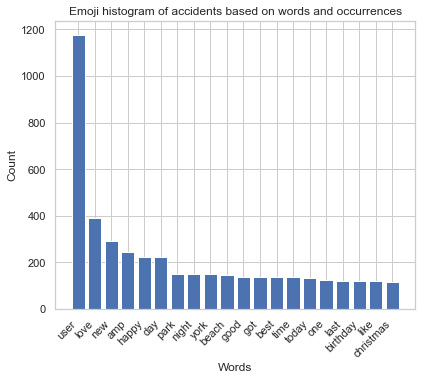

In [38]:
#Here we simply plot the distribution
fig = plt.figure(figsize = (5,4))
axes = fig.add_axes([0,0,1,1])
axes.bar(emoji_top_20_val.keys(),emoji_top_20_val.values())
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

In [39]:
# Here we multiply the frequency with the rank

In [40]:
li =  []
counter = 1
for elm in emoji_top_20_val.values():
    li.append(elm * counter)
    counter += 1

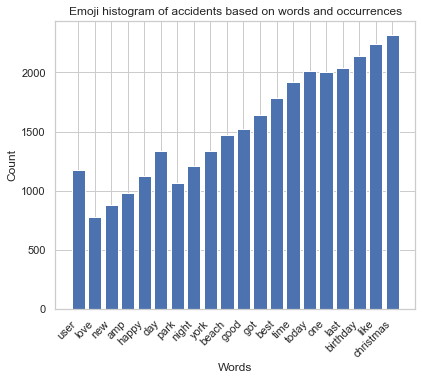

In [41]:
fig = plt.figure(figsize = (5,4))
axes = fig.add_axes([0,0,1,1])
axes.bar(emoji_top_20_val.keys(),li)
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

In [42]:
# Raw dataset
emoji_raw_val = word_frequency(emoji_words_val_txt)
emoji_raw_train = word_frequency(emoji_words_train_txt)
emoji_raw_test = word_frequency(emoji_words_test_txt)

In [43]:
thing = most_common_words(emoji_raw_val)

In [44]:
li =  []
counter = 1
for elm in thing.values():
    li.append(elm * counter)
    counter += 1
    if counter == 51:
        break

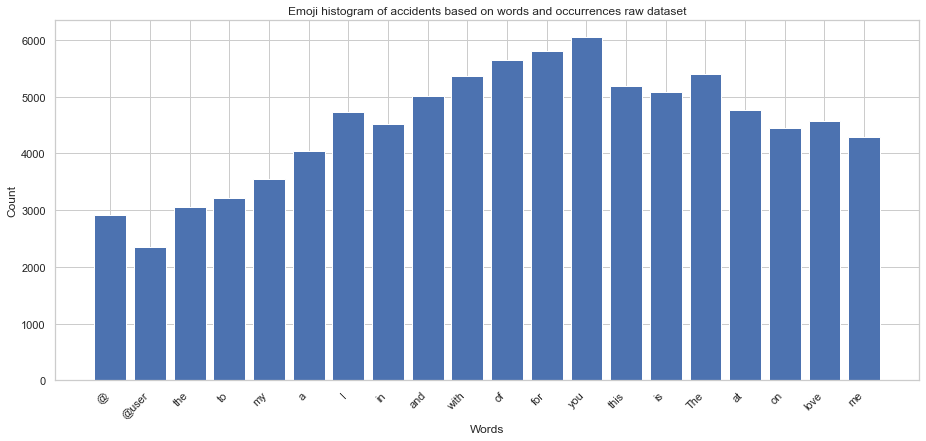

In [45]:
fig = plt.figure(figsize = (12,5))
axes = fig.add_axes([0,0,1,1])
axes.bar(list(thing.keys())[:20],li[:20])
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences raw dataset')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

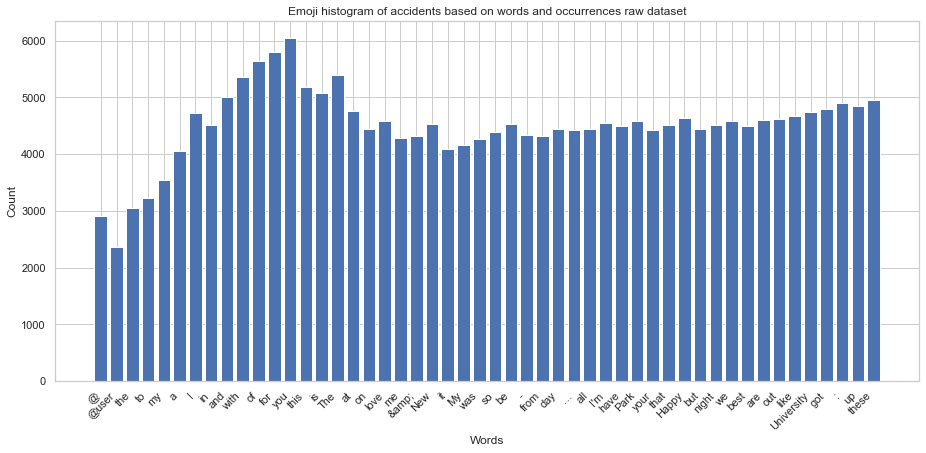

In [46]:
fig = plt.figure(figsize = (12,5))
axes = fig.add_axes([0,0,1,1])
axes.bar(list(thing.keys())[:50],li)
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences raw dataset')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

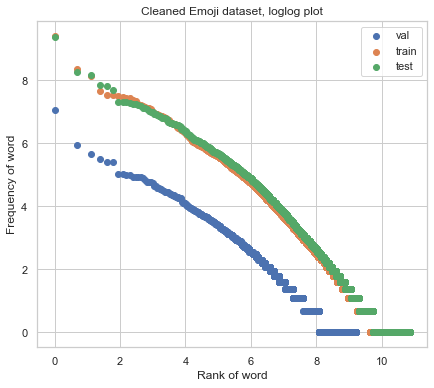

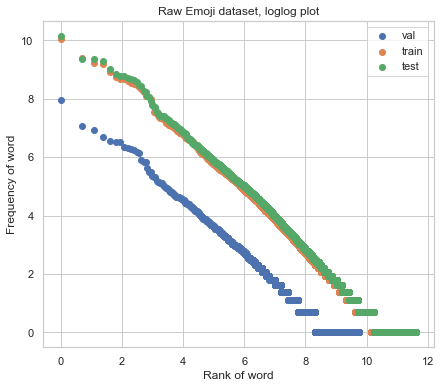

In [47]:
# Cleaned dataset:
llplot([emoji_freq_words_val, emoji_freq_words_train, emoji_freq_words_test], labels=["val", "train", "test"], title="Cleaned Emoji dataset, loglog plot")



llplot([emoji_raw_val, emoji_raw_train, emoji_raw_test], labels=["val", "train", "test"], title="Raw Emoji dataset, loglog plot")

## Type/token ratio

In [48]:
_, tokens, _, _,unique_tokens, _ ,_ = basic_statistics(emoji_text_train,printer = True)

The number of characters: 3285761
The number of tokens is: 671468
The number of sentences is: 23566
The average number of tokens per sentence is: 20
The number of unique tokens are: 45902
The tokens ratio is: 0.068
The number of total tokens after removing stopwords are: 314706


## Offensive dataset

## Size of our offensive vocabulary

In [49]:
print("Number of total words in the vocabulary " + str(len(offensive_freq_words_train)))

Number of total words in the vocabulary 17033


### Top 20 most common tokens 

In [50]:
offensive_top_20_val = top_20_most_common_words(offensive_freq_words_val)
offensive_top_20_train = top_20_most_common_words(offensive_freq_words_train)
offensive_top_20_test = top_20_most_common_words(offensive_freq_words_test)

print('Top 20 in val_text.txt:\n',offensive_top_20_val, '\n')
print('Top 20 in val_train.txt:\n',offensive_top_20_train,'\n')
print('Top 20 in val_test.txt:\n',offensive_top_20_test,'\n')

Top 20 in val_text.txt:
 {'user': 3455, 'liberals': 139, 'gun': 133, 'control': 125, 'antifa': 119, 'like': 110, 'conservatives': 107, 'maga': 98, 'people': 89, 'know': 77, 'get': 74, 'one': 72, 'trump': 70, 'think': 68, 'amp': 62, 'would': 61, 'want': 55, 'us': 52, 'going': 47, 'right': 46} 

Top 20 in val_train.txt:
 {'user': 29961, 'liberals': 1265, 'gun': 1230, 'control': 1097, 'antifa': 1051, 'like': 997, 'maga': 912, 'conservatives': 842, 'people': 832, 'amp': 615, 'get': 588, 'trump': 568, 'one': 568, 'know': 560, 'would': 507, 'think': 485, 'good': 418, 'right': 413, 'time': 350, 'us': 346} 

Top 20 in val_test.txt:
 {'user': 608, 'liberals': 81, 'conservatives': 80, 'antifa': 74, 'like': 65, 'gun': 64, 'control': 64, 'maga': 57, 'get': 51, 'one': 48, 'people': 47, 'trump': 44, 'us': 42, 'love': 38, 'want': 37, 'via': 33, 'know': 31, 'good': 31, 'see': 30, 'going': 30} 



## Top 20 least common tokens

In [51]:
offensive_least_words_val = least_common_words(offensive_freq_words_val)
offensive_least_words_train = least_common_words(offensive_freq_words_train)
offensive_least_words_test = least_common_words(offensive_freq_words_test)
print('Top 20 least common words in offensive_freq_words_val \n',offensive_least_words_val[0:20], '\n')
print('Top 20 least common words in offensive_freq_words_train \n',offensive_least_words_train[0:20], '\n')
print('Top 20 least common words in offensive_freq_words_test \n',offensive_least_words_test[0:20], '\n')

Top 20 least common words in offensive_freq_words_val 
 [('wiiu', 1), ('console', 1), ('az', 1), ('underage', 1), ('lionsden', 1), ('affect', 1), ('hazard', 1), ('club', 1), ('finger', 1), ('aid', 1), ('constituent', 1), ('disclosure', 1), ('etiquette', 1), ('moderation', 1), ('city', 1), ('ft', 1), ('richer', 1), ('sendhim', 1), ('allegation', 1), ('teen', 1)] 

Top 20 least common words in offensive_freq_words_train 
 [('countrymen', 1), ('breitbarters', 1), ('progressing', 1), ('reads', 1), ('unto', 1), ('optic', 1), ('vetsresistsquadron', 1), ('scout', 1), ('lifetimes', 1), ('obummer', 1), ('plethora', 1), ('peruse', 1), ('lighting', 1), ('torches', 1), ('checkmarks', 1), ('verifiedhate', 1), ('lmfaoooooo', 1), ('shitbiscuit', 1), ('tempe', 1), ('licensereporters', 1)] 

Top 20 least common words in offensive_freq_words_test 
 [('ibelieveblaseyford', 1), ('libreal', 1), ('snowflake', 1), ('iran', 1), ('johnkerryiranmeeting', 1), ('angels', 1), ('runs', 1), ('homers', 1), ('connects

## Zipf's Law

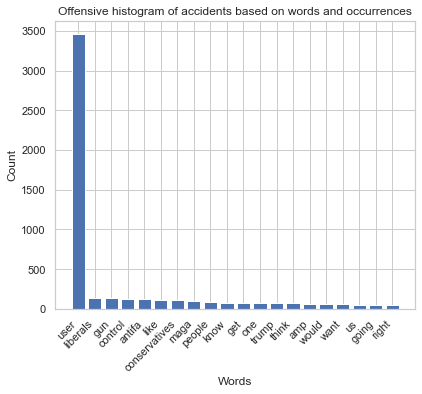

In [52]:
fig = plt.figure(figsize = (5,4))
axes = fig.add_axes([0,0,1,1])
axes.bar(offensive_top_20_val.keys(),offensive_top_20_val.values())
fig.autofmt_xdate(rotation=45)
axes.set_title('Offensive histogram of accidents based on words and occurrences')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

In [53]:
li =  []
counter = 1
for elm in offensive_top_20_val.values():
    li.append(elm * counter)
    counter += 1

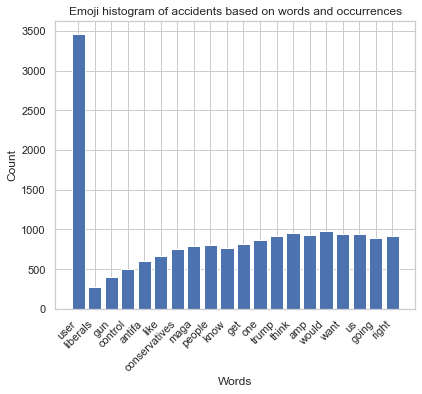

In [54]:
fig = plt.figure(figsize = (5,4))
axes = fig.add_axes([0,0,1,1])
axes.bar(offensive_top_20_val.keys(),li)
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

In [55]:
# Raw dataset
offensive_raw_val = word_frequency(offensive_words_val_txt)
offensive_raw_train = word_frequency(offensive_words_train_txt)
offensive_raw_test = word_frequency(offensive_words_test_txt)


In [56]:
thing = most_common_words(offensive_raw_val)

In [57]:
li =  []
counter = 1
for elm in thing.values():
    li.append(elm * counter)
    counter += 1
    if counter == 51:
        break

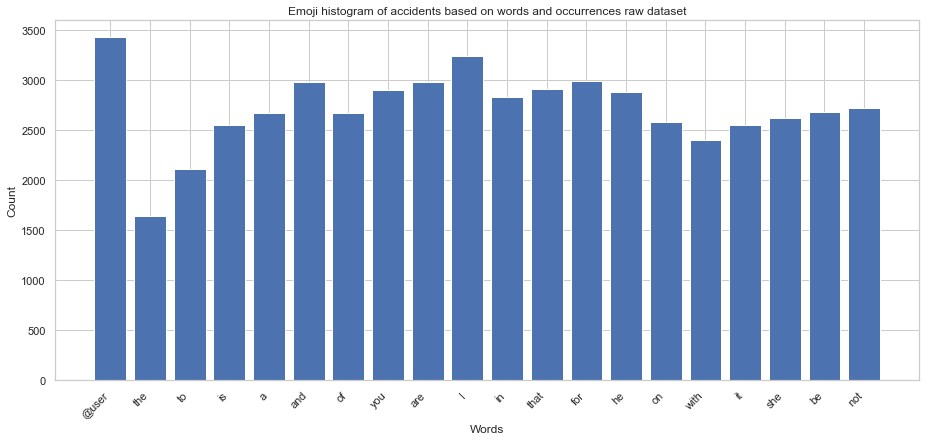

In [58]:
fig = plt.figure(figsize = (12,5))
axes = fig.add_axes([0,0,1,1])
axes.bar(list(thing.keys())[:20],li[:20])
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences raw dataset')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

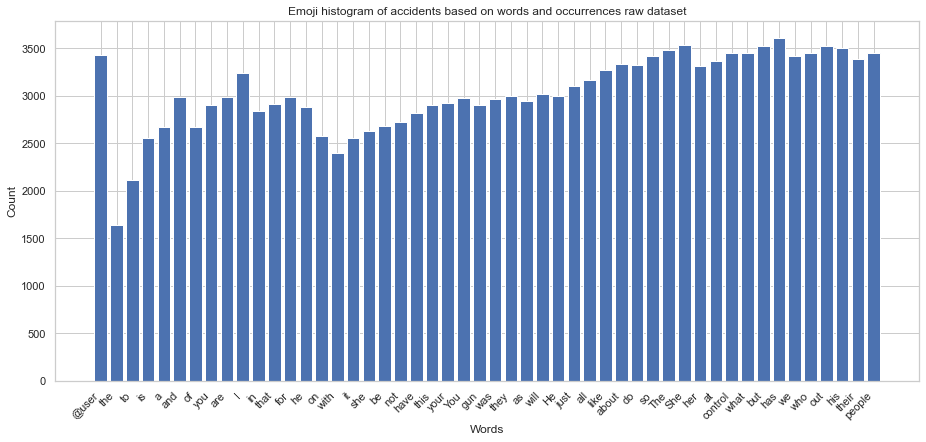

In [59]:
fig = plt.figure(figsize = (12,5))
axes = fig.add_axes([0,0,1,1])
axes.bar(list(thing.keys())[:50],li[:50])
fig.autofmt_xdate(rotation=45)
axes.set_title('Emoji histogram of accidents based on words and occurrences raw dataset')
axes.set_ylabel('Count')
axes.set_xlabel('Words');

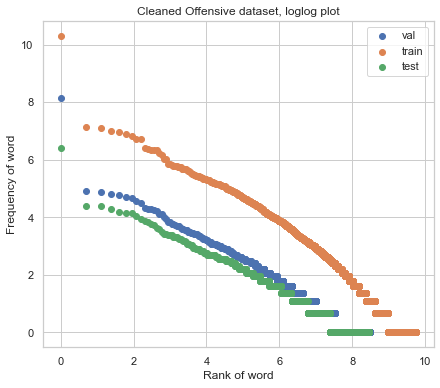

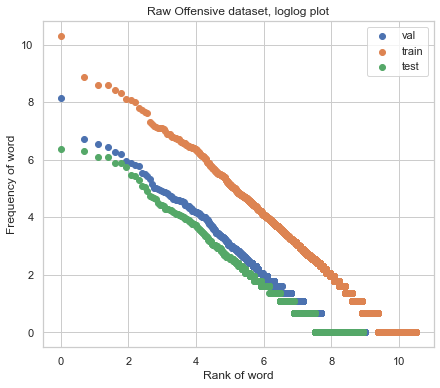

In [60]:
# Cleaned dataset:
llplot([offensive_freq_words_val, offensive_freq_words_train, offensive_freq_words_test], labels=["val", "train", "test"], title="Cleaned Offensive dataset, loglog plot")

llplot([offensive_raw_val, offensive_raw_train, offensive_raw_test], labels=["val", "train", "test"], title="Raw Offensive dataset, loglog plot")

There is an overall trend that the follows the law, however, this is has not been proven mathematicly, and our plots doesn't follow the excact distributions as described.

## Type/token ratio

In [61]:
_, tokens, _, _,unique_tokens, _ ,_ = basic_statistics(offensive_text_train,printer = True)

The number of characters: 1510503
The number of tokens is: 336814
The number of sentences is: 18122
The average number of tokens per sentence is: 14
The number of unique tokens are: 17182
The tokens ratio is: 0.051
The number of total tokens after removing stopwords are: 147828


***

## Data frames for offensive train text and offensive test text

In [62]:


train = pd.read_csv('datasets/offensive/train_text.txt', header=None, skiprows = 0, names=['tweet'], sep='\t', quoting=3)
print("Training Set:"% train.columns, train.shape, len(train))


test = pd.read_csv('datasets/offensive/test_text.txt',header=None, skiprows = 0, names=['tweet'], sep='\t', quoting=3)
print("Test Set:"% test.columns, test.shape, len(test))

Training Set: (11916, 1) 11916
Test Set: (860, 1) 860


In [63]:

index_train = [x for x in range(1, len(train.values)+1)]
index_test = [x for x in range(1, len(test.values)+1)]

train.insert(loc=0, column='id', value =index_train )
test.insert(loc=0, column='id', value =index_test )

train_labels = pd.read_csv('datasets/offensive/train_labels.txt',header=None, skiprows = 0, names=['label'], sep='\t', quoting=3)
train_labels.insert(loc=0, column='id', value=index_train)

test_labels = pd.read_csv('datasets/offensive/test_labels.txt',header=None, skiprows = 0, names=['label'], sep='\t', quoting=3)
test_labels.insert(loc=0, column='id', value =index_test )


test_df = test.merge(test_labels, on='id', how='left')
train_df = train.merge(train_labels, on='id', how='left')




In [64]:
train_df.head()

,id,tweet,label
0,1,@user Bono... who cares. Soon people will unde...,0
1,2,@user Eight years the republicans denied obama...,1
2,3,@user Get him some line help. He is gonna be j...,0
3,4,@user @user She is great. Hi Fiona!,0
4,5,@user She has become a parody unto herself? Sh...,1


In [65]:
test_df.head()

,id,tweet,label
0,1,#ibelieveblaseyford is liar she is fat ugly li...,1
1,2,@user @user @user I got in a pretty deep debat...,0
2,3,"...if you want more shootings and more death, ...",0
3,4,Angels now have 6 runs. Five of them have come...,0
4,5,#Travel #Movies and Unix #Fortune combined Vi...,0


In [66]:
test_clean = clean_text(test_df, 'tweet')
train_clean = clean_text(train_df, 'tweet')

In [67]:
stop = stopwords.words('english')

train_clean['tweet'] = train_clean['tweet'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
train_clean.head()

,id,tweet,label
0,1,bono cares soon people understand gain nothing...,0
1,2,eight years republicans denied obama picks bre...,1
2,3,get line help gonna fine game went could see p...,0
3,4,great hi fiona,0
4,5,become parody unto certainly taken heat well i...,1


In [68]:
stop = stopwords.words('english')
test_clean['tweet'] = test_clean['tweet'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

test_clean.head()

,id,tweet,label
0,1,ibelieveblaseyford liar fat ugly libreal snowf...,1
1,2,got pretty deep debate friend told latinos tru...,0
2,3,want shootings death listen aclu black lives m...,0
3,4,angels 6 runs five come courtesy mike trout ho...,0
4,5,travel movies unix fortune combined visit sali...,0


In [69]:
test_clean['tweet'] = test_clean['tweet'].apply(lambda x: word_tokenize(x))
test_clean.head()

,id,tweet,label
0,1,"[ibelieveblaseyford, liar, fat, ugly, libreal,...",1
1,2,"[got, pretty, deep, debate, friend, told, lati...",0
2,3,"[want, shootings, death, listen, aclu, black, ...",0
3,4,"[angels, 6, runs, five, come, courtesy, mike, ...",0
4,5,"[travel, movies, unix, fortune, combined, visi...",0


In [70]:

test_clean_offensive = test_clean.loc[test_clean['label'] == 1]
test_clean_offensive.head()
#test_clean_offensive['tweet'].to_csv('test_cleaned_off_lang_df.csv',  quoting=csv.QUOTE_NONE, escapechar=' ') 

,id,tweet,label
0,1,"[ibelieveblaseyford, liar, fat, ugly, libreal,...",1
8,9,"[grown, ass, woman, probably, 10, years, older...",1
10,11,"[kavanaugh, disciple, anthony, kennedy, ed, li...",1
15,16,"[apparently, committed, going, new, level, sin...",1
18,19,"[50, cent, calls, joe, budden, bullshit, insta...",1


In [71]:
test_clean_nonoffensive = test_clean.loc[test_clean['label'] == 0]

#test_clean_nonoffensive['tweet'].to_csv('test_cleaned_non_off_lang_df.csv',  quoting=csv.QUOTE_NONE, escapechar=' ') 

test_clean_nonoffensive.head()

,id,tweet,label
1,2,"[got, pretty, deep, debate, friend, told, lati...",0
2,3,"[want, shootings, death, listen, aclu, black, ...",0
3,4,"[angels, 6, runs, five, come, courtesy, mike, ...",0
4,5,"[travel, movies, unix, fortune, combined, visi...",0
5,6,"[naturephotography, nature, birds, wild, wisco...",0


In [72]:
test_off_lists = test_clean_offensive['tweet'].values.tolist()
test_off_lists[0]

['ibelieveblaseyford',
 'liar',
 'fat',
 'ugly',
 'libreal',
 'snowflake',
 'sold',
 'get',
 'cash',
 'dems',
 'iran',
 'spoke',
 'johnkerryiranmeeting']

In [73]:
test_non_off_lists = test_clean_nonoffensive['tweet'].values.tolist()
test_non_off_lists[0]

['got',
 'pretty',
 'deep',
 'debate',
 'friend',
 'told',
 'latinos',
 'trump',
 'blacks',
 'trump',
 'paid',
 'supporters',
 'said',
 'mean',
 'antifa',
 'paid',
 'domestic',
 'terrorist',
 'said',
 'anti',
 'fascist',
 'said',
 'fascist',
 'kidding']

# Task 04 - Automatic Prediction

In [74]:
# Merging validation text and labels
val_df = merging_labels_and_sentences('datasets/offensive/val_text', 'datasets/offensive/val_labels')

# Checking for missing values
missing_val = missing_values(val_df)
# Average words devided into labels
avg_labels_word = word_count(val_df)
avg_labels_char = char_count(val_df)

print(' Average Number of Words - Offensive Tweets: ', avg_labels_word[1],'\n','Average Number of Words - Non-offensive Tweets: ', avg_labels_word[2])
print(' Average Characters in Offensive Tweets: ', avg_labels_char[1],'\n','Average Characters in Non-offensive Tweets: ', avg_labels_char[2])

print('\nNumber of missing values for each column\n',missing_val)



 Average Number of Words - Offensive Tweets:  25.569 
 Average Number of Words - Non-offensive Tweets:  22.151
 Average Characters in Offensive Tweets:  143.852 
 Average Characters in Non-offensive Tweets:  126.98

Number of missing values for each column
 id       0
tweet    0
label    0
dtype: int64


C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


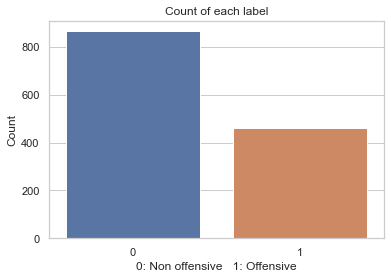

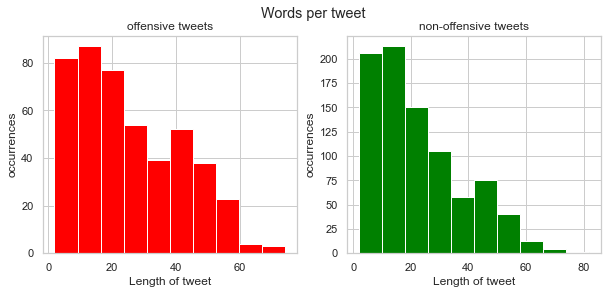

In [75]:
# Number of total labels for each class: 0 = non offensive, 1 = offensive
barplot = class_distribution(val_df,"Count of each label","0: Non offensive   1: Offensive")
# Histogram of Word count pr tweet
plot_word_count = plot_word_count(val_df)

## Term Frequency-Inverse Document Frequencies

Term Frequency-Inverse Document Frequencies (tf-Idf): Count vectors might not be the best representation for converting text data to numerical data. So, instead of simple counting, we can also use an advanced variant of the Bag-of-Words that uses the term frequency–inverse document frequency (or Tf-Idf). Basically, the value of a word increases proportionally to count in the document, but it is inversely proportional to the frequency of the word in the corpus

# We are splitting the data into training and test
X_train, X_test, y_train, y_test = split_dataset_2(val_df,labels)

# Here we tokenize the data
X_train_tok, X_test_tok = tokenize_train_test_2(X_train[:,0].tolist(), X_test[:,0].tolist())

# (tf-Idf)
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
X_train_vectors_tfidf = tfidf_vectorizer.fit_transform(X_train.tolist()) 
X_test_vectors_tfidf = tfidf_vectorizer.transform(X_test.tolist())


val_df['clean_text_tok']=[nltk.word_tokenize(i) for i in val_df['tweet']]
model = gensim.models.Word2Vec(val_df['clean_text_tok'],min_count=1)
w2v = dict(zip(model.wv.index_to_key, model.wv))      
modelw = MeanEmbeddingVectorizer(w2v)

# converting text to numerical data using Word2Vec
X_train_vectors_w2v = modelw.transform(X_train_tok)
X_test_vectors_w2v = modelw.transform(X_test_tok)

In [76]:
# We are splitting the data into training and test
X_train, X_test, y_train, y_test = split_dataset(val_df)

# Here we tokenize the data
X_train_tok, X_test_tok = tokenize_train_test(X_train, X_test)

# (tf-Idf)
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
X_train_vectors_tfidf = tfidf_vectorizer.fit_transform(X_train) 
X_test_vectors_tfidf = tfidf_vectorizer.transform(X_test)


val_df['clean_text_tok']=[nltk.word_tokenize(i) for i in val_df['tweet']]
model = gensim.models.Word2Vec(val_df['clean_text_tok'],min_count=1)
w2v = dict(zip(model.wv.index_to_key, model.wv))      
modelw = MeanEmbeddingVectorizer(w2v)

# converting text to numerical data using Word2Vec
X_train_vectors_w2v = modelw.transform(X_train_tok)
X_test_vectors_w2v = modelw.transform(X_test_tok)

In [77]:
corpus = X_train[0:4]
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(corpus)

In [78]:
X.shape # This is baseline

(4, 40)

In [79]:
l = [x for x in range(20)]

In [80]:
new = np.append(X,l)

In [81]:
new

array([<4x40 sparse matrix of type '<class 'numpy.int64'>'
       	with 46 stored elements in Compressed Sparse Row format>, 0, 1, 2,
       3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
      dtype=object)

In [82]:
print(np.array(new))

[<4x40 sparse matrix of type '<class 'numpy.int64'>'
 	with 46 stored elements in Compressed Sparse Row format> 0 1 2 3 4 5 6 7
 8 9 10 11 12 13 14 15 16 17 18 19]


In [83]:
tfidf_vectorizer = TfidfVectorizer(use_idf=True)

In [84]:
X_train_vectors_w2v.shape

(1059, 100)

In [85]:
w2v

{'@': array([-0.9395559 ,  0.6613949 ,  0.6689794 ,  0.71851397,  0.12521987,
        -1.5229622 ,  1.2013854 ,  2.460464  , -1.0410022 , -1.3813293 ,
         0.24823415, -1.6587452 , -0.94605494,  0.87024677,  0.22773513,
        -0.30472267,  0.66863245, -0.31931412, -0.59671605, -2.042326  ,
         0.6035028 ,  0.51990163,  1.2204875 , -0.52431124,  0.06856492,
         0.28475592, -0.82130533,  0.45116854, -1.1133088 ,  0.35633895,
         1.0923766 , -0.44024843,  0.7436476 , -1.7397909 , -0.5304204 ,
         0.99814534,  0.27643996, -0.33268517,  0.08331417, -1.0423958 ,
         0.4279471 , -0.92587113, -1.2512912 , -0.1850003 ,  0.9697902 ,
         0.33258626, -1.2251168 , -0.08326096,  0.9162423 ,  0.80653614,
        -0.04457363, -1.1686174 , -0.08176365,  0.11006457, -0.26249278,
         0.45930013,  1.0592414 , -0.00850471, -0.7593057 ,  0.4916746 ,
         0.24805193,  0.11699153,  0.34328383, -0.67257595, -0.5181863 ,
         1.1644361 ,  0.45964122,  0.9812364 ,

In [86]:
X_train_vectors_w2v[0]

array([-0.09088472,  0.20508823,  0.02111315, -0.20933057,  0.22819972,
       -0.523238  ,  0.30439484,  0.85058767, -0.25456288, -0.36697757,
       -0.1840916 , -0.55641586, -0.01294126, -0.0664871 ,  0.31344613,
       -0.27122682, -0.00307054, -0.51974857,  0.09467211, -0.8384169 ,
        0.01548789,  0.15153438,  0.01630413, -0.0643842 , -0.4430152 ,
        0.10255148, -0.20059326, -0.13154411, -0.27716747,  0.06927238,
        0.43043727, -0.03017322,  0.05149352, -0.4042414 , -0.34666327,
        0.47123465, -0.35075095, -0.26624975, -0.4279414 , -0.66290164,
        0.19788933, -0.2646993 , -0.02788868,  0.04250251,  0.5892955 ,
       -0.21145476, -0.5477347 , -0.25017512,  0.28530988,  0.14804311,
       -0.00391713, -0.35662797,  0.03510544, -0.13968694, -0.35559002,
        0.06043799,  0.06990055, -0.00533244, -0.13416657, -0.383151  ,
        0.47641918, -0.00602063,  0.37777326,  0.13091198, -0.49359936,
        0.49400932, -0.05034926,  0.402482  , -0.7719128 ,  0.19

## Logistic regression (tf-idf)

In [87]:
#FITTING THE CLASSIFICATION MODEL using Logistic Regression(tf-idf)

lr_tfidf=LogisticRegression(solver = 'liblinear', C=10, penalty = 'l2')

lr_tfidf.fit(X_train_vectors_tfidf, y_train)  

#Predict y value for test dataset
y_predict = lr_tfidf.predict(X_test_vectors_tfidf)
y_prob = lr_tfidf.predict_proba(X_test_vectors_tfidf)[:,1]
print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))
 
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

              precision    recall  f1-score   support

           0       0.71      0.83      0.77       175
           1       0.52      0.36      0.42        90

    accuracy                           0.67       265
   macro avg       0.62      0.59      0.59       265
weighted avg       0.65      0.67      0.65       265

Confusion Matrix: [[145  30]
 [ 58  32]]
AUC: 0.7054603174603175


In [113]:
y_prob

array([0.27435307, 0.26066376, 0.35733222, 0.33360088, 0.40057331,
       0.33832893, 0.41503725, 0.43580118, 0.39345818, 0.40341206,
       0.22788599, 0.38474997, 0.35140894, 0.36635928, 0.39189115,
       0.39996556, 0.3303284 , 0.40129438, 0.28150264, 0.40344758,
       0.29800784, 0.35258897, 0.33807545, 0.30264404, 0.29467681,
       0.42289823, 0.30687772, 0.42438719, 0.37519462, 0.41067112,
       0.41875212, 0.4059593 , 0.46540609, 0.26093306, 0.308669  ,
       0.326678  , 0.4158514 , 0.37186894, 0.35616694, 0.40075442,
       0.4326193 , 0.39384029, 0.32372348, 0.36825114, 0.30416859,
       0.24455131, 0.45055938, 0.38284218, 0.44256743, 0.20884231,
       0.37964761, 0.37892601, 0.4033001 , 0.3059458 , 0.27039062,
       0.23628012, 0.35530925, 0.37111639, 0.30085971, 0.35097977,
       0.42425016, 0.40048145, 0.38636566, 0.42922643, 0.27073438,
       0.39459894, 0.23745592, 0.39620716, 0.40278165, 0.24260918,
       0.20958938, 0.39155292, 0.30757285, 0.41124755, 0.27933

In [88]:
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html

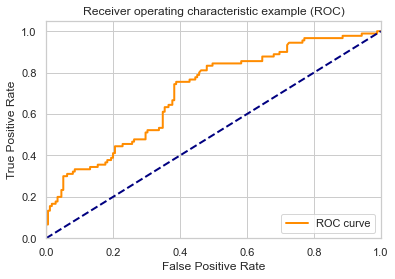

In [89]:
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example (ROC)')
plt.legend(loc="lower right")
plt.show()

In [90]:
#FITTING THE CLASSIFICATION MODEL using Logistic Regression (W2v)

lr_w2v=LogisticRegression(solver = 'liblinear', C=10, penalty = 'l2')
lr_w2v.fit(X_train_vectors_w2v, y_train)  #model

#Predict y value for test dataset
y_predict = lr_w2v.predict(X_test_vectors_w2v)
y_prob = lr_w2v.predict_proba(X_test_vectors_w2v)[:,1]

print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))
 
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

              precision    recall  f1-score   support

           0       0.66      0.99      0.79       175
           1       0.50      0.01      0.02        90

    accuracy                           0.66       265
   macro avg       0.58      0.50      0.41       265
weighted avg       0.61      0.66      0.53       265

Confusion Matrix: [[174   1]
 [ 89   1]]
AUC: 0.5169206349206349


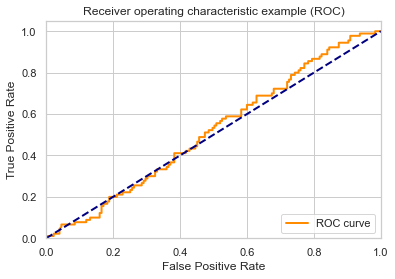

In [91]:
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example (ROC)')
plt.legend(loc="lower right")
plt.show()

# Naive

# Test

In [92]:

def split_dataset(dataframe):
    X_train, X_test, y_train, y_test = train_test_split(dataframe["tweet"],dataframe      
    ["label"],test_size=0.2,shuffle=True)
    return X_train, X_test, y_train, y_test

def split_dataset_2(dataframe,labels):
    counter = 0
    li = []
    for rows in dataframe.iterrows():
        row = []
        for elm in labels:
            row.append(rows[1][elm])
        li.append(row)
    
    X_train, X_test, y_train, y_test = train_test_split(li,dataframe["label"],test_size=0.2,shuffle=True)
    return X_train,X_test, y_train, y_test
labels = ["tweet","word_count","char_count"]

In [93]:
test = val_df.copy()

In [94]:
test = test.drop(["id"],axis = 1)

In [95]:
test

,tweet,label,word_count,char_count,clean_text_tok
0,@user @user WiiU is not even a real console.,0,9,45,"[@, user, @, user, WiiU, is, not, even, a, rea..."
1,@user @user @user If he is from AZ I would put...,1,18,83,"[@, user, @, user, @, user, If, he, is, from, ..."
2,@user I thought Canada had strict gun control....,0,14,86,"[@, user, I, thought, Canada, had, strict, gun..."
3,@user @user @user @user @user @user @user @use...,0,28,173,"[@, user, @, user, @, user, @, user, @, user, ..."
4,1 Minute of Truth: Gun Control via @user,0,8,41,"[1, Minute, of, Truth, :, Gun, Control, via, @..."
...,...,...,...,...,...
1319,@user @user Whose twitter interest start with ...,0,24,143,"[@, user, @, user, Whose, twitter, interest, s..."
1320,"@user @user How did the press"""" get the letter...",0,9,59,"[@, user, @, user, How, did, the, press, '', '..."
1321,@user @user @user @user @user @user Sorry abou...,0,52,277,"[@, user, @, user, @, user, @, user, @, user, ..."
1322,@user Fuck Alan I’m sorry,1,5,26,"[@, user, Fuck, Alan, I, ’, m, sorry]"


In [96]:
li = []
counter = 0
for elm in test["tweet"]:
    li.append(len(re.findall("@user", elm)))

In [97]:
test["Tags"] = li

In [98]:
df_off = test.where(test["label"] == 1).dropna()
df_not_off = test.where(test["label"] == 0).dropna()

In [99]:
df_not_off

,tweet,label,word_count,char_count,clean_text_tok,Tags
0,@user @user WiiU is not even a real console.,0.0,9.0,45.0,"[@, user, @, user, WiiU, is, not, even, a, rea...",2.0
2,@user I thought Canada had strict gun control....,0.0,14.0,86.0,"[@, user, I, thought, Canada, had, strict, gun...",1.0
3,@user @user @user @user @user @user @user @use...,0.0,28.0,173.0,"[@, user, @, user, @, user, @, user, @, user, ...",16.0
4,1 Minute of Truth: Gun Control via @user,0.0,8.0,41.0,"[1, Minute, of, Truth, :, Gun, Control, via, @...",1.0
5,@user @user @user We could help if you are Lon...,0.0,12.0,58.0,"[@, user, @, user, @, user, We, could, help, i...",3.0
...,...,...,...,...,...,...
1317,@user lmao i really didn’t know him before tha...,0.0,12.0,57.0,"[@, user, lmao, i, really, didn, ’, t, know, h...",1.0
1319,@user @user Whose twitter interest start with ...,0.0,24.0,143.0,"[@, user, @, user, Whose, twitter, interest, s...",2.0
1320,"@user @user How did the press"""" get the letter...",0.0,9.0,59.0,"[@, user, @, user, How, did, the, press, '', '...",2.0
1321,@user @user @user @user @user @user Sorry abou...,0.0,52.0,277.0,"[@, user, @, user, @, user, @, user, @, user, ...",6.0


In [100]:
Counter(df_off["Tags"])
Counter(df_not_off["Tags"])

Counter({2.0: 193,
         1.0: 393,
         16.0: 4,
         3.0: 79,
         4.0: 38,
         0.0: 87,
         10.0: 1,
         50.0: 11,
         42.0: 1,
         6.0: 12,
         12.0: 3,
         11.0: 6,
         7.0: 5,
         5.0: 17,
         28.0: 1,
         13.0: 1,
         15.0: 1,
         9.0: 3,
         14.0: 3,
         49.0: 3,
         8.0: 1,
         43.0: 2})

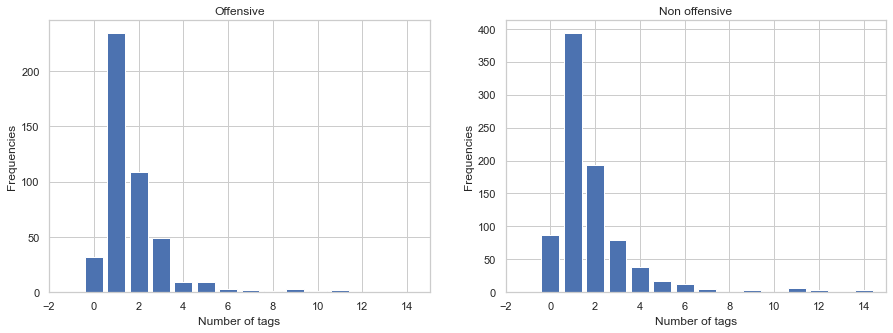

In [101]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
value = Counter(df_off["Tags"]).values()
keys = Counter(df_off["Tags"]).keys()
ax1.bar(keys,value)
ax1.set_ylabel("Frequencies")
ax1.set_xlabel("Number of tags")
ax1.set_title("Offensive")
ax1.set_xlim(-2,15)
value_2 = Counter(df_not_off["Tags"]).values()
keys_2 = Counter(df_not_off["Tags"]).keys()
ax2.bar(keys_2,value_2)
ax2.set_ylabel("Frequencies")
ax2.set_xlabel("Number of tags")
ax2.set_title("Non offensive")
ax2.set_xlim(-2,15)
plt.show()

In [102]:
test

,tweet,label,word_count,char_count,clean_text_tok,Tags
0,@user @user WiiU is not even a real console.,0,9,45,"[@, user, @, user, WiiU, is, not, even, a, rea...",2
1,@user @user @user If he is from AZ I would put...,1,18,83,"[@, user, @, user, @, user, If, he, is, from, ...",3
2,@user I thought Canada had strict gun control....,0,14,86,"[@, user, I, thought, Canada, had, strict, gun...",1
3,@user @user @user @user @user @user @user @use...,0,28,173,"[@, user, @, user, @, user, @, user, @, user, ...",16
4,1 Minute of Truth: Gun Control via @user,0,8,41,"[1, Minute, of, Truth, :, Gun, Control, via, @...",1
...,...,...,...,...,...,...
1319,@user @user Whose twitter interest start with ...,0,24,143,"[@, user, @, user, Whose, twitter, interest, s...",2
1320,"@user @user How did the press"""" get the letter...",0,9,59,"[@, user, @, user, How, did, the, press, '', '...",2
1321,@user @user @user @user @user @user Sorry abou...,0,52,277,"[@, user, @, user, @, user, @, user, @, user, ...",6
1322,@user Fuck Alan I’m sorry,1,5,26,"[@, user, Fuck, Alan, I, ’, m, sorry]",1


In [103]:
li = []
for elm in test["tweet"]:
    #li.append(re.sub('\W+',' ', elm ).strip()) # Removes all special characters
    clean = re.sub('\W+',' ', elm ).strip()
    clean = clean.lower()
    temp = []
    for i in clean:
        if i == " ":
            temp.append(0)
            #temp.append(" ")
        else:
            #k = str(i)
            temp.append((ord(i) - 97))
    li.append(temp)
test["Numeric"] = li

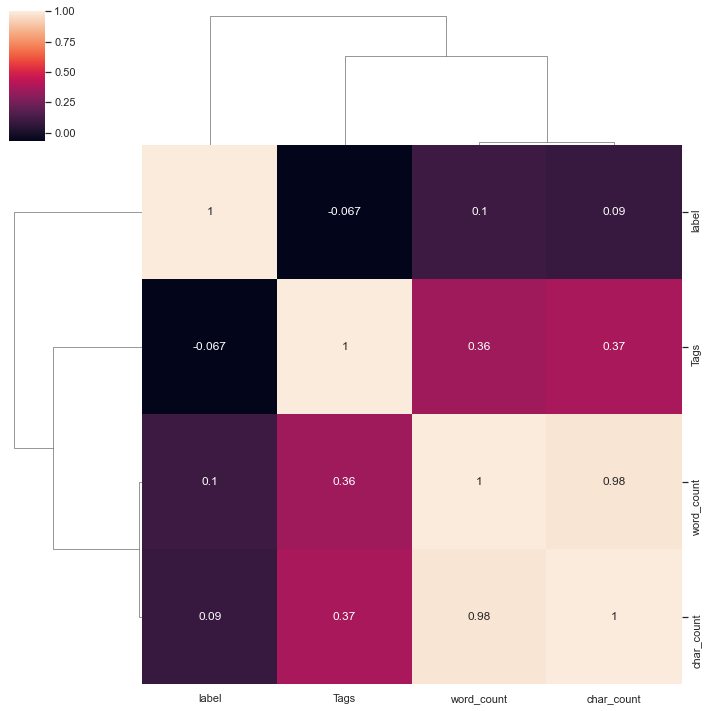

In [104]:
import seaborn as sns

# calculate the correlations
correlations = test.corr()

# plot the heatmap bb
#sns.heatmap(correlations, xticklabels=correlations.columns, yticklabels=correlations.columns, annot=True)

# plot the clustermap 
sns.clustermap(correlations, xticklabels=correlations.columns, yticklabels=correlations.columns, annot=True);

In [105]:
test = test.drop(["tweet","clean_text_tok","char_count","Tags"],axis = 1)

In [106]:
test

,label,word_count,Numeric
0,0,9,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 22, 8, 8,..."
1,1,18,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 20, 18, 4..."
2,0,14,"[20, 18, 4, 17, 0, 8, 0, 19, 7, 14, 20, 6, 7, ..."
3,0,28,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 20, 18, 4..."
4,0,8,"[-48, 0, 12, 8, 13, 20, 19, 4, 0, 14, 5, 0, 19..."
...,...,...,...
1319,0,24,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 22, 7, 14..."
1320,0,9,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 7, 14, 22..."
1321,0,52,"[20, 18, 4, 17, 0, 20, 18, 4, 17, 0, 20, 18, 4..."
1322,1,5,"[20, 18, 4, 17, 0, 5, 20, 2, 10, 0, 0, 11, 0, ..."


In [107]:
input = [[9,[20,18]],[6,[9,3,4]]]

In [108]:
X = np.array(list(zip(test["word_count"],test["Numeric"])))

C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.


In [109]:
li = []
for elm in zip(test["word_count"],test["Numeric"]):
    li.append([np.array(elm[0]),np.array(elm[1])])
    break
li[0][0]

array(9)

In [110]:
li = np.array(li[0])

C:\Users\Martin\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.


In [111]:
li.shape

(2,)

In [112]:
y = np.array(test["label"])
#from keras.utils import to_categorical
train_labels = to_categorical(y)

NameError: name 'to_categorical' is not defined

In [ ]:
from keras.datasets import mnist
#download mnist data and split into train and test sets
#(X_train_mnist, y_train_mnist), (X_test_mnist, y_test_mnist) = mnist.load_data()

In [ ]:
#reshape data to fit model
X_train = X_train.reshape(60000,28,28,1)
X_test = X_test.reshape(10000,28,28,1)

In [ ]:
from keras.utils import to_categorical
#one-hot encode target column
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
y_train[0]

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten
#create model
model = Sequential()
#add model layers
model.add(Conv2D(64, kernel_size=3, activation=’relu’, input_shape=(28,28,1)))
model.add(Conv2D(32, kernel_size=3, activation=’relu’))
model.add(Flatten())
model.add(Dense(10, activation=’softmax’))

In [ ]:
#compile model using accuracy to measure model performance
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
#train the model
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=3)

In [ ]:
#Train
li = []
for elm in  X_train_vectors_w2v:
    li.append(elm.reshape(10,10,1))
X_train_vectors_w2v = np.array(li)
something = abs(X_train_vectors_w2v)
maximum = np.amax(something)
X_train_vectors_w2v = np.divide(something,maximum)

In [ ]:
#Test
li = []
for elm in  X_test_vectors_w2v:
    li.append(elm.reshape(10,10,1))
X_test_vectors_w2v = np.array(li)
something = abs(X_test_vectors_w2v)
maximum = np.amax(something)
X_test_vectors_w2v = np.divide(something,maximum)

In [ ]:
X_train_vectors_w2v[0][0]

In [ ]:
X_test_vectors_w2v.shape

In [ ]:
from keras.utils import to_categorical
#one-hot encode target column
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
y_train[0]

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten

In [ ]:
#create model
model = Sequential()
#add model layers
model.add(Conv2D(10, kernel_size=3, activation="relu", input_shape=(10,10,1)))
model.add(Conv2D(5, kernel_size=3, activation="relu"))
model.add(Flatten())
model.add(Dense(2, activation="sigmoid"))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

In [ ]:
#train the model
model.fit(X_train_vectors_w2v, y_train, validation_data=(X_test_vectors_w2v, y_test), epochs=3)

In [ ]:
test = test.drop(["tweet","char_count","clean_text_tok"],axis = 1)

In [ ]:
test

In [ ]:
#test['clean_text_tok']=[nltk.word_tokenize(i) for i in test['tweet']]
model = gensim.models.Word2Vec(test['clean_text_tok'],min_count=1)
w2v = dict(zip(model.wv.index_to_key, model.wv))      
modelw = MeanEmbeddingVectorizer(w2v)

In [ ]:
X_train_vectors_w2v = modelw.transform(X_train_tok)

In [ ]:
len(X_train_vectors_w2v)

In [ ]:
test["w2v"] 

In [ ]:
# We are splitting the data into training and test
X_train, X_test, y_train, y_test = split_dataset(val_df)

# Here we tokenize the data
X_train_tok, X_test_tok = tokenize_train_test(X_train, X_test)

# (tf-Idf)
tfidf_vectorizer = TfidfVectorizer(use_idf=True)
X_train_vectors_tfidf = tfidf_vectorizer.fit_transform(X_train) 
X_test_vectors_tfidf = tfidf_vectorizer.transform(X_test)


val_df['clean_text_tok']=[nltk.word_tokenize(i) for i in val_df['tweet']]
model = gensim.models.Word2Vec(val_df['clean_text_tok'],min_count=1)
w2v = dict(zip(model.wv.index_to_key, model.wv))      
modelw = MeanEmbeddingVectorizer(w2v)

# converting text to numerical data using Word2Vec
X_train_vectors_w2v = modelw.transform(X_train_tok)
X_test_vectors_w2v = modelw.transform(X_test_tok)

In [ ]:
test = test.drop(["label"],axis = 1)

In [ ]:
test

In [ ]:
#featurespace**2

In [ ]:
#evt antallet af users

In [ ]:
import seaborn as sns

# calculate the correlations
correlations = test.corr()

# plot the heatmap 
#sns.heatmap(correlations, xticklabels=correlations.columns, yticklabels=correlations.columns, annot=True)

# plot the clustermap 
sns.clustermap(correlations, xticklabels=correlations.columns, yticklabels=correlations.columns, annot=True);

In [ ]:
#FITTING THE CLASSIFICATION MODEL using Naive Bayes(tf-idf)
nb_tfidf = MultinomialNB()
nb_tfidf.fit(X_train_vectors_tfidf, y_train) 

 #Predict y value for test dataset
y_predict = nb_tfidf.predict(X_test_vectors_tfidf)
y_prob = nb_tfidf.predict_proba(X_test_vectors_tfidf)[:,1]

print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))
 
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

In [ ]:
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example (ROC)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
# Sa
#model_prediction_preprocessed_data(val_df).to_csv('model_predict_proc_validation.csv')

In [ ]:
#model_prediction_nonprocessed_data(val_df).to_csv('model_predict_nonproc_validation.csv')

In [ ]:
# Merging validation text and labels
val_df_emoji = merging_labels_and_sentences('datasets/emoji/val_text', 'datasets/emoji/val_labels')

# Checking for missing values
missing_val_emoji = missing_values(val_df_emoji)
# Average words devided into labels
avg_labels_word_emoji = word_count(val_df_emoji)
avg_labels_char_emoji = char_count(val_df_emoji)

print(' Average Number of Words - Offensive Tweets: ', avg_labels_word_emoji[1],'\n','Average Number of Words - Non-offensive Tweets: ', avg_labels_word_emoji[2])
print(' Average Characters in Offensive Tweets: ', avg_labels_char_emoji[1],'\n','Average Characters in Non-offensive Tweets: ', avg_labels_char_emoji[2])

print('\nNumber of missing values for each column\n',missing_val_emoji)


In [ ]:
import numpy as np
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer

df = pd.read_csv('data/wine_data.csv')

counter = Counter(df['variety'].tolist())
top_10_varieties = {i[0]: idx for idx, i in enumerate(counter.most_common(10))}
df = df[df['variety'].map(lambda x: x in top_10_varieties)]

description_list = df['description'].tolist()
varietal_list = [top_10_varieties[i] for i in df['variety'].tolist()]
varietal_list = np.array(varietal_list)

count_vect = CountVectorizer()
x_train_counts = count_vect.fit_transform(description_list)


tfidf_transformer = TfidfTransformer()
x_train_tfidf = tfidf_transformer.fit_transform(x_train_counts)

train_x, test_x, train_y, test_y = train_test_split(x_train_tfidf, varietal_list, test_size=0.3)

clf = MultinomialNB().fit(train_x, train_y)
y_score = clf.predict(test_x)

n_right = 0
for i in range(len(y_score)):
    if y_score[i] == test_y[i]:
        n_right += 1

print("Accuracy: %.2f%%" % ((n_right/float(len(test_y)) * 100)))